### Load all the necessary libraries for the simulations
#install.packages("pracmae")
library("flowCore")
library("stringr")

### Stability and Correlation

In [2]:
Tm=read.csv("Tm_data.csv")
Tm

Background,Tm,Trait.Corrlation,Folder,k_initial,Refolding_yield
<fct>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>
WT,66.71,0.52,WT_rep,5.50,30.56
K102E,70.14,0.55,K102E,6.58,37.84
G66S,72.00,NA,G66S,13.22,45.45
Y204C,68.00,NA,Y204C,8.94,35.68
U,75.00,0.61,T,7.96,32.50
U+F47L,76.00,0.75,X_F47L,11.80,49.66
U+F65L,80.00,0.88,X_F65L,16.91,61.50
U+K102E,77.00,0.67,T_K102E,7.90,36.67
U+V164A,78.00,0.80,X_V164A,16.24,54.01


####################

---- Protein=U ----

####################

0.744471228586404

0.766186224065935

0.772495374877227



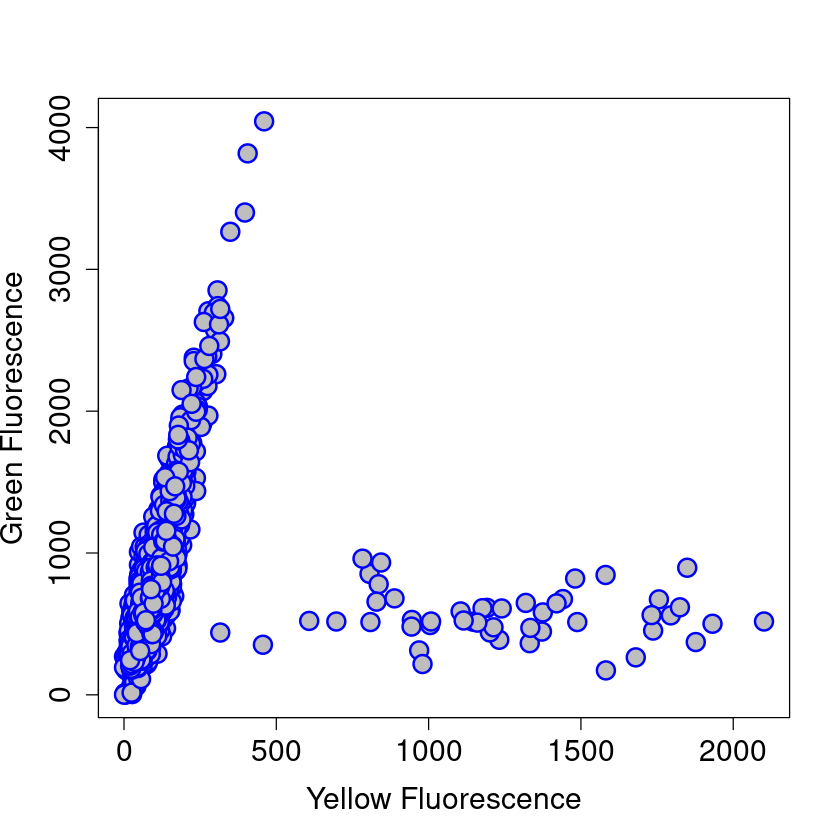

0.612843928797744



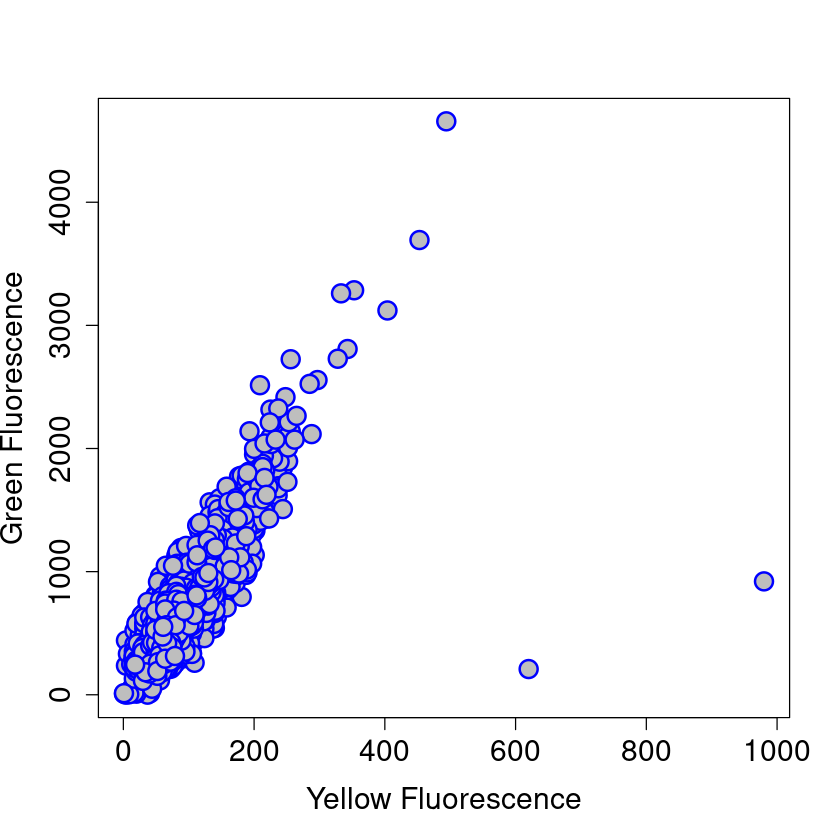

0.594813578738831



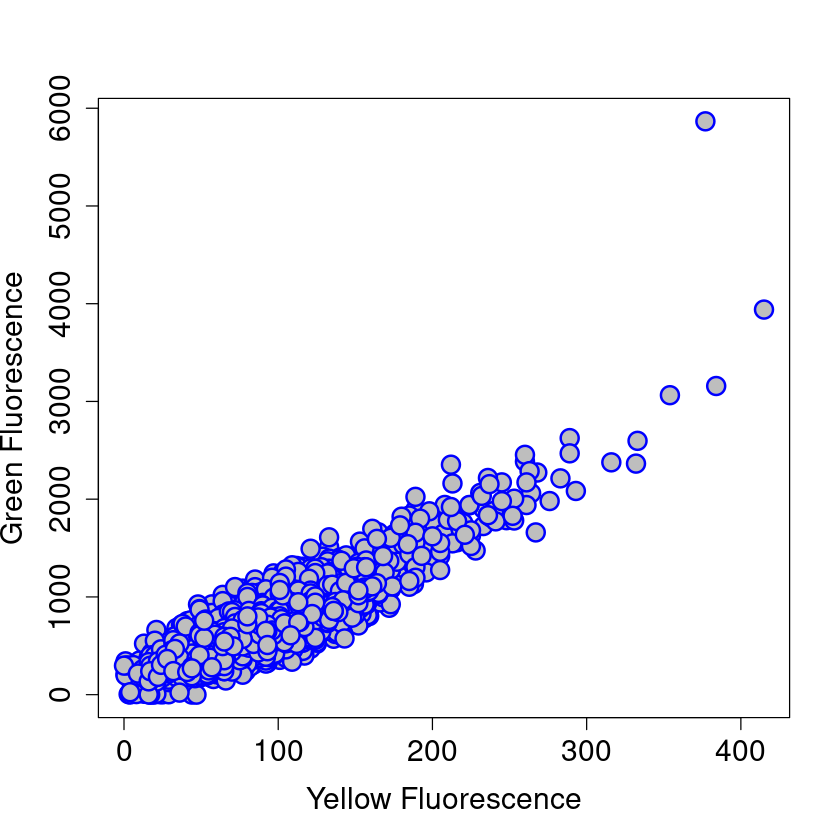

0.60579269628863



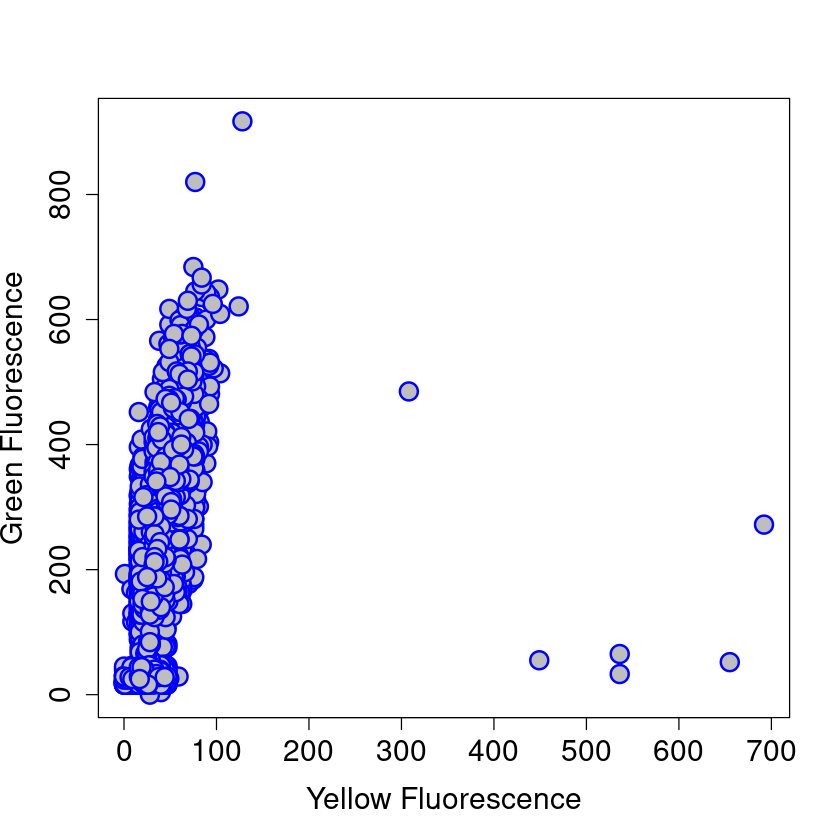

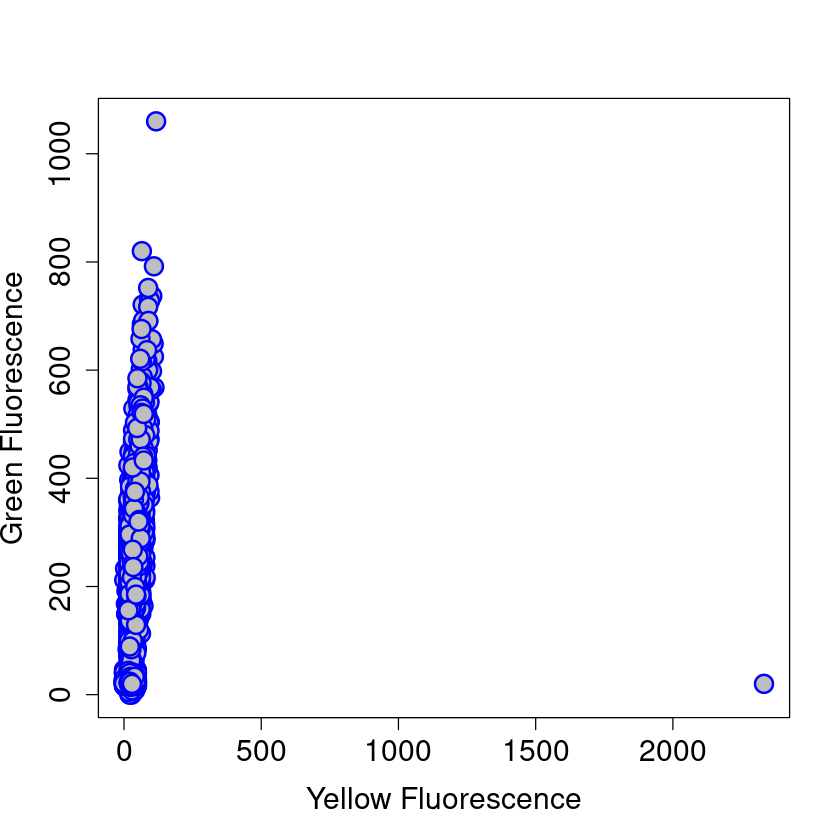

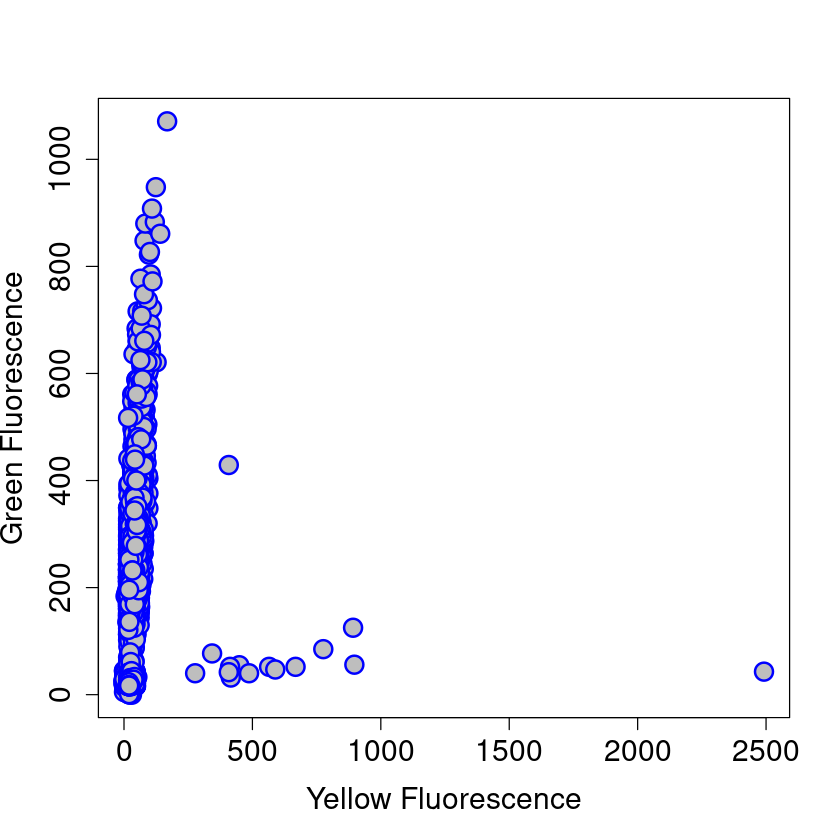

In [3]:
options(warn = -1)
Cor.coeff=Yellow_avg=Green_avg=rep(NA, dim(Tm)[1])

for (i in 5:5){

setwd("~/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/")

Folder=Tm$Folder[i]
setwd(paste("./Mutants_categorized_folders/",Folder,sep=""))

FACS_files=list.files(pattern = ".fcs")

R=rep(NA, length(FACS_files))

message("####################")
message("---- Protein=", Tm$Background[i], " ----")
message("####################")

for (j in 1:length(FACS_files)){


    FACS_temp=read.FCS(FACS_files[j])
    index_Y=which(colnames(FACS_temp@exprs)=="FITC-H")
    index_G=which(colnames(FACS_temp@exprs)=="AmCyan-H")
    
    #### Yellow and Green components
    Yellow=FACS_temp@exprs[,index_Y]
    Green=FACS_temp@exprs[,index_G]
     
        
    #### Correlation ###    
    COR=cor.test(FACS_temp@exprs[,index_Y], FACS_temp@exprs[,index_G], method="spearman")
    R[j]=COR$estimate
    
    message(R[j])
    
    plot(Yellow, Green, pch = 21, cex=2, col="blue", bg="GRAY", lwd=2, xlab="Yellow Fluorescence", ylab="Green Fluorescence", cex.axis=1.5, cex.lab=1.5)
     
}

Cor.coeff[i]=mean(R, na.rm = TRUE)


setwd("~/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/")


}

In [81]:
options(warn = -1)
Cor.coeff=Yellow_avg=Green_avg=rep(NA, dim(Tm)[1])

for (i in 1:dim(Tm)[1]){

setwd("~/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/")

Folder=Tm$Folder[i]
setwd(paste("./Mutants_categorized_folders/",Folder,sep=""))

FACS_files=list.files(pattern = ".fcs")

R=rep(NA, length(FACS_files))

message("####################")
message("---- Protein=", Tm$Background[i], " ----")
message("####################")

for (j in 1:length(FACS_files)){


    FACS_temp=read.FCS(FACS_files[j])
    index_Y=which(colnames(FACS_temp@exprs)=="FITC-H")
    index_G=which(colnames(FACS_temp@exprs)=="AmCyan-H")
    
    #### Yellow and Green components
    Yellow=FACS_temp@exprs[,index_Y]
    Green=FACS_temp@exprs[,index_G]
     
        
    #### Correlation ###    
    COR=cor.test(FACS_temp@exprs[,index_Y], FACS_temp@exprs[,index_G], method="spearman")
    R[j]=COR$estimate
    
    message(R[j])
          
      
}

Cor.coeff[i]=mean(R, na.rm = TRUE)


setwd("~/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/")

plot(Yellow, Green, main=Tm$Background[i], pch = 21, cex=2, col="blue", bg="GRAY", lwd=2, xlab="Yellow Fluorescence", ylab="Green Fluorescence", cex.axis=1.5, cex.lab=1.5, log="xy")

}

ERROR: Error in eval(expr, envir, enclos): object 'Tm' not found


In [371]:
Cor.coeff

[1] 0.5260162 0.5251740 0.9285123 0.7844064 0.6827672 0.7545598 0.8738205
 [8] 0.6867786 0.7887949 0.7829184

In [373]:
pdf("Kin_correlation.pdf")
par(mfrow = c(2,1))
plot(Tm$k_initial, Cor.coeff, cex=2, col="blue", pch=19, bg="GRAY", ylim=c(0.4,1), lwd=2, xlab="Refolding Yield", ylab="Trait Correlation (R)", cex.axis=1.5, cex.lab=1.5, method="spearman")
#cor.test(Tm$Refolding_yield, Cor.coeff, method="spearman")
dev.off()

pdf 
  2

In [277]:
cor.test(Cor.coeff, Tm$Tm, method="spearman")
cor.test(Cor.coeff, Tm$Refolding_yield, method="spearman")
cor.test(Tm$Refolding_yield, Tm$k_initial ,method="spearman")





	Spearman's rank correlation rho

data:  Cor.coeff and Tm$Tm
S = 87.766, p-value = 0.1725
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.4680873 



	Spearman's rank correlation rho

data:  Cor.coeff and Tm$Refolding_yield
S = 54, p-value = 0.03938
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.6727273 



	Spearman's rank correlation rho

data:  Tm$Refolding_yield and Tm$k_initial
S = 20, p-value = 0.001977
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.8787879 



	Wilcoxon rank sum test with continuity correction

data:  Cor.coeff[index] and Tm$Tm[index]
W = 0, p-value = 0.01193
alternative hypothesis: true location shift is not equal to 0


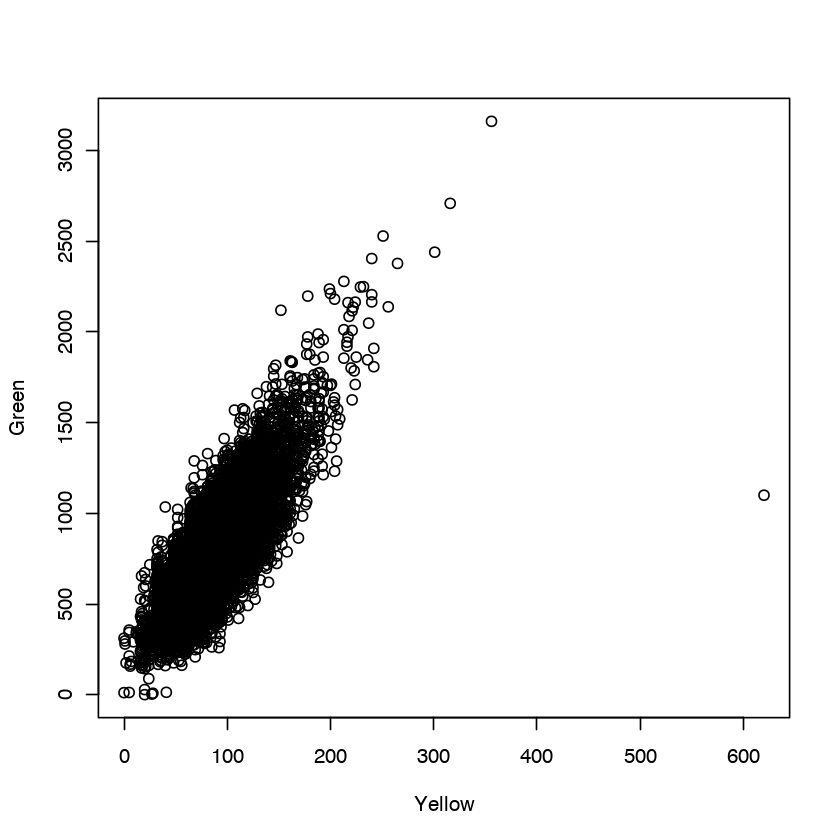

In [248]:
plot(Yellow, Green)

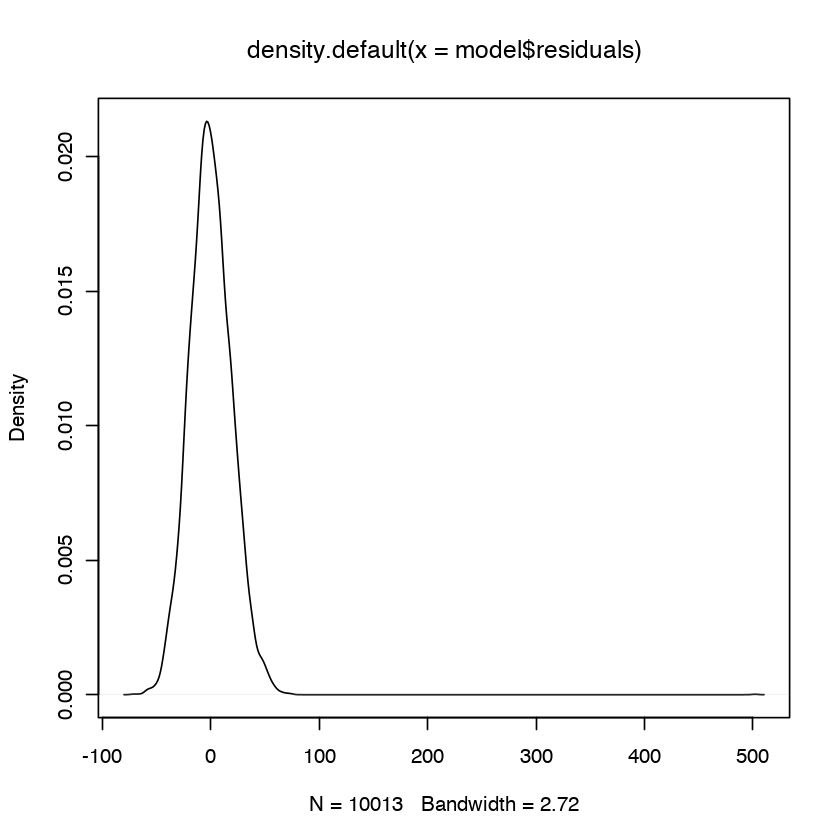

In [240]:
plot(density(model$residuals))
                   

In [228]:
library("MASS")

In [235]:
data=cbind(Yellow_avg_per_file, Green_avg_per_file, Cor.coeff, Tm$k_initial)
colnames(data)=c("Yellow", "Green", "R", "Yield")
data=as.data.frame(data)

model <- lm(R ~ . + Green, data = data)
summary(model)


Call:
lm(formula = R ~ . + Green, data = data)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.08674 -0.04929 -0.02210  0.05468  0.13809 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)   
(Intercept)  4.860e-01  1.005e-01   4.836  0.00289 **
Yellow      -7.398e-05  1.558e-04  -0.475  0.65177   
Green       -7.395e-05  1.007e-04  -0.734  0.49062   
Yield        2.790e-02  8.046e-03   3.467  0.01335 * 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.09143 on 6 degrees of freedom
Multiple R-squared:  0.6815,	Adjusted R-squared:  0.5222 
F-statistic: 4.279 on 3 and 6 DF,  p-value: 0.06161


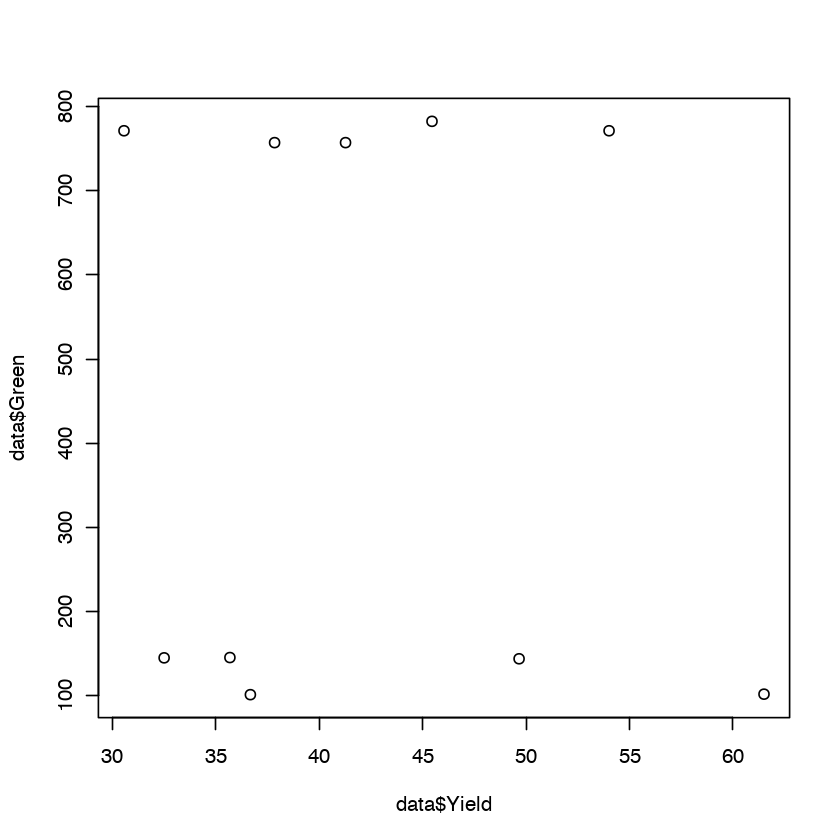

In [231]:
plot(data$Yield, data$Green)


	Spearman's rank correlation rho

data:  Tm$Refolding_yield and Cor.coeff
S = 54, p-value = 0.03938
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.6727273 


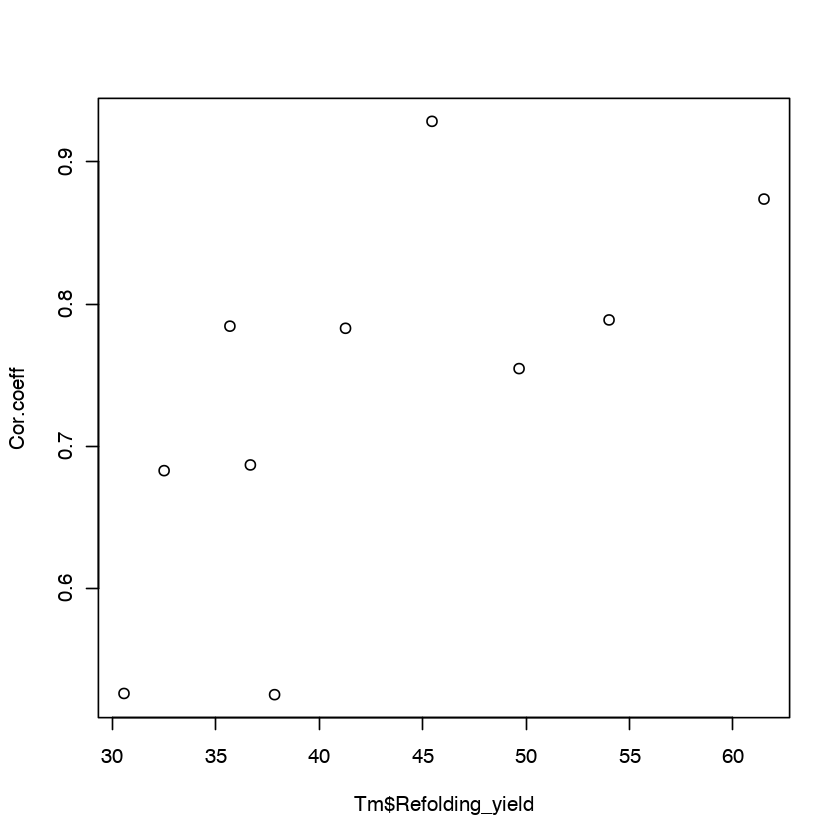

In [205]:
plot(Tm$Refolding_yield, Cor.coeff)
cor.test(Tm$Refolding_yield, Cor.coeff, method = "spearman")

### Test of R variation

In [5]:
#library("lmtest")
#library("car")

ERROR: Error in library("car"): there is no package called ‘car’


In [6]:
Folders=list.dirs("~/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2/")

In [5]:
Cor.coeff=matrix(NA, nrow = length(Folders), ncol=2)
p_val_hetero=matrix(NA, nrow = length(Folders), ncol = 2)

for (i in 2:length(Folders)){

setwd(Folders[i])

FACS_files=list.files(pattern = ".fcs")

R=pval=rep(NA, length(FACS_files))

message("####################")
message("---- Protein=", str_split(Folders[i], pattern = "//", simplify = TRUE)[,2], " ----")
message("####################")

for (j in 1:length(FACS_files)){


    FACS_temp=read.FCS(FACS_files[j])
    index_Y=which(colnames(FACS_temp@exprs)=="FITC-H")
    index_G=which(colnames(FACS_temp@exprs)=="AmCyan-H")
    
    #### Yellow and Green components
    Yellow=FACS_temp@exprs[,index_Y]
    Green=FACS_temp@exprs[,index_G]
     
        
    
    #### Correlation ###    
    COR=cor.test(FACS_temp@exprs[,index_Y], FACS_temp@exprs[,index_G], method="spearman")
    R[j]=COR$estimate
    pval[j]=COR$p.value 
     
    message(R[j])
    
    plot(Yellow, Green, pch=19, main=str_split(Folders[i], pattern = "//", simplify = TRUE)[,2])
}


#rownames(p_val_hetero)[i]=str_split(Folders[i], pattern = "//", simplify = TRUE)[,2]
Cor.coeff[i,1]=mean(R, na.rm = TRUE)
Cor.coeff[i,2]=sd(R, na.rm = TRUE)

#Cor.pval[i]=mean(pval, na.rm = TRUE)

setwd("~/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/")
}

#names(Cor.coeff)=str_split(Folders[2:length(Folders)], pattern = "//", simplify = TRUE)[,2]
#names(Cor.coeff_sd)=str_split(Folders[2:length(Folders)], pattern = "//", simplify = TRUE)[,2]

rownames(Cor.coeff)=str_split(Folders[2:length(Folders)], pattern = "//", simplify = TRUE)[,2]

ERROR: Error in setwd(Folders[i]): missing value is invalid


In [97]:
rownames(Cor.coeff)[2:dim(Cor.coeff)[1]]=str_split(Folders[2:length(Folders)], pattern = "//", simplify = TRUE)[,2]

In [98]:
Cor.coeff

NA,NA,NA
5G,0.9475889,0.0025547666
E18G,0.2297575,0.0388784593
E7K,0.5050234,0.0223228814
G_F47L,0.9290458,0.0033626345
G_F65L,0.9555035,0.0023507171
G_F65S,0.8858282,0.0094528169
G_F72C,0.9425149,0.0072796529
G_F72I,0.9304829,0.0039955599
G_I129T,0.9575835,0.0048944166
G_I168V,0.9556023,0.0037196020


In [99]:
write.csv(Cor.coeff, "Cor_coeff.csv")


[1] 72

[1] 72

pdf 
  2

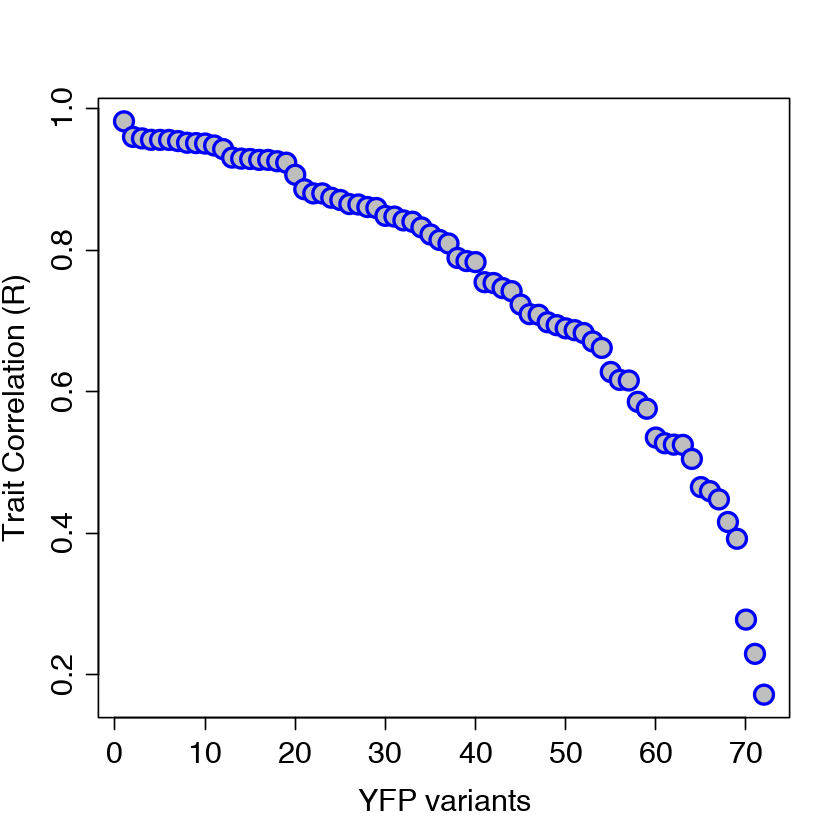

In [339]:
#pdf("Trait_correlation_variants.pdf")
plot(sort(Cor.coeff, decreasing = TRUE), pch = 21, cex=2, col="blue", bg="GRAY", lwd=2, xlab="YFP variants", ylab="Trait Correlation (R)", cex.axis=1.5, cex.lab=1.5)
#dev.off()




X=seq(1,length(sort(Cor.coeff, decreasing = TRUE)))
Y=sort(Cor.coeff, decreasing = TRUE)
length(X)
length(Y)
Y_sd=Cor.coeff_sd[match(names(Cor.coeff_sd), names(sort(Cor.coeff, decreasing = TRUE)))]

pdf("Trait_correlation_variants.pdf")
par(mfrow = c(1,2))
plot(X,Y, pch = 21, cex=1.3, col="blue", bg="GRAY", lwd=2, xlab="YFP variants", ylab="Trait Correlation (R)", cex.axis=1.5, cex.lab=1.5)
arrows(X, Y - Y_sd, X, Y + Y_sd, code=3, col="blue", lwd=2, angle = 90, length = 0.1)
lines(X,Y, type="p", pch = 21, cex=1.3, col="blue", bg="GRAY", lwd=2, xlab="YFP variants", ylab="Trait Correlation (R)", cex.axis=1.5, cex.lab=1.5)
dev.off()
#sort(Cor.coeff, decreasing = TRUE)
#sort(Cor.pval, decreasing = FALSE)

In [294]:
Folders

[1] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2/"        
 [2] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//E18G"   
 [3] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//E7K"    
 [4] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_F47L" 
 [5] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_F65L" 
 [6] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_F65S" 
 [7] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_F72C" 
 [8] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_F72I" 
 [9] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_I129T"
[10] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_I168V"
[11] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_I172V"
[12] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_K102R"
[13] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_K141R"
[14] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_N145S"
[15] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_V164A"
[16] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_V2A"  
[17] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_V2M"  
[18] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G233D"  
[19] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G5S"    
[20] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G66S"   
[21] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//K102E"  
[22] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//K157E"  
[23] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//M79L"   
[24] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//R110S"  
[25] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//T"      
[26] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//T_E18G" 
[27] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//T_E7K"  
[28] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//T_F65L

In [5]:
FACS_files=list.files("~/Desktop/FACS_files_JIA/All_mutants/", pattern = ".fcs")

In [6]:
FACS_files

character(0)

In [3]:
Trait_matrix=matrix(NA, nrow = length(FACS_files), ncol = 3)
Trait_matrix_sd=matrix(NA, nrow = length(FACS_files), ncol = 4)

#pdf("Isogenic_populations_trait_correlation.pdf")
for (i in 1:length(FACS_files)){
    
    
    file_path=paste("~/Desktop/FACS_files_JIA/All_mutants/", FACS_files[i], sep="")
    FACS_temp=read.FCS(file_path)
    index_Y=which(colnames(FACS_temp@exprs)=="FITC-H")
    index_G=which(colnames(FACS_temp@exprs)=="AmCyan-H")
    
    #### Yellow and Green components
    Yellow=FACS_temp@exprs[,index_Y]
    Green=FACS_temp@exprs[,index_G]
     
    

    
    #### Correlation ###    
    COR=cor.test(FACS_temp@exprs[,index_Y], FACS_temp@exprs[,index_G], method="spearman")
    
    label=paste("mutant= ", FACS_files[i],"| R(corr. coef)=", as.character(round(COR$estimate,2)))
    plot(FACS_temp@exprs[,index_Y], FACS_temp@exprs[,index_G], main=label, pch = 21, cex=2, col="blue", bg="GRAY", lwd=2, xlab="Yellow Fluorescence", ylab="Green Fluorescence", cex.axis=1.5, cex.lab=1.5)   
    
    
    Trait_matrix[i,1]= mean(FACS_temp@exprs[,index_Y], na.rm = TRUE)
    Trait_matrix[i,2]= mean(FACS_temp@exprs[,index_G], na.rm = TRUE)
    Trait_matrix[i,3]= COR$estimate
    
    ###
    Trait_matrix_sd[i,1]=mean(FACS_temp@exprs[,index_Y], na.rm = TRUE)
    Trait_matrix_sd[i,2]=sd(FACS_temp@exprs[,index_Y], na.rm = TRUE)
    Trait_matrix_sd[i,3]=mean(FACS_temp@exprs[,index_G], na.rm = TRUE)
    Trait_matrix_sd[i,4]=sd(FACS_temp@exprs[,index_G], na.rm = TRUE)

}

#dev.off()

ERROR: Error in read.FCS(file_path): '~/Desktop/FACS_files_JIA/All_mutants/NA' is not a valid file


In [46]:
par(mfrow = c(1,2), pty="s")
plot(Trait_matrix$Avg_Green, Trait_matrix$R, log="x")
plot(Trait_matrix$Avg_Yellow, Trait_matrix$R, log="x")

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'plot': $ operator is invalid for atomic vectors


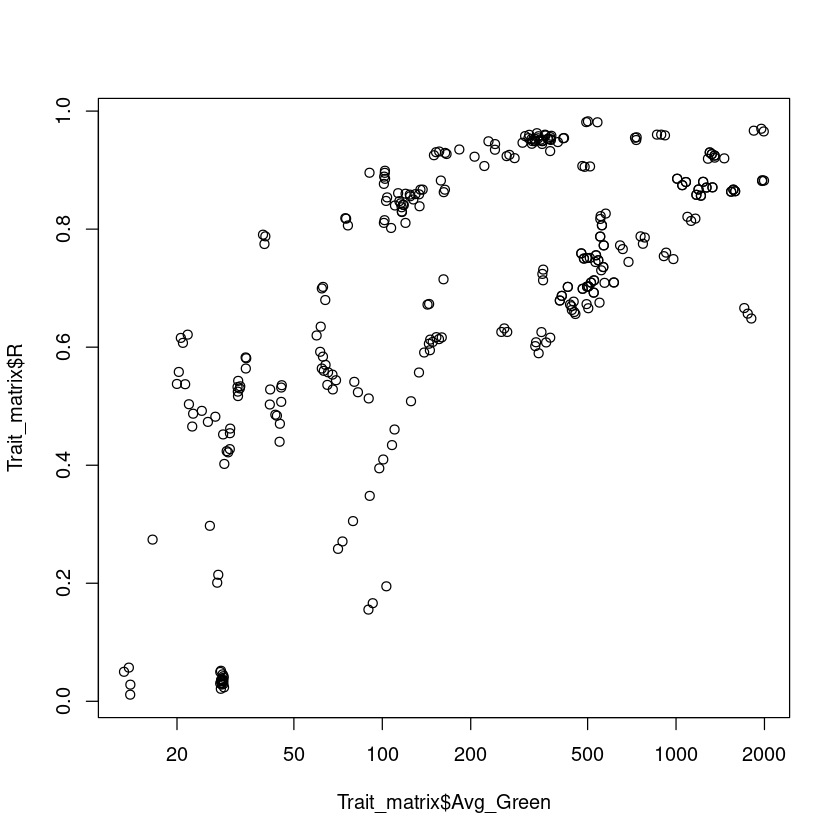

In [17]:
plot(Trait_matrix$Avg_Green, Trait_matrix$R, log="x")

FACS_files

# Systematic Investigation

#### The case of negative control

In [11]:
Negative_control=read.FCS("~/Desktop/FACS_files_JIA/Mutants_categorized_folders/Neg/Neg1_H7_H07_039.fcs")

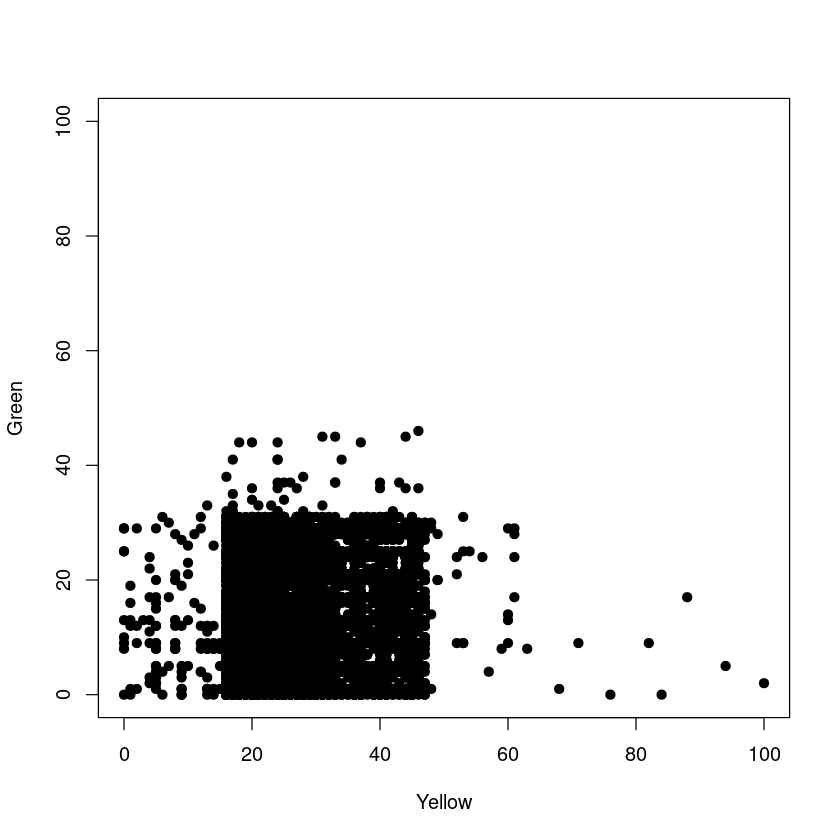

In [12]:
index_Y=which(colnames(Negative_control@exprs)=="FITC-H")
index_G=which(colnames(Negative_control@exprs)=="AmCyan-H")
    
#### Yellow and Green components
Yellow=Negative_control@exprs[,index_Y]
Green=Negative_control@exprs[,index_G]

plot(Yellow, Green, xlim=c(0,100), ylim=c(0,100), pch=19)

#### The case of WT

In [26]:
WT=read.FCS("~/Desktop/FACS_files_JIA/Mutants_categorized_folders/WT/WT (1).fcs")

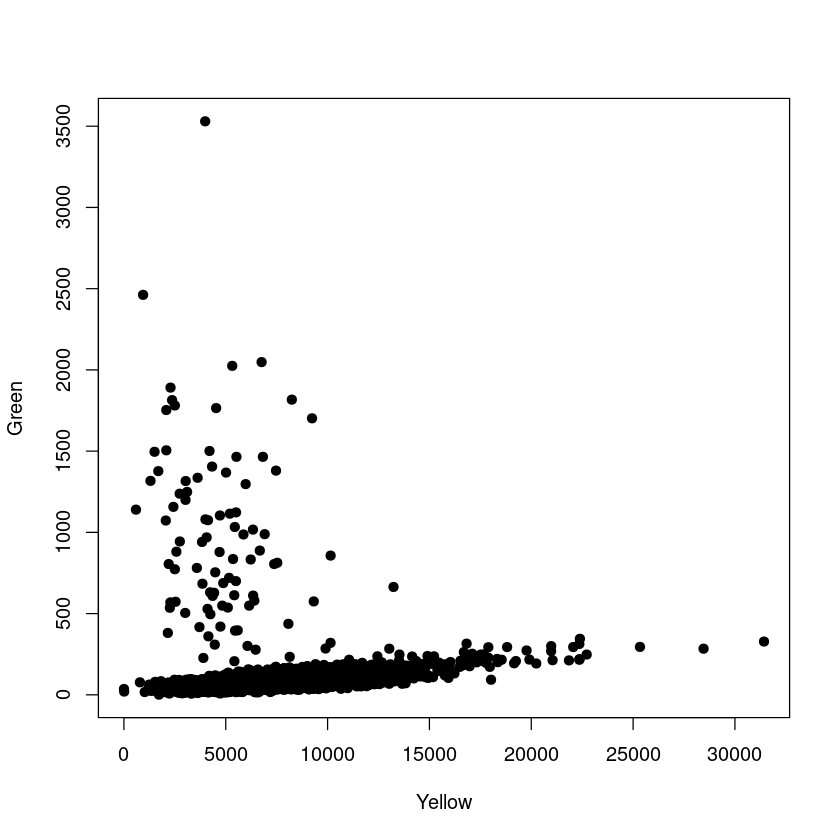

In [28]:
index_Y=which(colnames(WT@exprs)=="FITC-H")
index_G=which(colnames(WT@exprs)=="AmCyan-H")
    
#### Yellow and Green components
Yellow=WT@exprs[,index_Y]
Green=WT@exprs[,index_G]

plot(Yellow, Green, pch=19)

In [25]:
folders=str_split(list.dirs("~/Desktop/FACS_files_JIA/Mutants_categorized_folders/"),"/", simplify = TRUE)[,8]
folders=folders[-1]

### Clustring of mutants behavior

In [10]:
Negative_control=read.FCS("./Mutants_categorized_folders/Neg/NEG (1).fcs")

In [11]:
index_Y=which(colnames(Negative_control@exprs)=="FITC-H")
index_G=which(colnames(Negative_control@exprs)=="AmCyan-H")
    
#### Yellow and Green components
Yellow_N=Negative_control@exprs[,index_Y]
Green_N=Negative_control@exprs[,index_G]

#plot(Yellow, Green, xlim=c(0,100), ylim=c(0,100), pch=19)


Y_N_quantile=quantile(Yellow_N, 0.1*seq(1,10))
G_N_quantile=quantile(Green_N, 0.1*seq(1,10))

In [12]:
Folders=list.dirs("~/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2/")

In [13]:
Cor.coeff=Cor.coeff_sd=Cor.pval=rep(NA, length(Folders))

p_val_hetero=matrix(NA, nrow = length(Folders), ncol = 2)


Quantile_MAT=matrix(NA, nrow = length(Folders), ncol =20)


Quantile_MAT[1,1:10]= rep(1,10)
Quantile_MAT[1,11:20]= rep (1,10)

for (i in 2:length(Folders)){

setwd(Folders[i])

FACS_files=list.files(pattern = ".fcs")[1]


message("####################")
message("---- Protein=", str_split(Folders[i], pattern = "//", simplify = TRUE)[,2], " ----")
message("####################")



    FACS_temp=read.FCS(FACS_files)
    index_Y=which(colnames(FACS_temp@exprs)=="FITC-H")
    index_G=which(colnames(FACS_temp@exprs)=="AmCyan-H")
    
    #### Yellow and Green components
    Yellow=FACS_temp@exprs[,index_Y]
    Green=FACS_temp@exprs[,index_G]
     
    Y_N_quantile_mut=quantile(Yellow, 0.1*seq(1,10))
    G_N_quantile_mut=quantile(Green, 0.1*seq(1,10))   


    
    Quantile_MAT[i,1:10]=Y_N_quantile_mut/Y_N_quantile    
    Quantile_MAT[i,11:20]=G_N_quantile_mut/G_N_quantile 
    
    
setwd("~/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/")
}



####################

---- Protein=5G ----

####################

####################

---- Protein=E18G ----

####################

####################

---- Protein=E7K ----

####################

####################

---- Protein=G_F47L ----

####################

####################

---- Protein=G_F65L ----

####################

####################

---- Protein=G_F65S ----

####################

####################

---- Protein=G_F72C ----

####################

####################

---- Protein=G_F72I ----

####################

####################

---- Protein=G_I129T ----

####################

####################

---- Protein=G_I168V ----

####################

####################

---- Protein=G_I172V ----

####################

####################

---- Protein=G_K102R ----

####################

####################

---- Protein=G_K141R ----

####################

####################

---- Protein=G_N145S ----

####################

####################

-

In [25]:
rownames(Quantile_MAT)=c("NEG", str_split(Folders[2:length(Folders)], pattern = "//", simplify = TRUE)[,2])
colnames(Quantile_MAT)=c(paste("Y_", seq(1:10), sep=""),paste("G_", seq(1:10), sep=""))

In [26]:
Quantile_MAT

,Y_1,Y_2,Y_3,Y_4,Y_5,Y_6,Y_7,Y_8,Y_9,Y_10,G_1,G_2,G_3,G_4,G_5,G_6,G_7,G_8,G_9,G_10
NEG,1.0000000,1.000000,1.000000,1.000,1.0000000,1.0000000,1.0000000,1.000,1.0000000,1.0000000,1.0000000,1.00,1.000000,1.000000,1.0000000,1.0000000,1.00000,1.000000,1.000000,1.000000
5G,77.0666667,78.222222,76.428571,71.840,70.4642857,69.8838710,66.0277778,66.355,68.7111111,35.4574132,10.5882353,11.00,11.904762,11.583333,11.2962963,11.5862069,11.53125,11.135135,11.731707,30.295082
E18G,1.5933333,1.833333,1.904762,2.184,15.1428571,18.1096774,19.9166667,22.725,26.8666667,18.3217666,1.0000000,1.00,1.000000,1.000000,0.9259259,0.9655172,0.93750,0.972973,1.000000,1.262295
E7K,7.2000000,87.822222,88.476190,83.680,83.3214286,83.8387097,80.3333333,82.625,87.7133333,39.8391167,1.2352941,1.40,1.523810,1.541667,1.5185185,1.5517241,1.56250,1.540541,1.682927,3.180328
G_F47L,0.9333333,16.500000,18.857143,19.080,20.1071429,21.1290323,21.4444444,23.225,25.9066667,15.8485804,0.8823529,3.95,4.857143,5.083333,5.2592593,5.5862069,5.84375,6.054054,6.780488,17.622951
G_F65L,102.1333333,105.166667,104.380952,97.960,95.6071429,94.6387097,89.0305556,89.125,90.8377778,37.5457413,13.7058824,14.25,15.380952,15.250000,14.8888889,15.1034483,14.96875,14.351351,14.902439,29.819672
G_F65S,25.9333333,27.166667,26.761905,25.120,24.7500000,24.6709677,23.4722222,23.600,24.3777778,7.7223975,3.4117647,3.55,3.904762,3.750000,3.6296296,3.6896552,3.62500,3.432432,3.634146,6.196721
G_F72C,61.0666667,62.611111,61.714286,57.640,56.4285714,55.8709677,52.6944444,52.700,53.3444444,68.1829653,8.1764706,8.50,9.095238,8.916667,8.6666667,8.7586207,8.71875,8.297297,8.560976,53.803279
G_F72I,26.4666667,27.466667,27.095238,25.480,25.1428571,25.0322581,23.7777778,24.100,25.1844444,9.0883281,5.4117647,5.55,6.047619,5.916667,5.7407407,5.8620690,5.81250,5.675676,6.000000,9.786885
G_I129T,81.1333333,83.777778,84.380952,79.560,78.1428571,77.1612903,72.8055556,73.200,75.8800000,63.5331230,11.7058824,12.30,13.666667,13.250000,13.1111111,13.3103448,13.28125,12.810811,13.414634,54.983607


In [27]:
library(M3C)

***UMAP wrapper function***

running...

done.



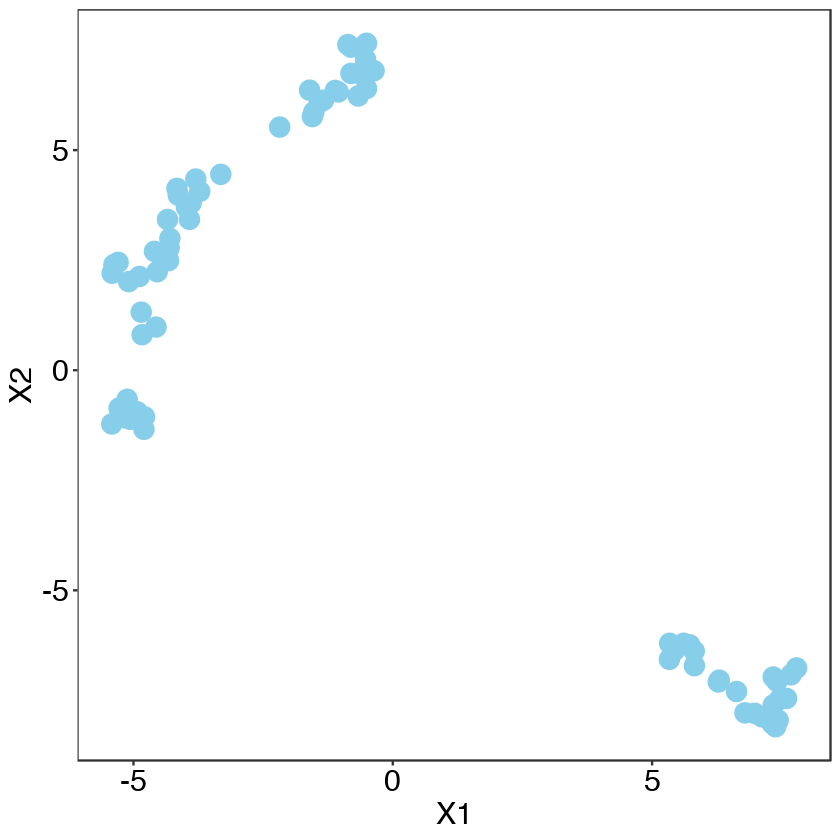

In [68]:
Quantile_MAT_T=t(Quantile_MAT)
U=umap(Quantile_MAT_T,colvec=c('skyblue'))
U

In [86]:
rownames(U$data)

[1] "NEG"     "5G"      "E18G"    "E7K"     "G_F47L"  "G_F65L"  "G_F65S" 
 [8] "G_F72C"  "G_F72I"  "G_I129T" "G_I168V" "G_I172V" "G_K102R" "G_K141R"
[15] "G_N145S" "G_V164A" "G_V2A"   "G_V2M"   "G233D"   "G5S"     "G66S"   
[22] "K102E"   "K157E"   "M79L"    "R110S"   "T"       "T_E18G"  "T_E7K"  
[29] "T_F65L"  "T_F65S"  "T_F72C"  "T_F72I"  "T_G233D" "T_G5S"   "T_I129T"
[36] "T_I168V" "T_I172V" "T_K102E" "T_K102R" "T_K141R" "T_K157E" "T_K167E"
[43] "T_M79L"  "T_N145S" "T_R110S" "T_V164A" "T_V2A"   "T_V2M"   "WT"     
[50] "X_E91A"  "X_F47L"  "X_F72S"  "X_I48V"  "X_K42R"  "X_R74H"  "X_T60S" 
[57] "X_V2A"   "X_V2M"   "Y_F47L"  "Y_F65L"  "Y_F65S"  "Y_F72C"  "Y_F72I" 
[64] "Y_I129T" "Y_I168V" "Y_I172V" "Y_K102R" "Y_K141R" "Y_N145S" "Y_V164A"
[71] "Y_V2A"   "Y_V2M"   "Y204C"

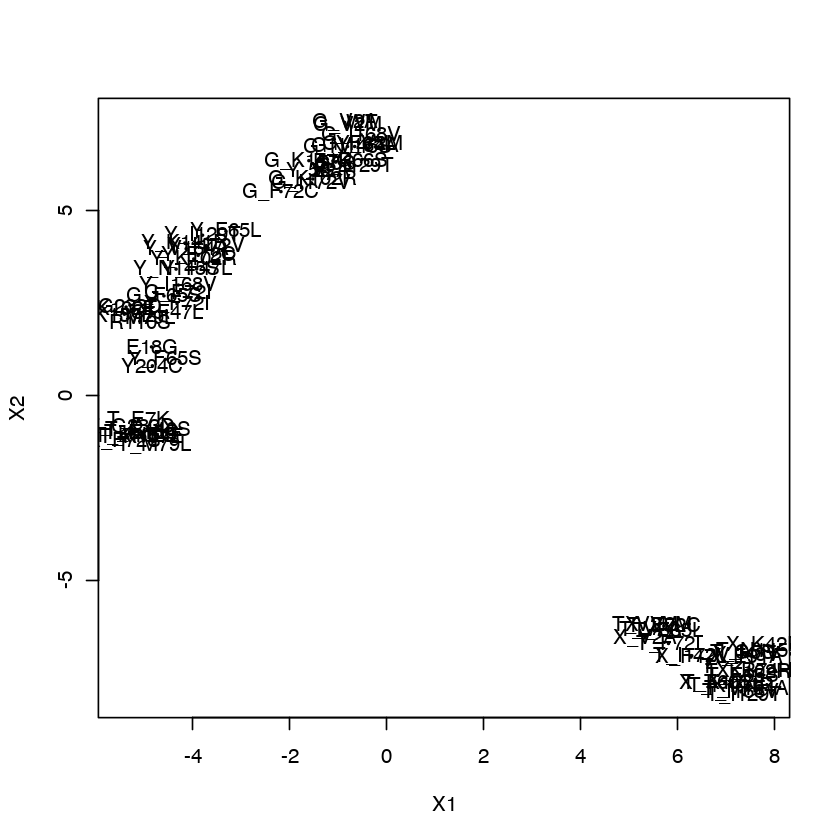

In [98]:
plot(U$data, cex=0.1)
text(U$data[,1], U$data[,2], rownames(U$data))

***UMAP wrapper function***

running...

done.



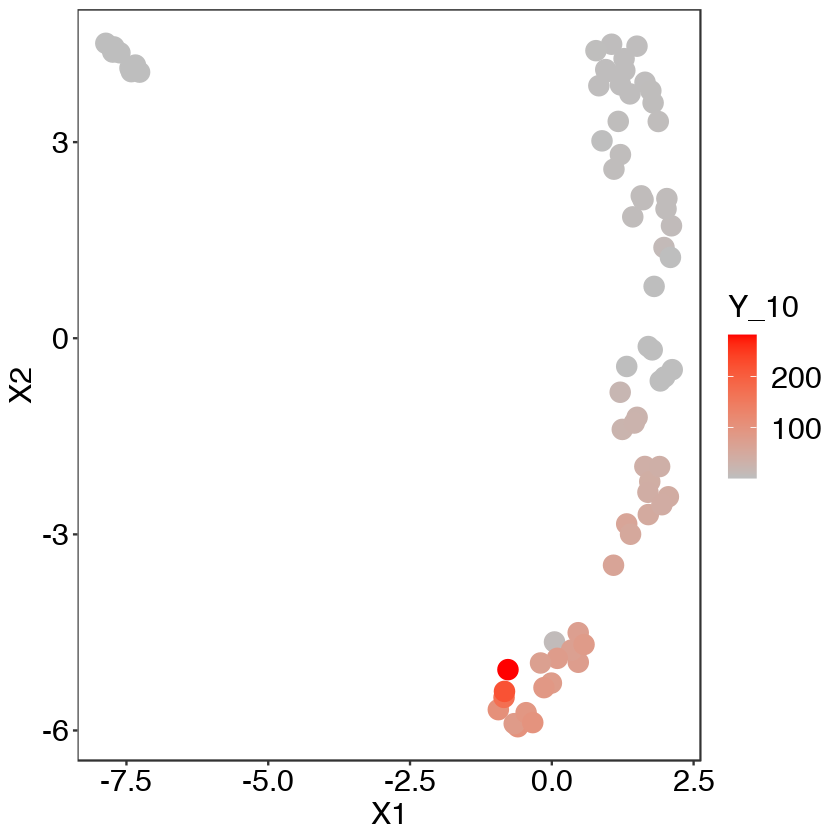

In [63]:
umap(Quantile_MAT_T, labels=as.numeric(Quantile_MAT_T[row.names(Quantile_MAT_T)==c("Y_1"),]),
controlscale = TRUE,scale=2,legendtitle = "Y_10")

In [99]:
library(ggrepel)

Loading required package: ggplot2



In [102]:
U$data

,X1,X2
,<dbl>,<dbl>
NEG,-4.7873411,-1.0587881
5G,-1.3360696,6.1333844
E18G,-4.8510550,1.3193905
E7K,-1.1078354,6.3564340
G_F47L,-4.5422035,2.2384563
G_F65L,-0.5732876,6.8255077
G_F65S,-4.5950244,2.7003236
G_F72C,-2.1806021,5.5236475
G_F72I,-4.3120738,2.7766607


In [108]:
set.seed(42)

dat=U$data

p <- ggplot(dat, aes(X1, X2, label = rownames(U$data))) +
  geom_point(color = "red")


p <- p + geom_text_repel(max.overlaps=Inf) + labs(title = "geom_text_repel()")

pdf("UMAP_quantile.pdf")
p
dev.off()

pdf 
  2

### Fraction of active cells

In [70]:
Negative_control=read.FCS("./Mutants_categorized_folders/Neg/NEG (9).fcs")

In [90]:
index_Y=which(colnames(Negative_control@exprs)=="FITC-H")
index_G=which(colnames(Negative_control@exprs)=="AmCyan-H")
    
#### Yellow and Green components
Yellow_N=Negative_control@exprs[,index_Y]
Green_N=Negative_control@exprs[,index_G]

#plot(Yellow, Green, xlim=c(0,100), ylim=c(0,100), pch=19)


Y_N_max=quantile(Yellow_N,1)
G_N_max=quantile(Green_N,1)

In [91]:
Folders=list.dirs("~/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2/")

In [92]:
Folders
label

[1] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2/"        
 [2] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//5G"     
 [3] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//E18G"   
 [4] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//E7K"    
 [5] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_F47L" 
 [6] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_F65L" 
 [7] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_F65S" 
 [8] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_F72C" 
 [9] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_F72I" 
[10] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_I129T"
[11] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_I168V"
[12] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_I172V"
[13] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_K102R"
[14] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_K141R"
[15] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_N145S"
[16] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_V164A"
[17] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_V2A"  
[18] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G_V2M"  
[19] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G233D"  
[20] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G5S"    
[21] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//G66S"   
[22] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//K102E"  
[23] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//K157E"  
[24] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//M79L"   
[25] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//R110S"  
[26] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//T"      
[27] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//T_E18G" 
[28] "/Users/serohijoslab/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders_2//T_E7K"

[1] "Y204C"

####################

---- Protein=5G ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”
####################

---- Protein=E18G ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”
####################

---- Protein=E7K ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


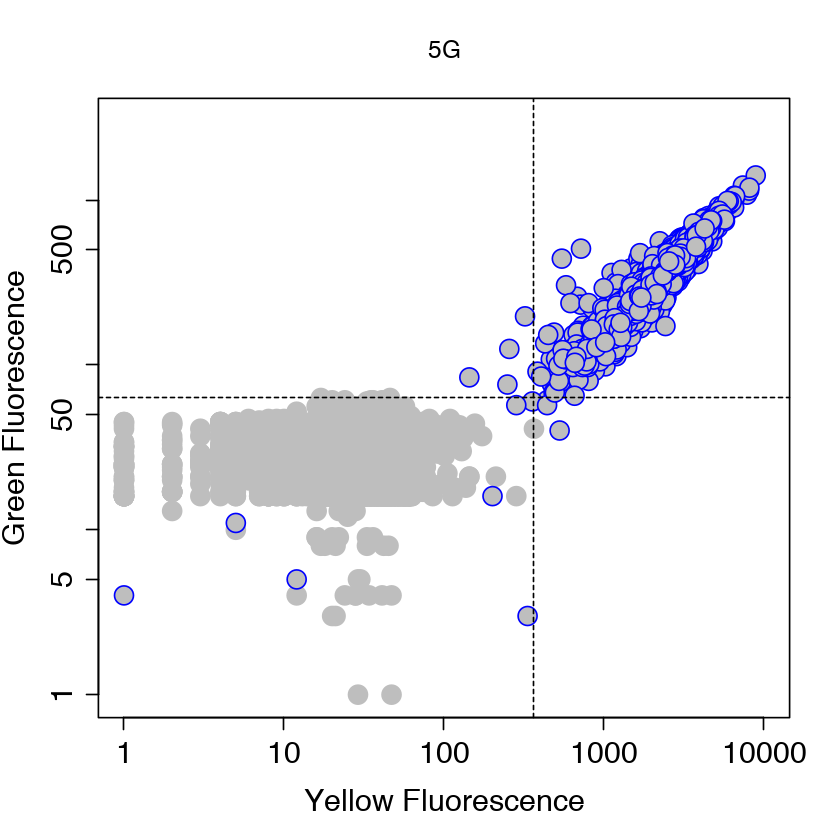

####################

---- Protein=G_F47L ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


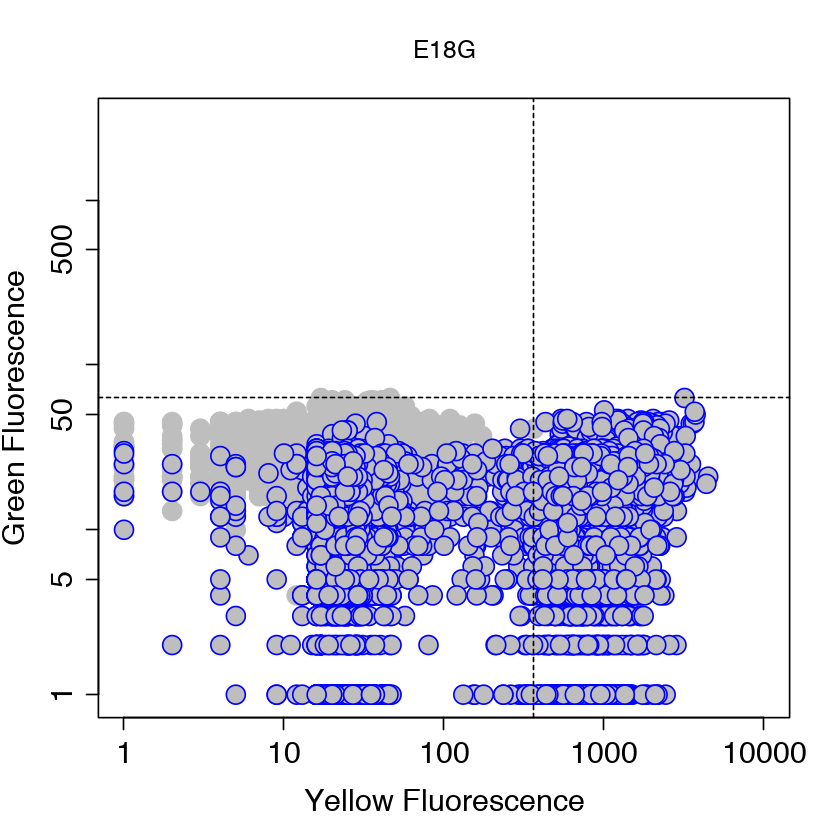

####################

---- Protein=G_F65L ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


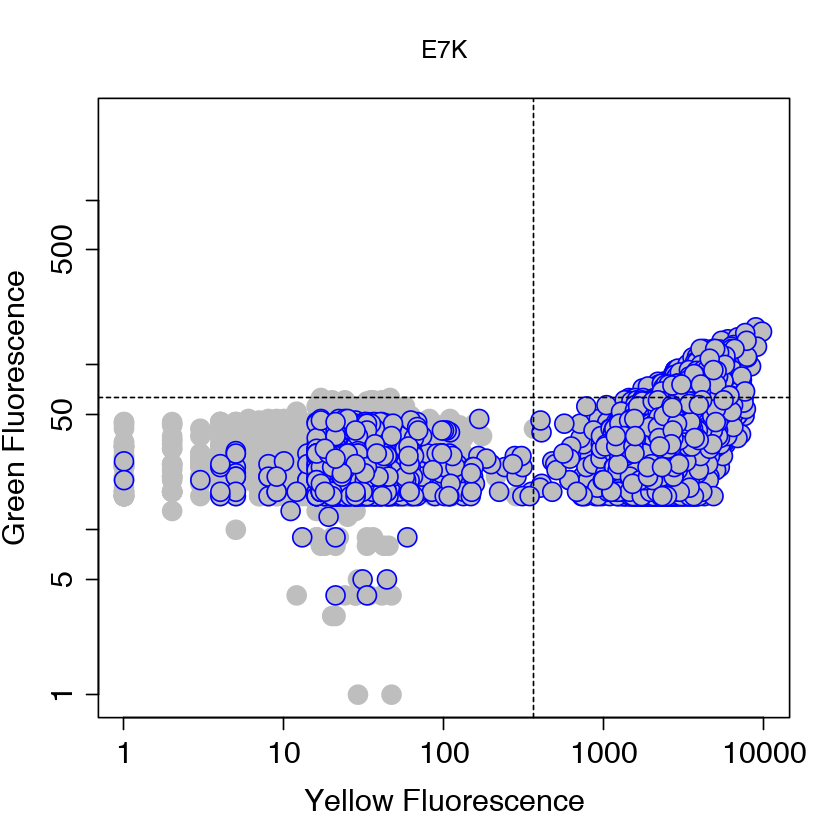

####################

---- Protein=G_F65S ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


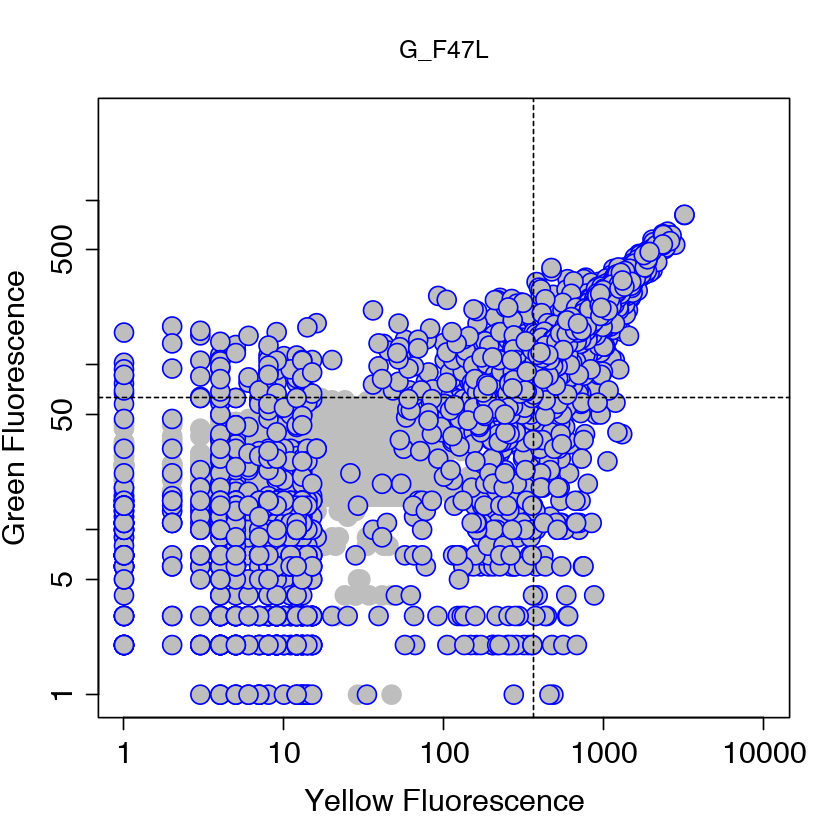

####################

---- Protein=G_F72C ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


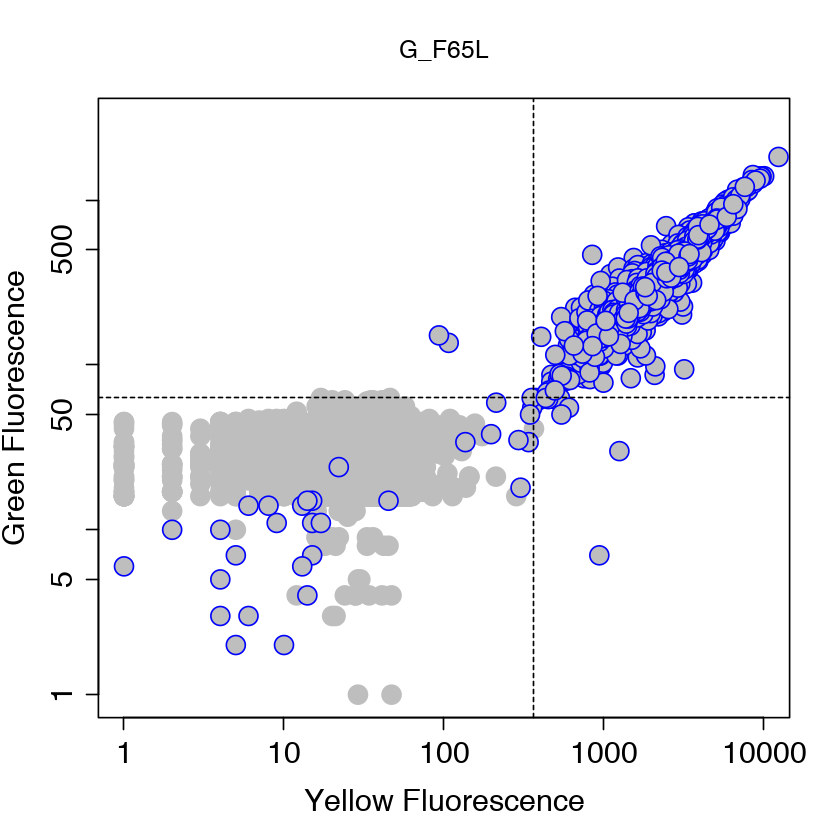

####################

---- Protein=G_F72I ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


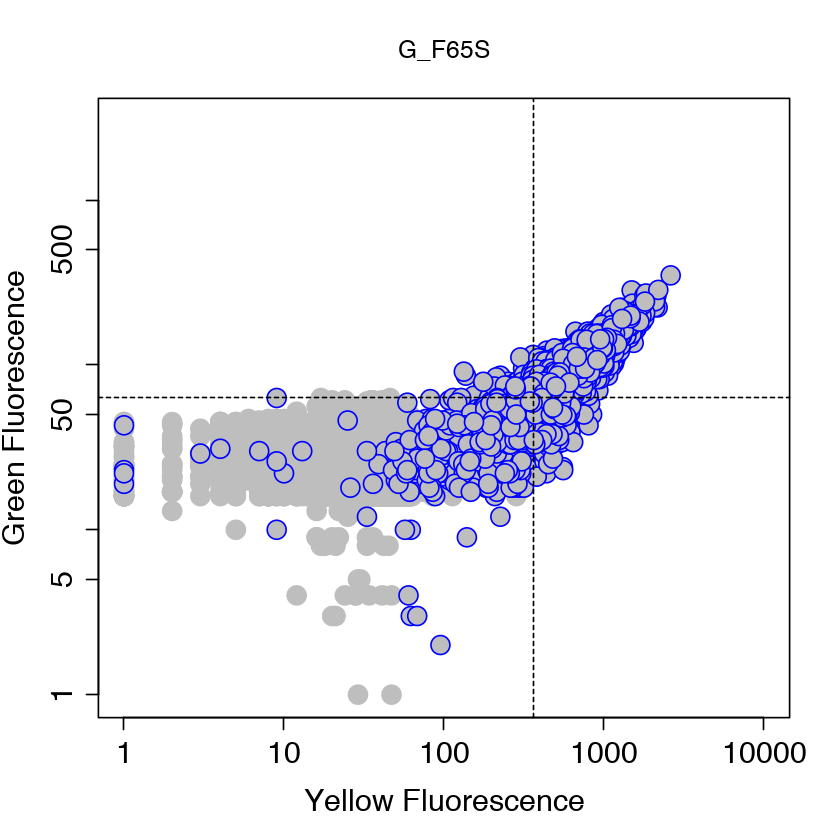

####################

---- Protein=G_I129T ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


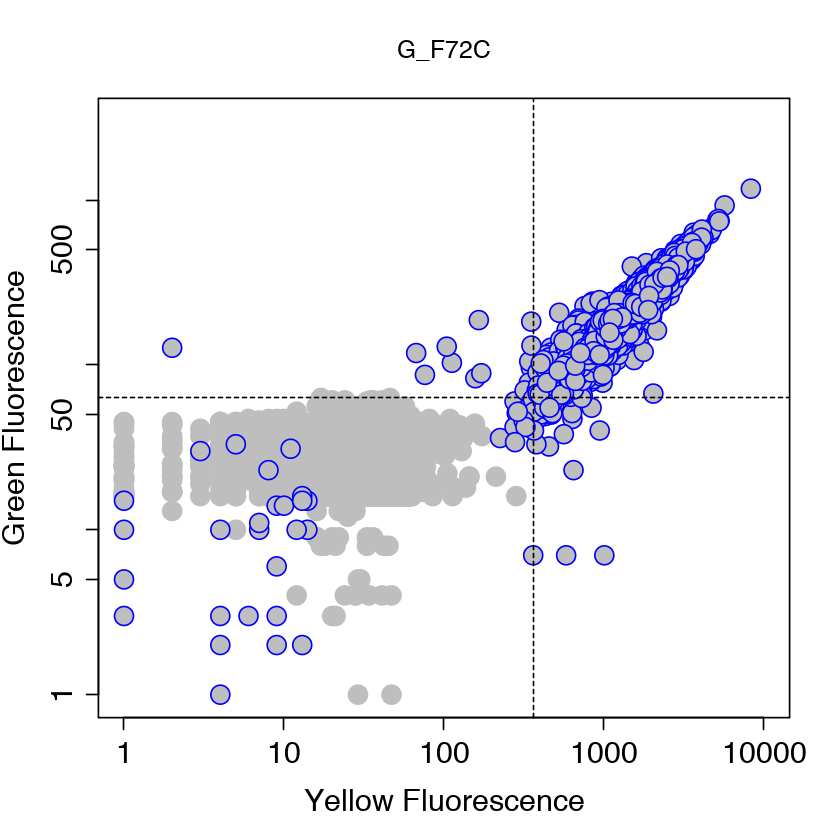

####################

---- Protein=G_I168V ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


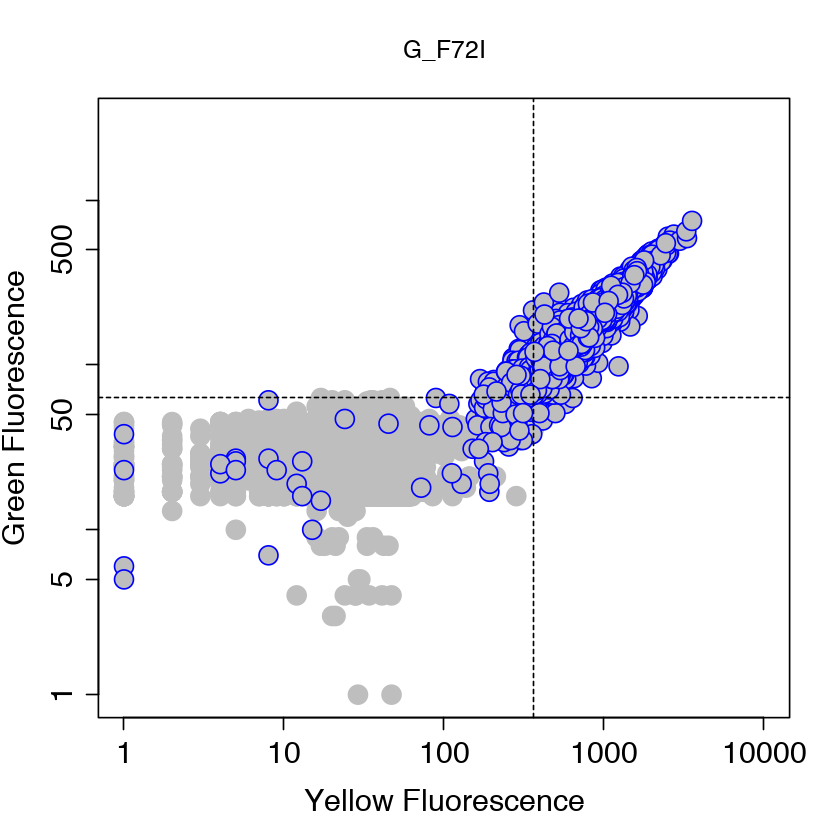

####################

---- Protein=G_I172V ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


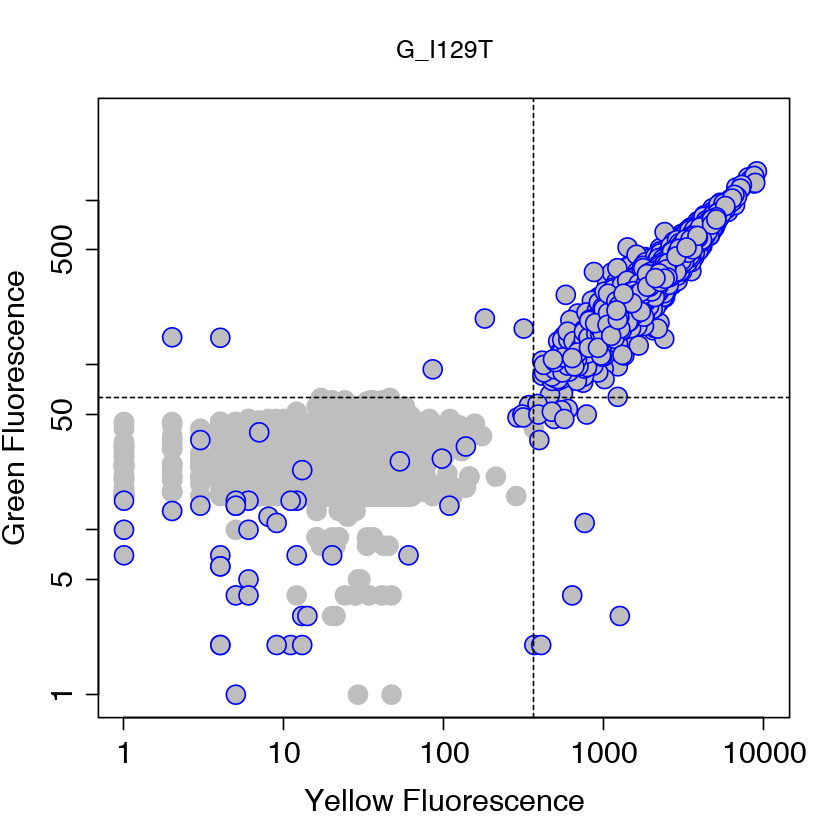

####################

---- Protein=G_K102R ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


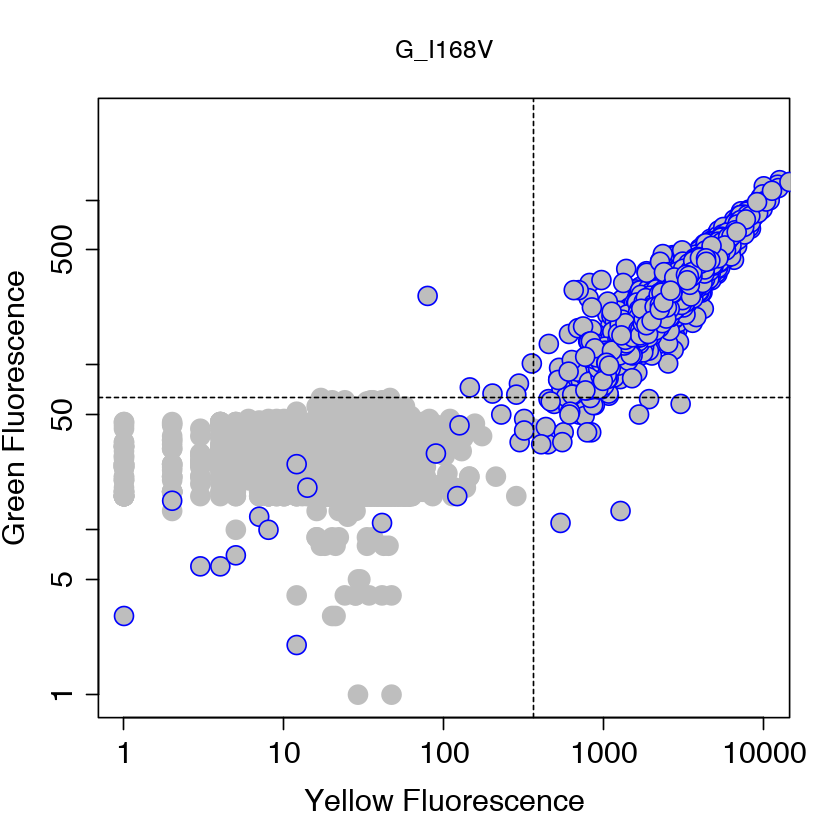

####################

---- Protein=G_K141R ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


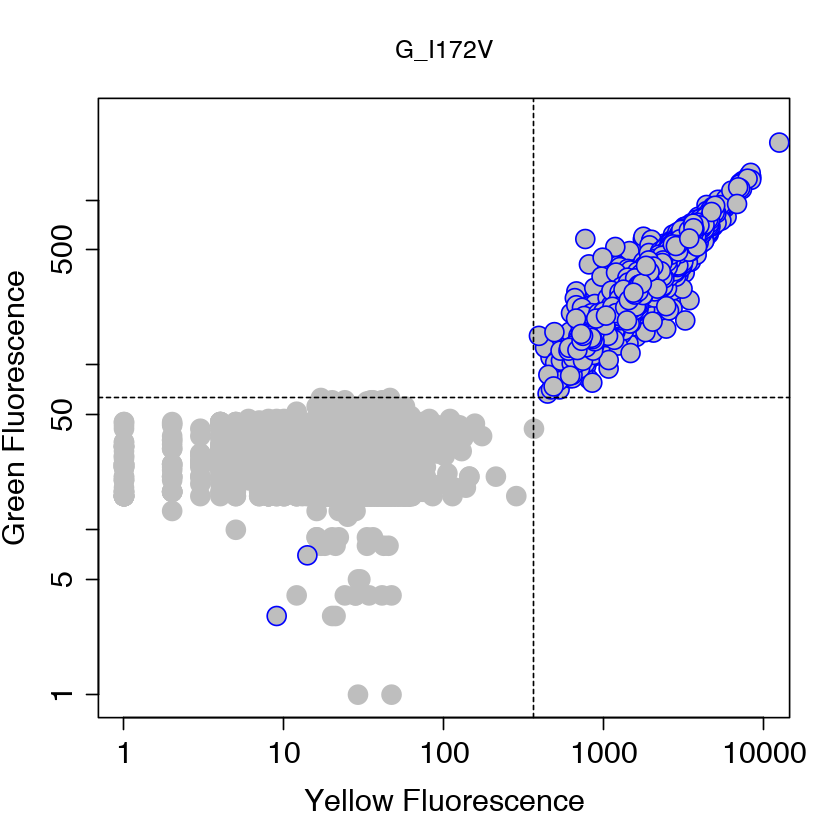

####################

---- Protein=G_N145S ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


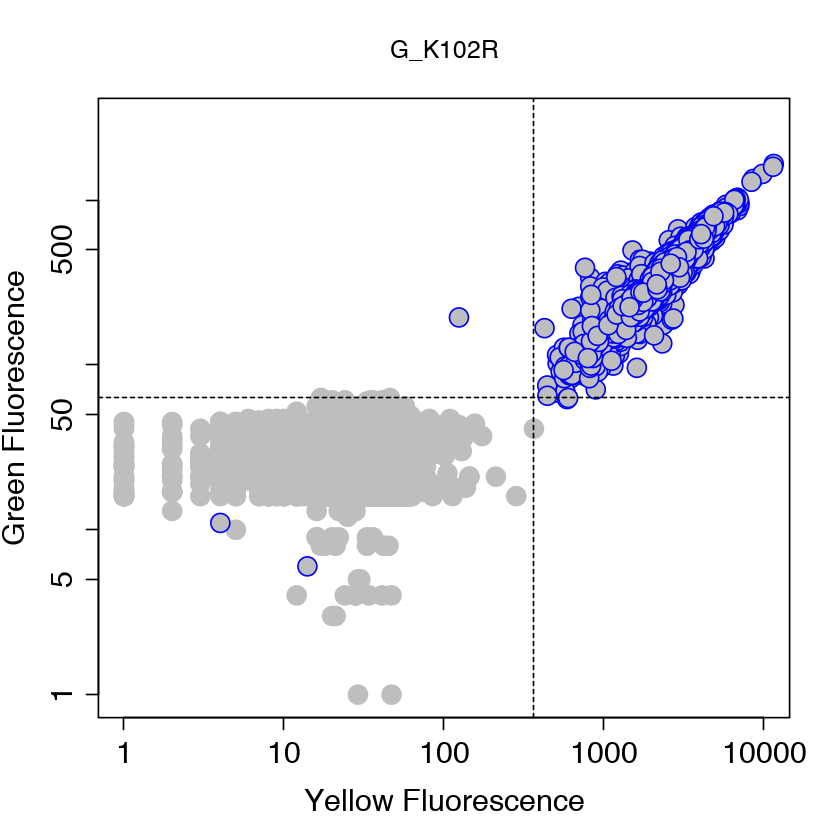

####################

---- Protein=G_V164A ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


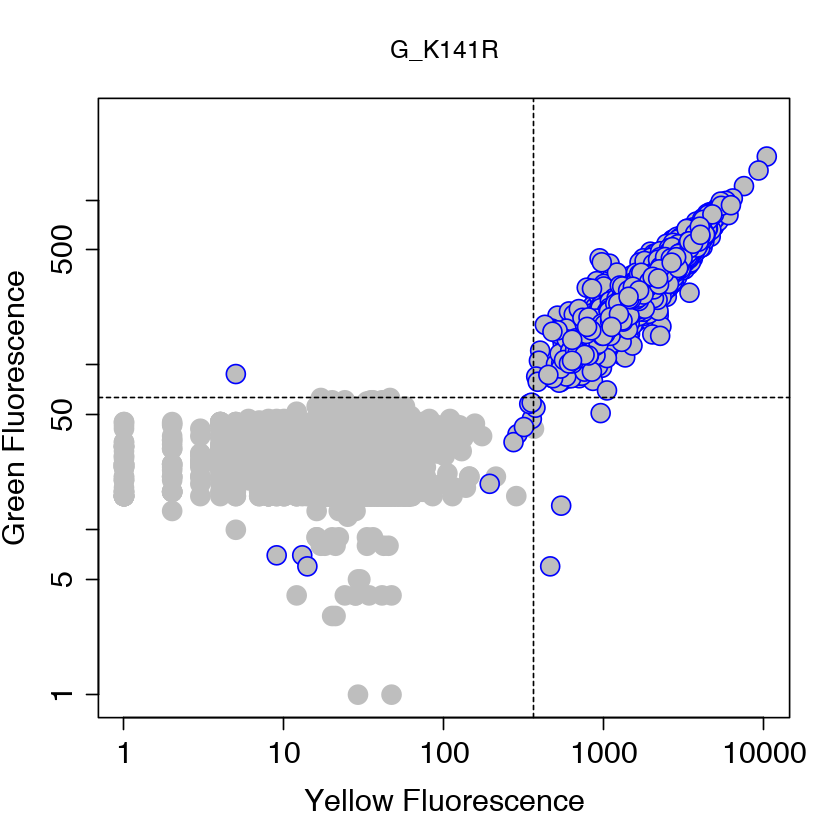

####################

---- Protein=G_V2A ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


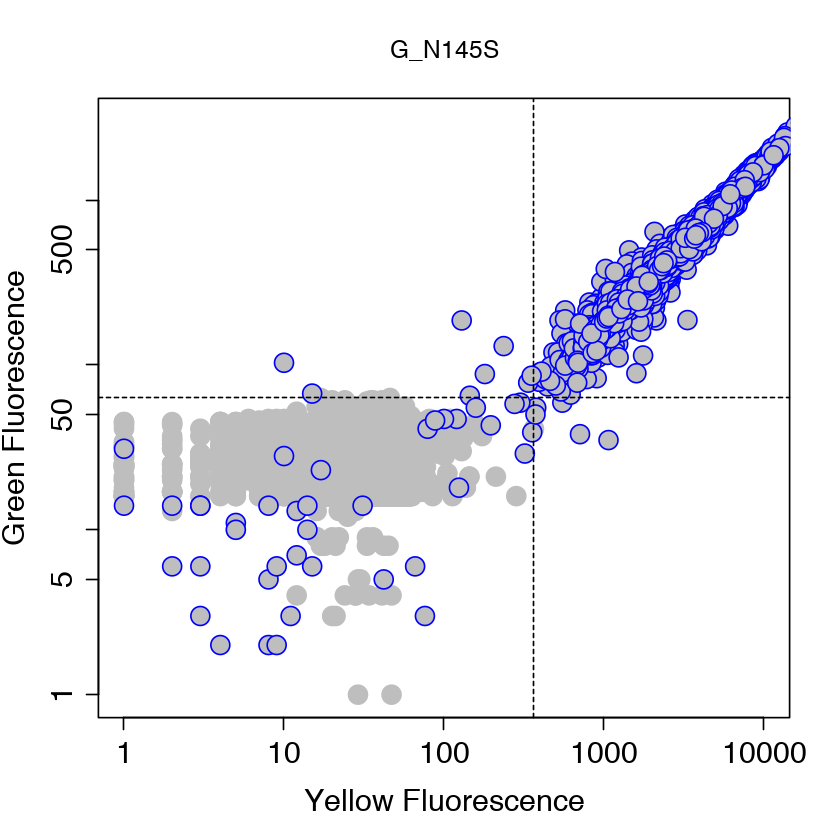

####################

---- Protein=G_V2M ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


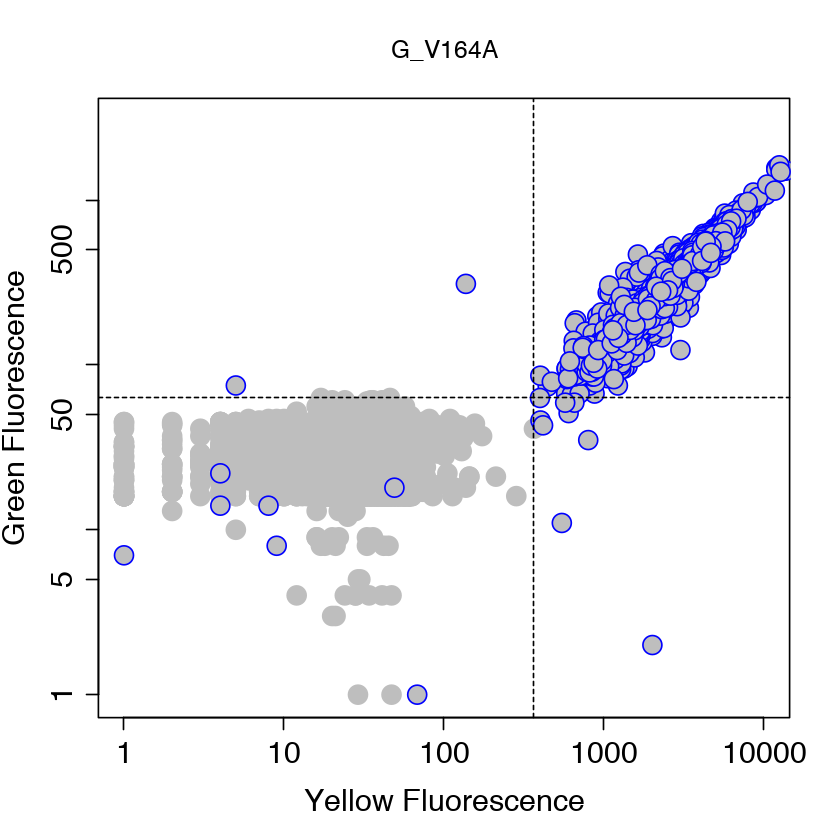

####################

---- Protein=G233D ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


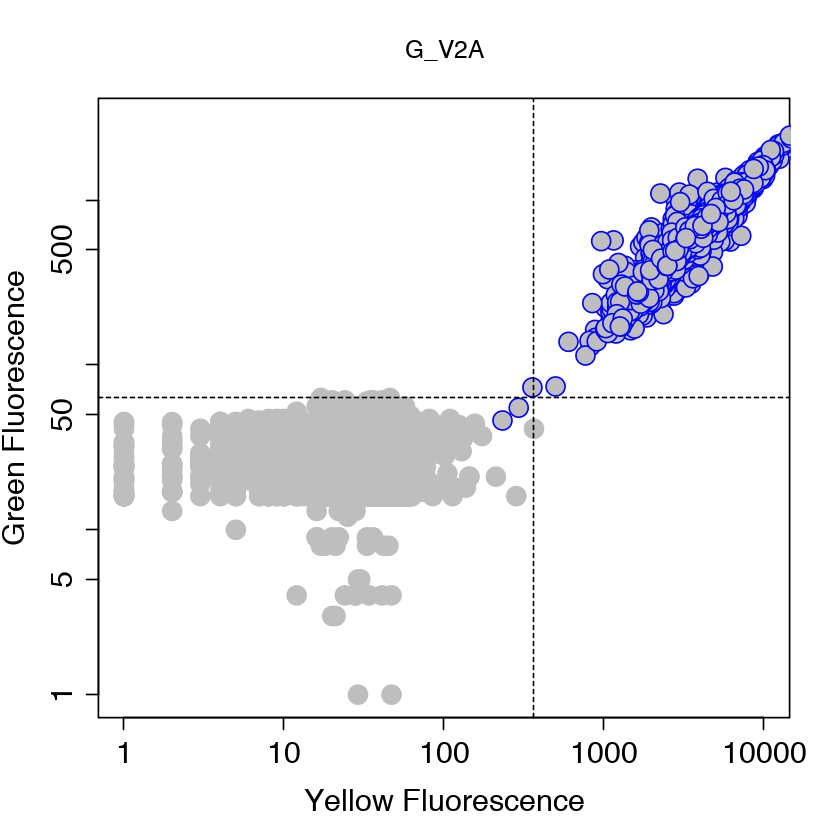

####################

---- Protein=G5S ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


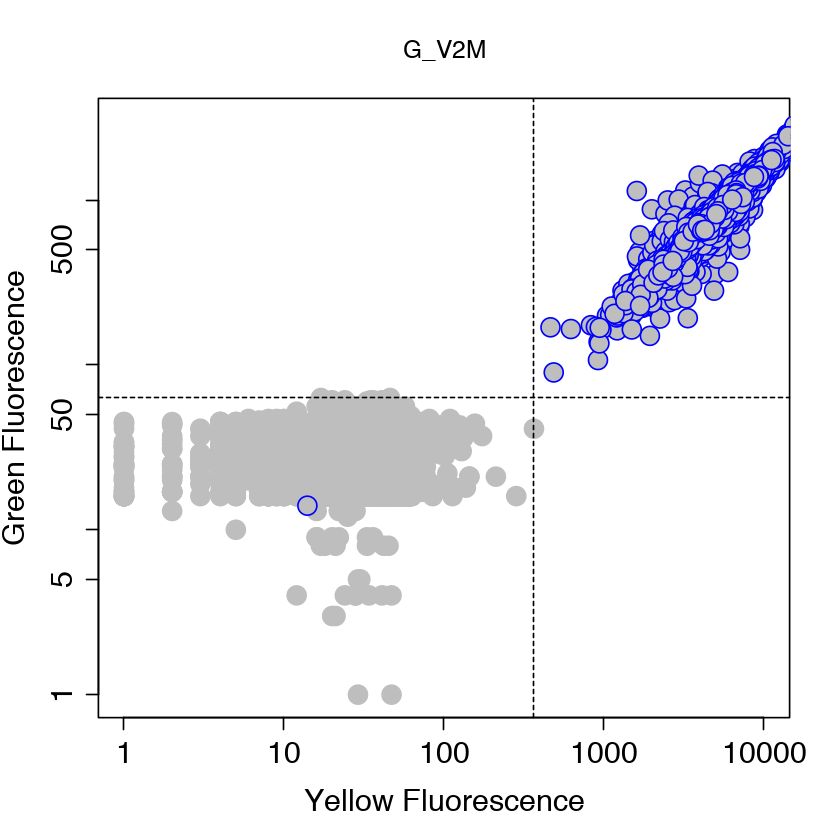

####################

---- Protein=G66S ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


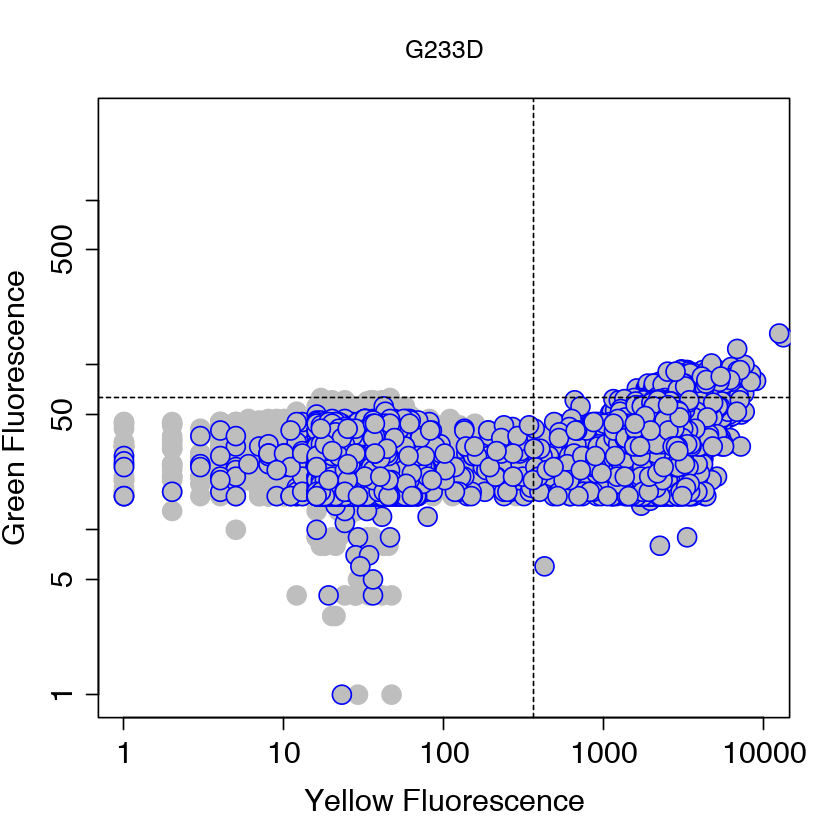

####################

---- Protein=K102E ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


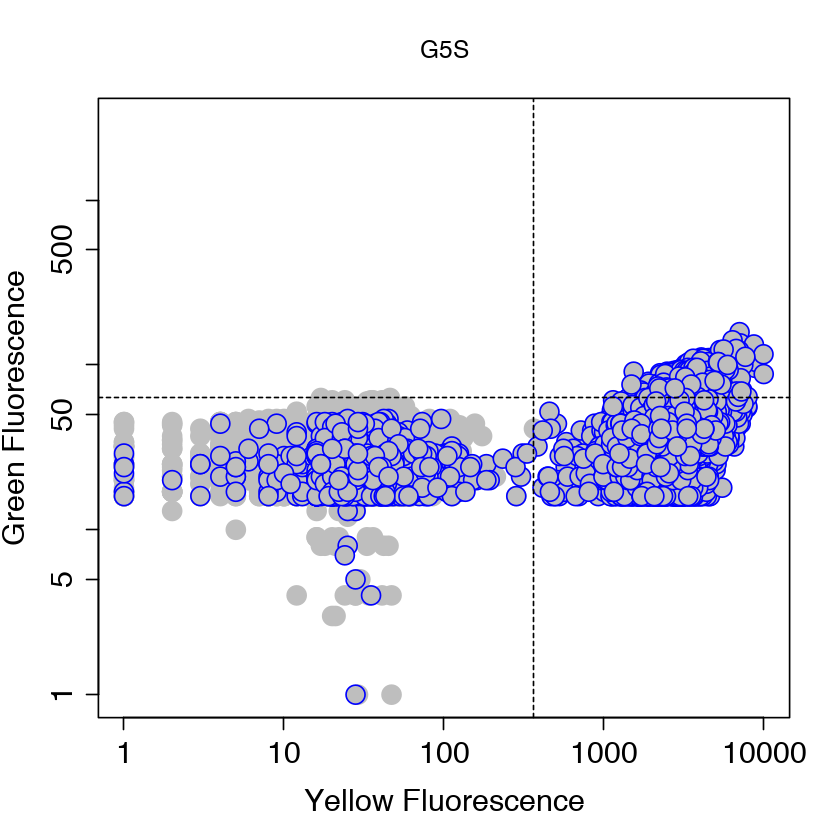

####################

---- Protein=K157E ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


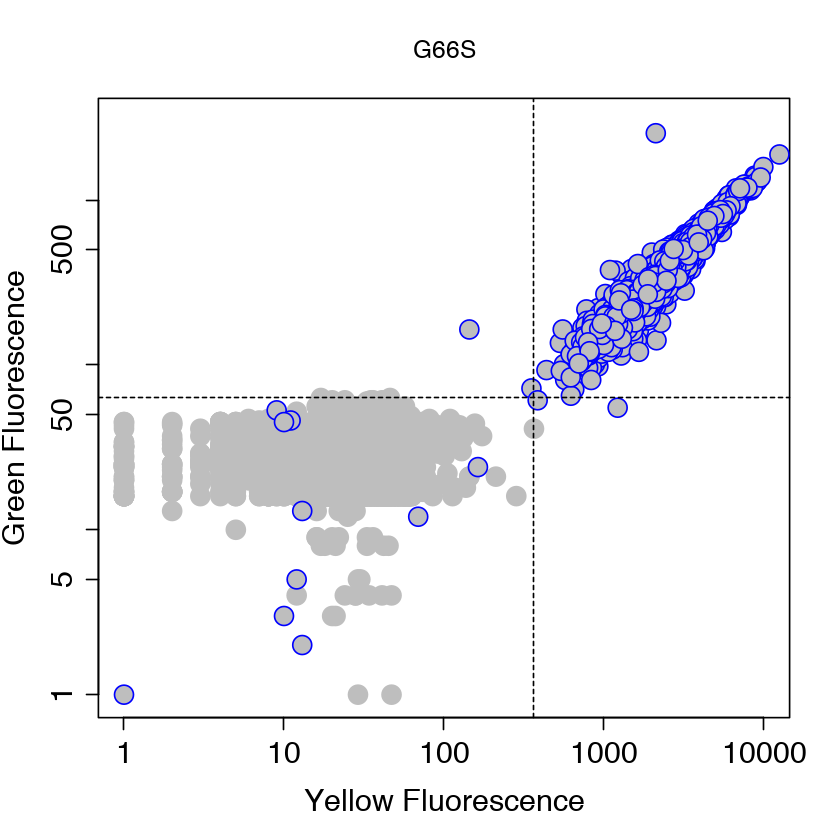

####################

---- Protein=M79L ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


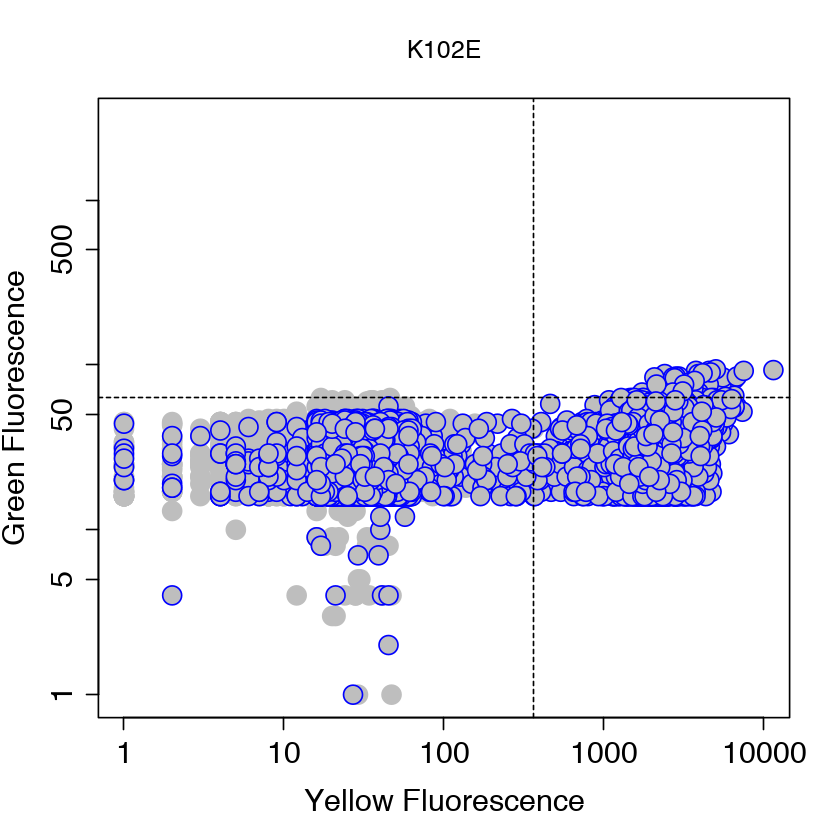

####################

---- Protein=R110S ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


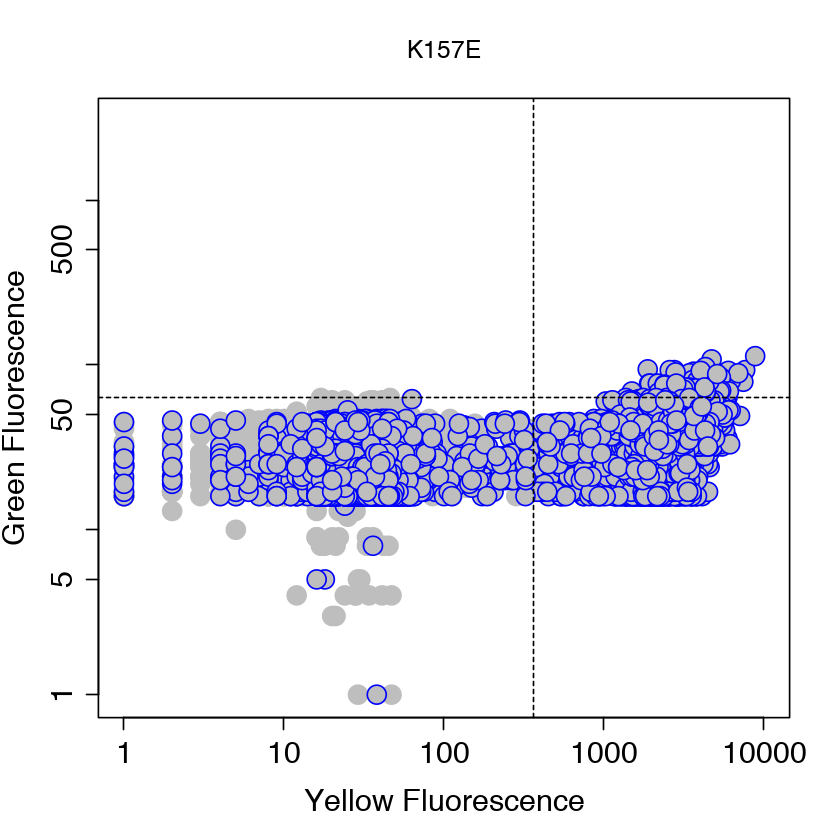

####################

---- Protein=T ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


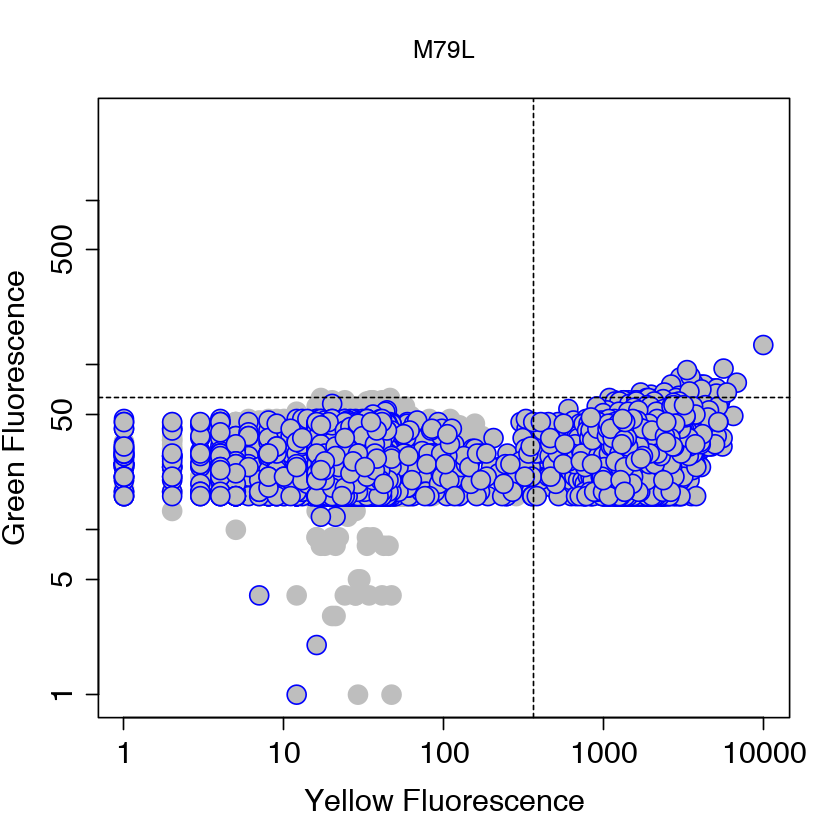

####################

---- Protein=T_E18G ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


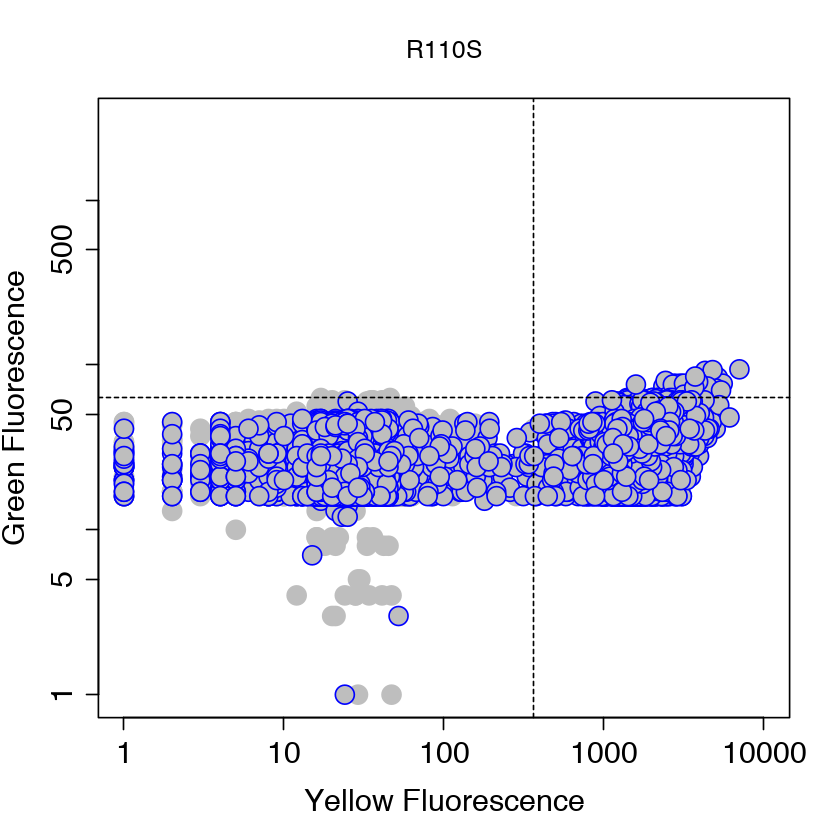

####################

---- Protein=T_E7K ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


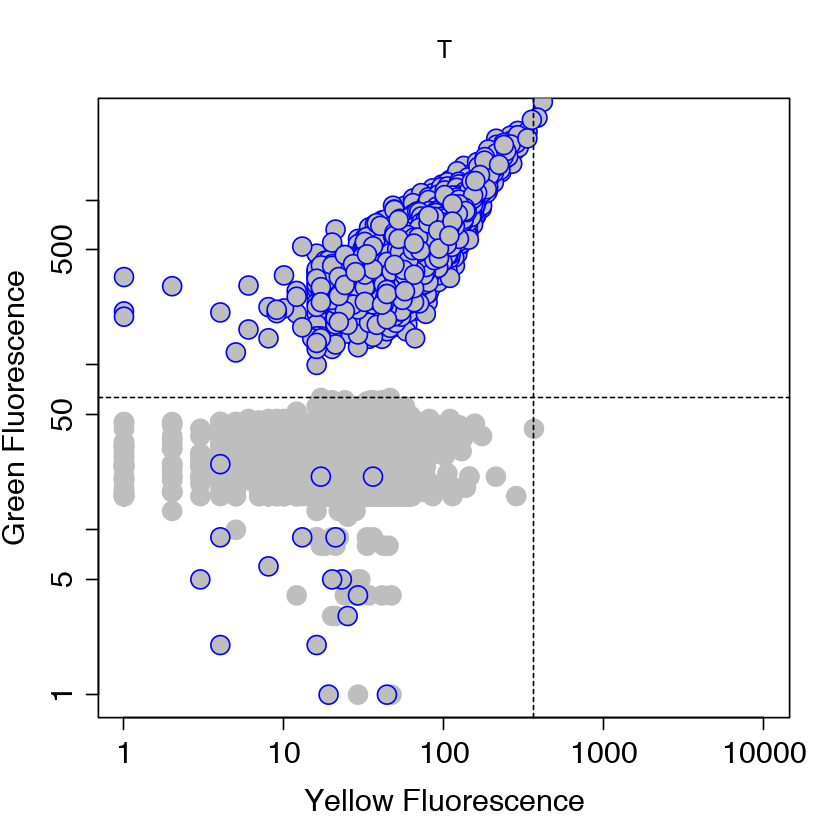

####################

---- Protein=T_F65L ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


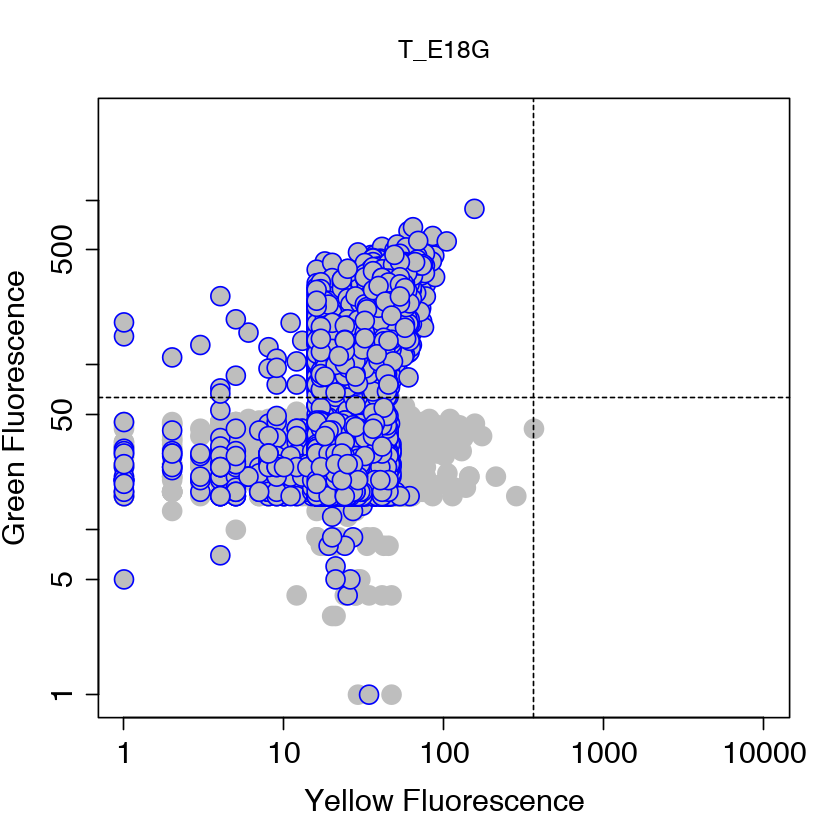

####################

---- Protein=T_F65S ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


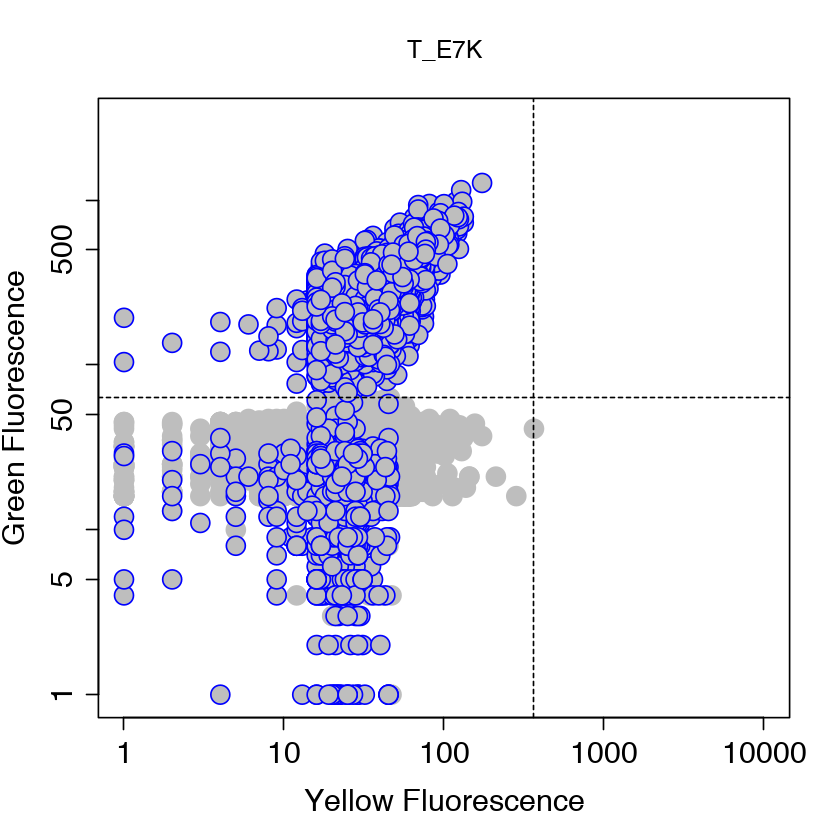

####################

---- Protein=T_F72C ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


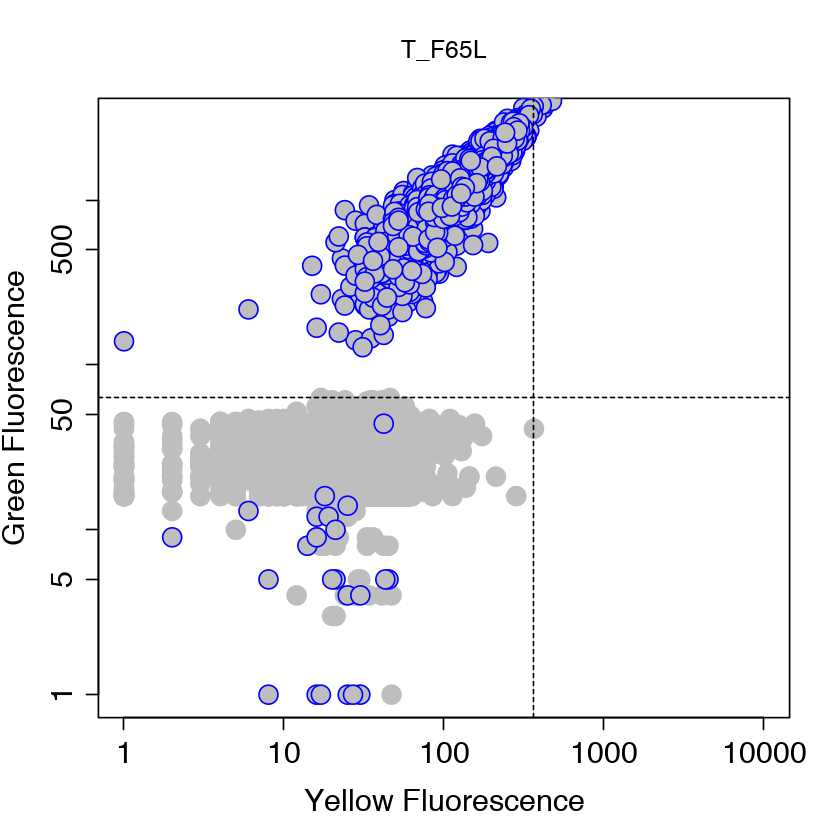

####################

---- Protein=T_F72I ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


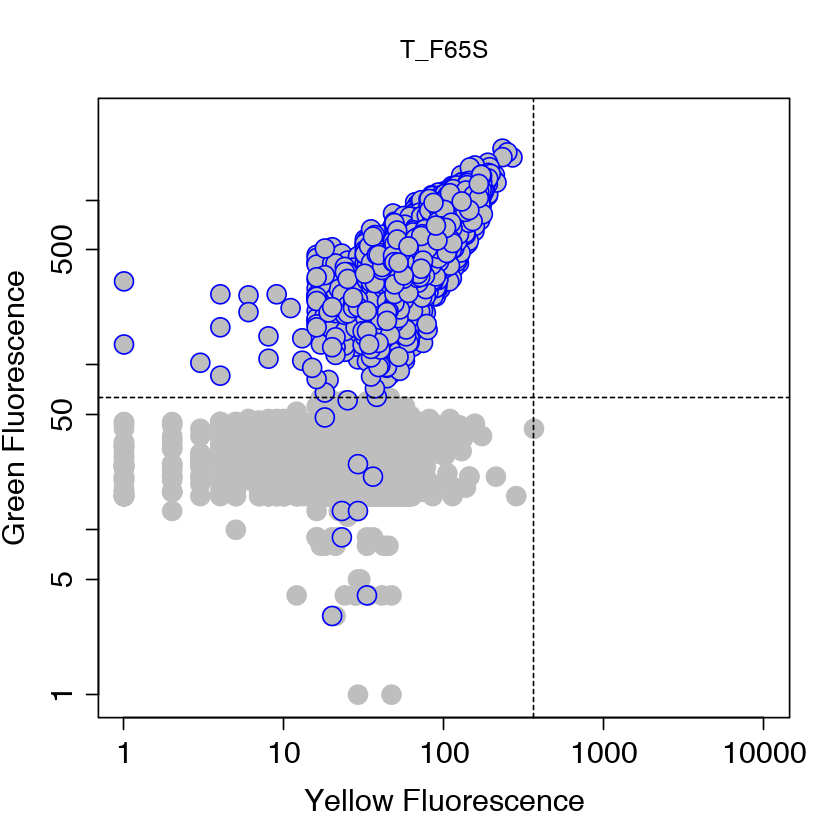

####################

---- Protein=T_G233D ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


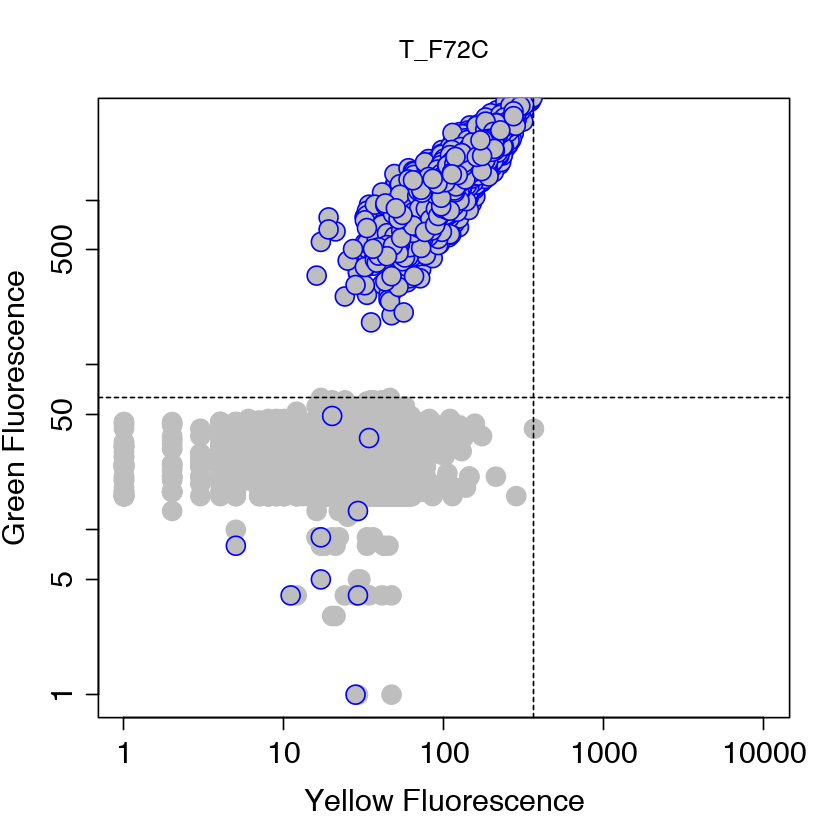

####################

---- Protein=T_G5S ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


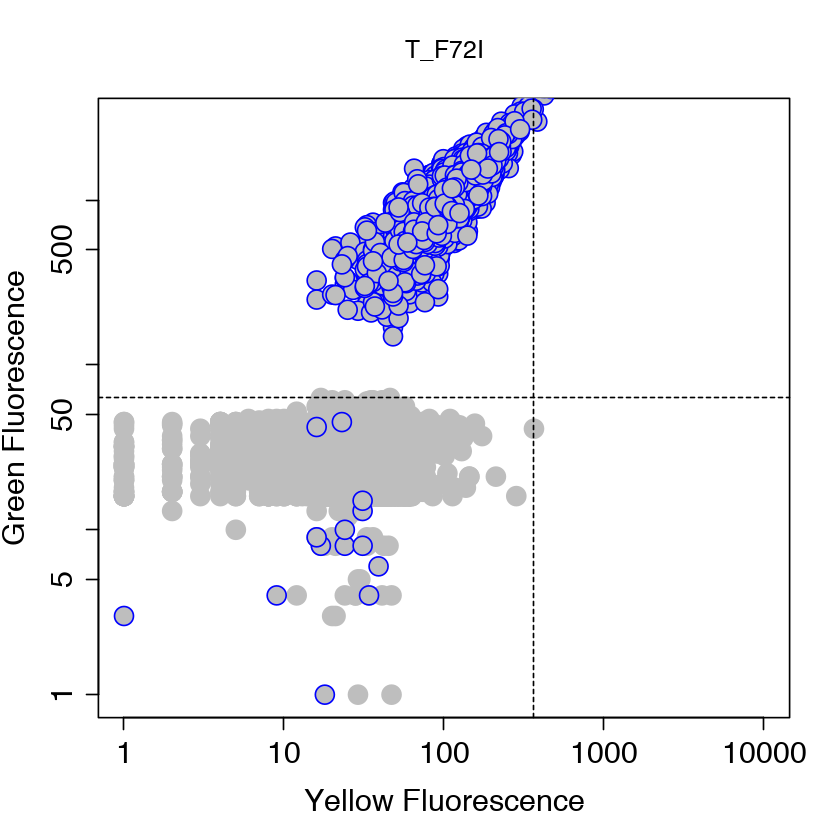

####################

---- Protein=T_I129T ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


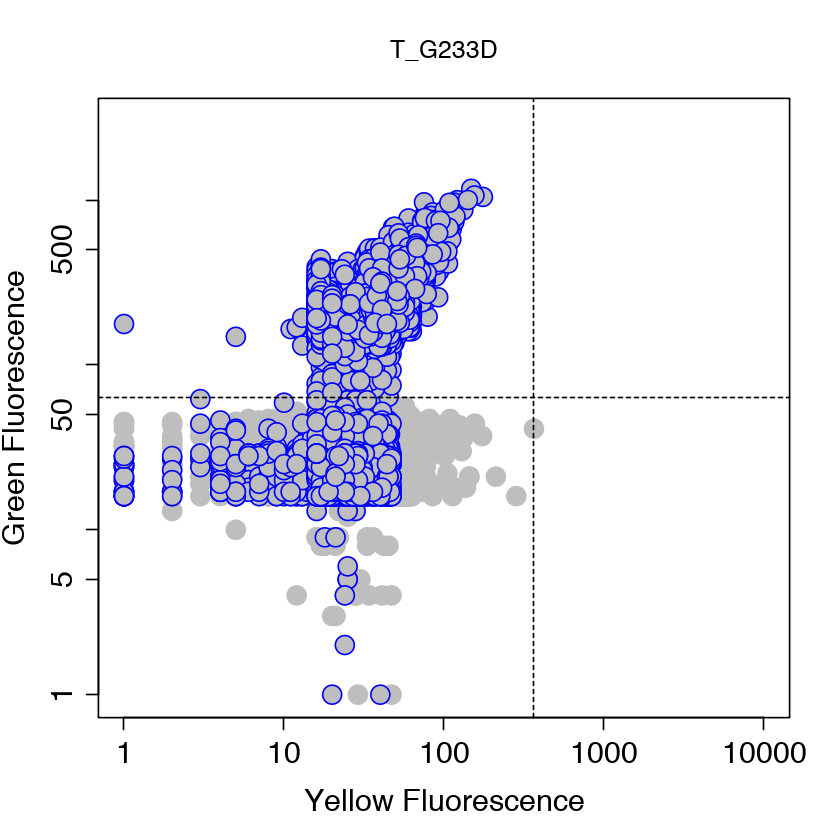

####################

---- Protein=T_I168V ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


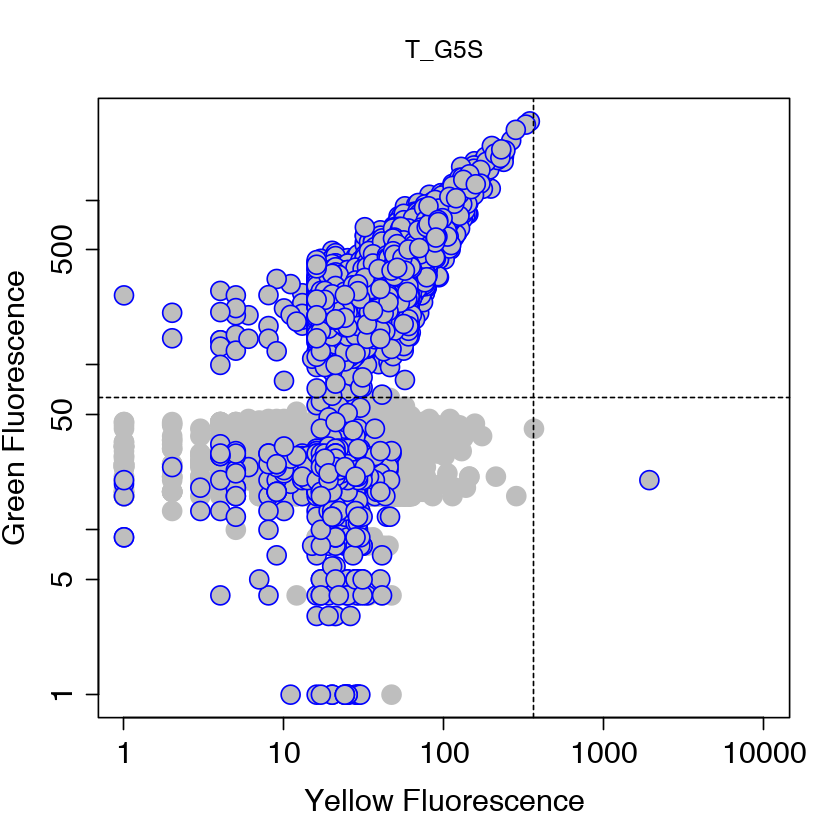

####################

---- Protein=T_I172V ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


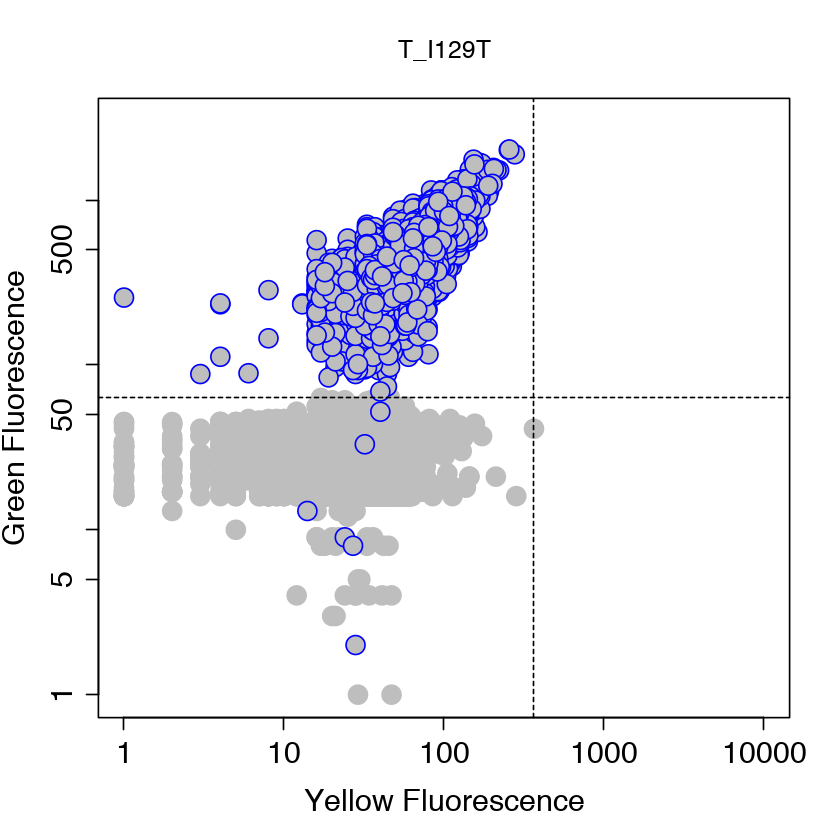

####################

---- Protein=T_K102E ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


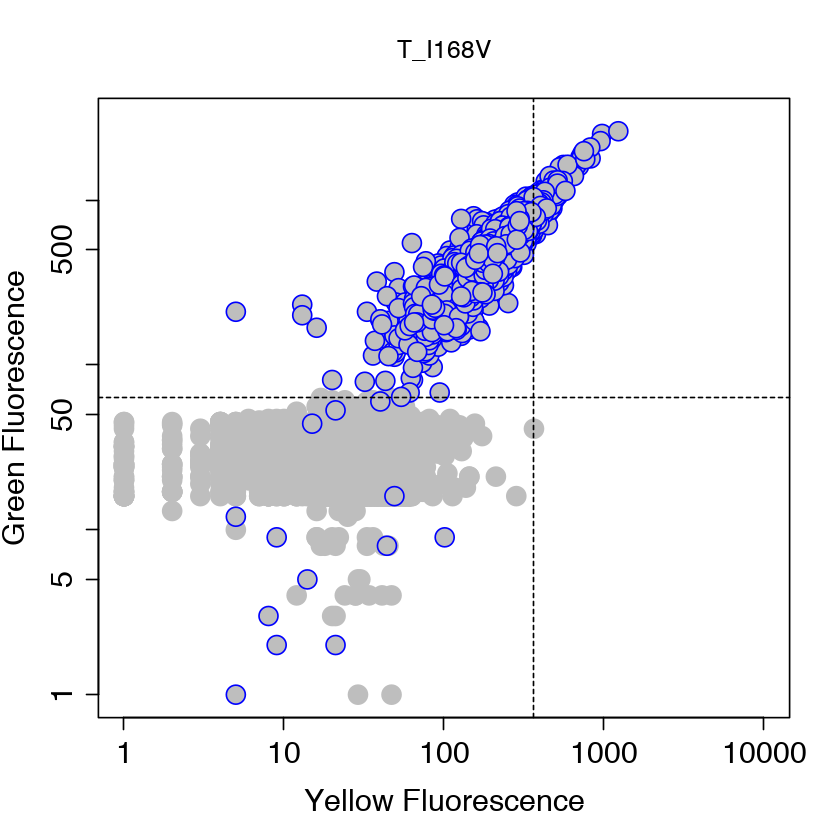

####################

---- Protein=T_K102R ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


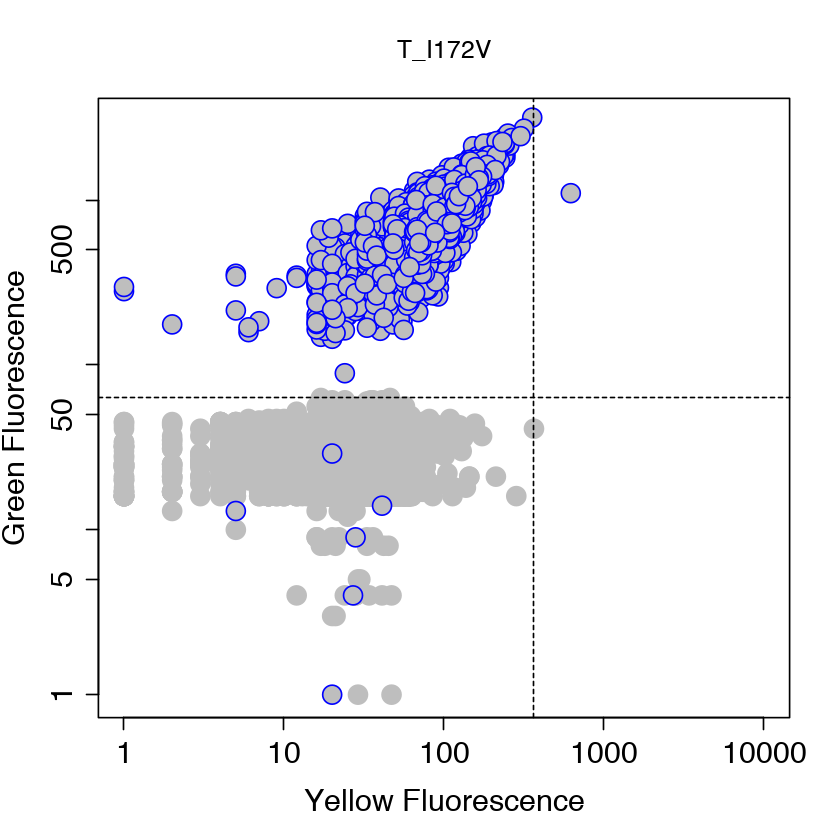

####################

---- Protein=T_K141R ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


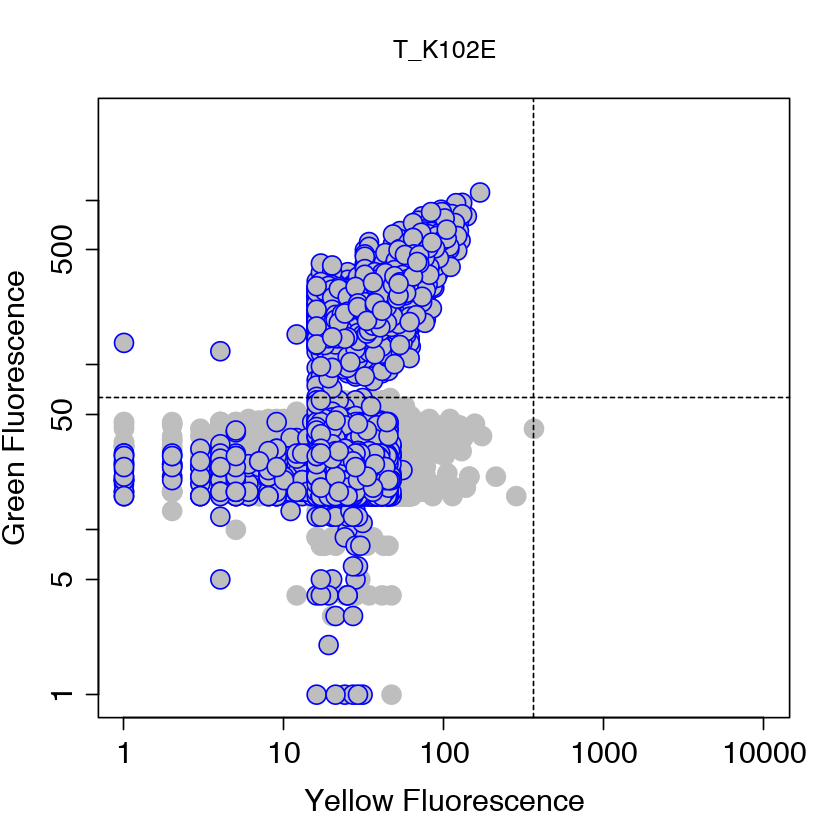

####################

---- Protein=T_K157E ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


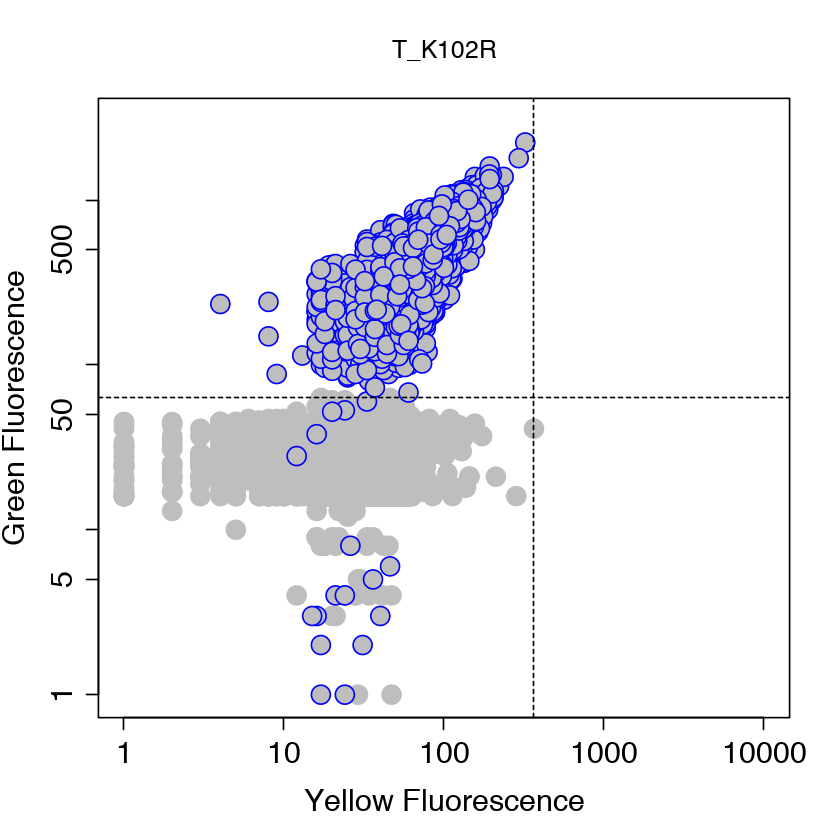

####################

---- Protein=T_K167E ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


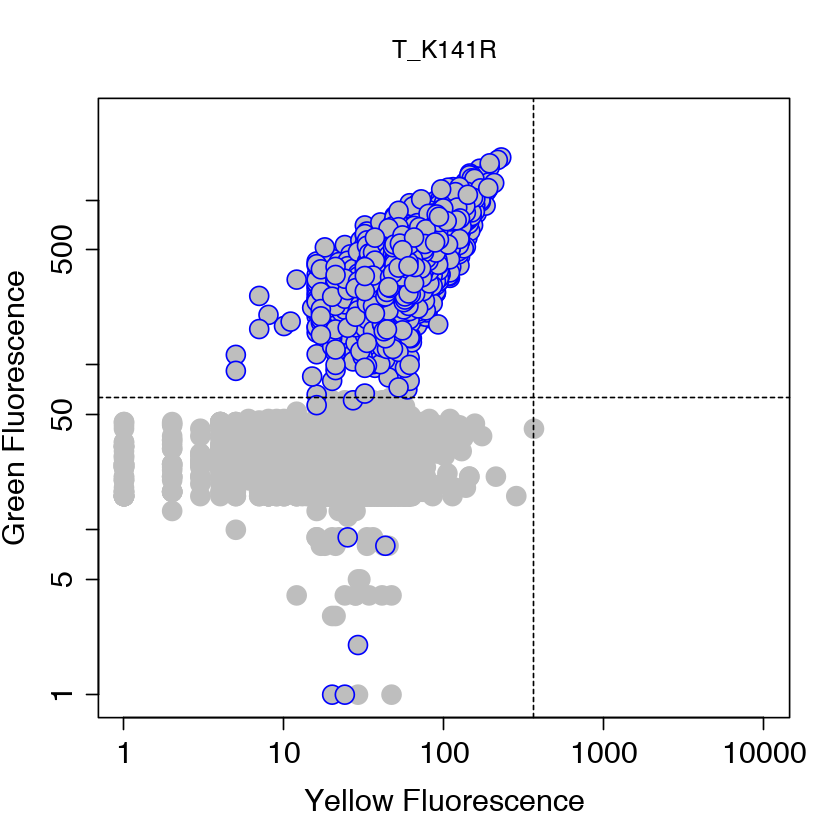

####################

---- Protein=T_M79L ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


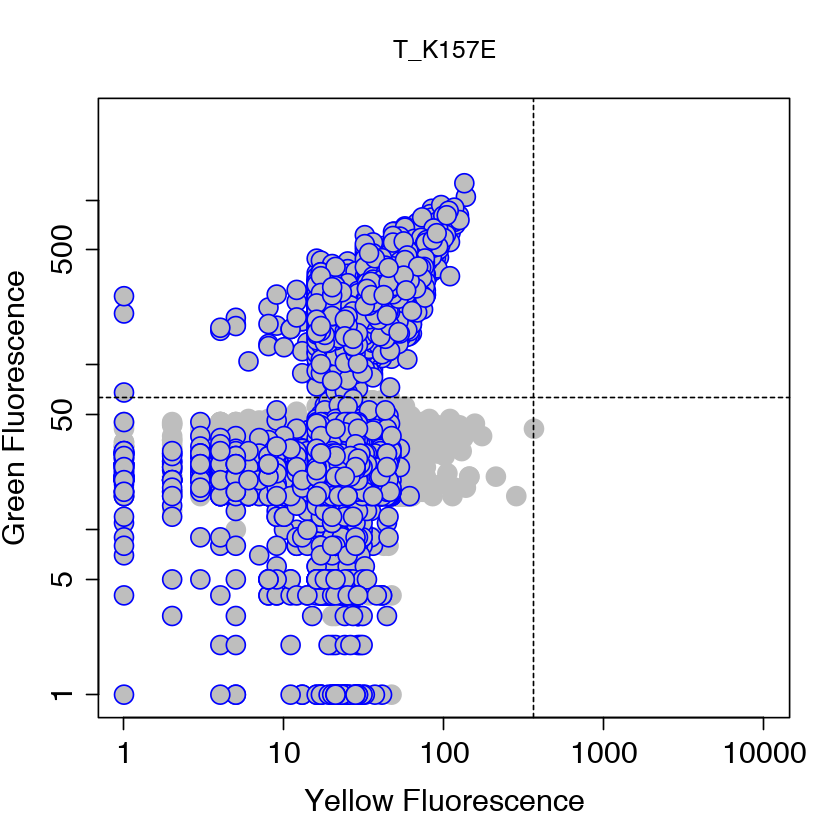

####################

---- Protein=T_N145S ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


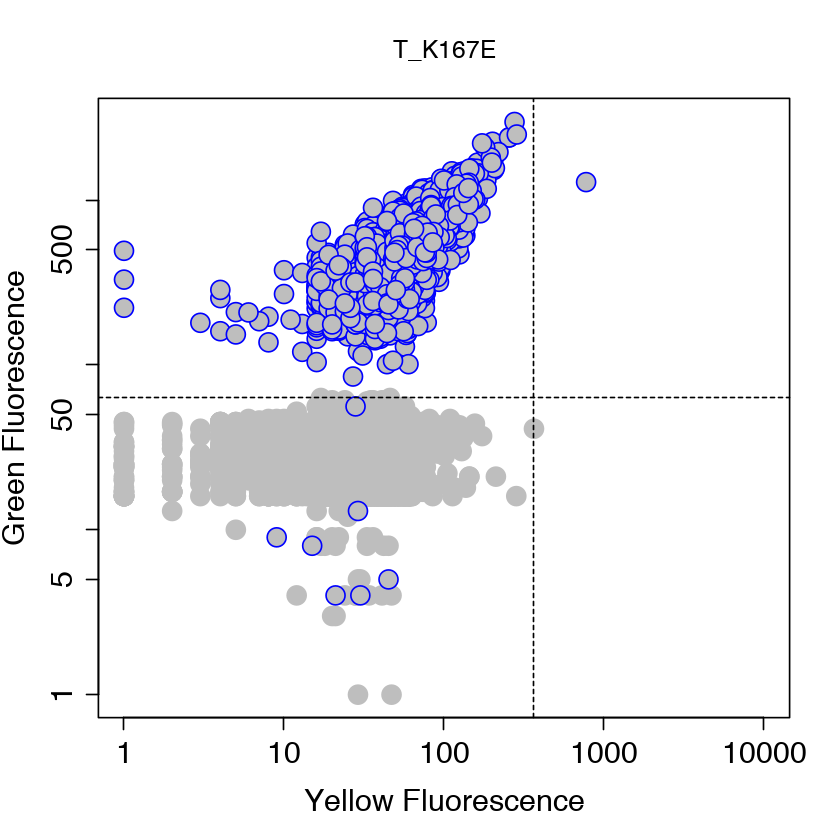

####################

---- Protein=T_R110S ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


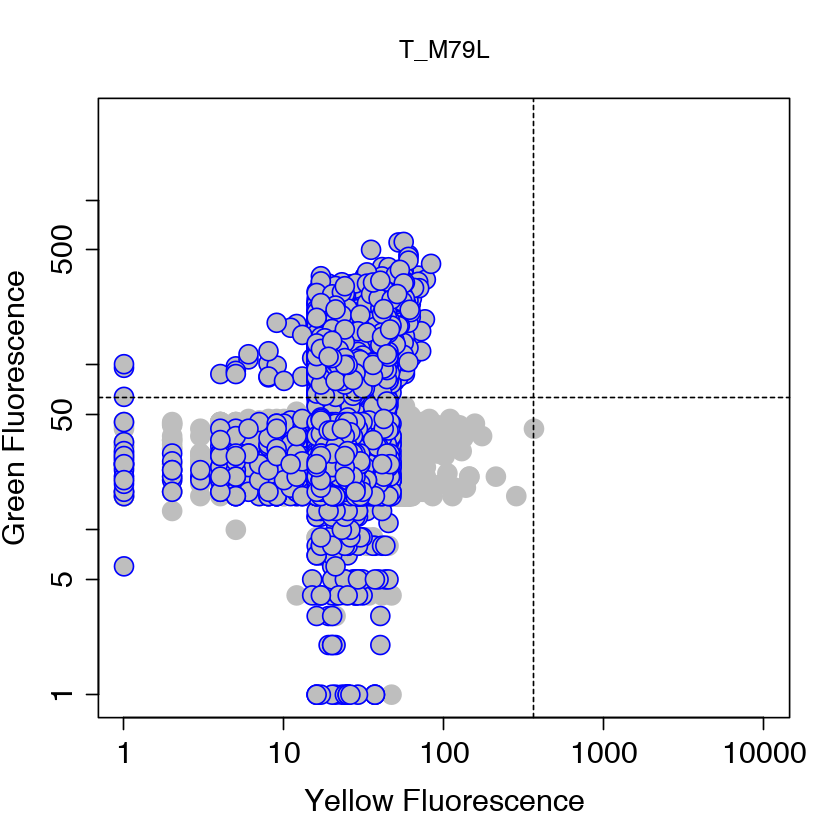

####################

---- Protein=T_V164A ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


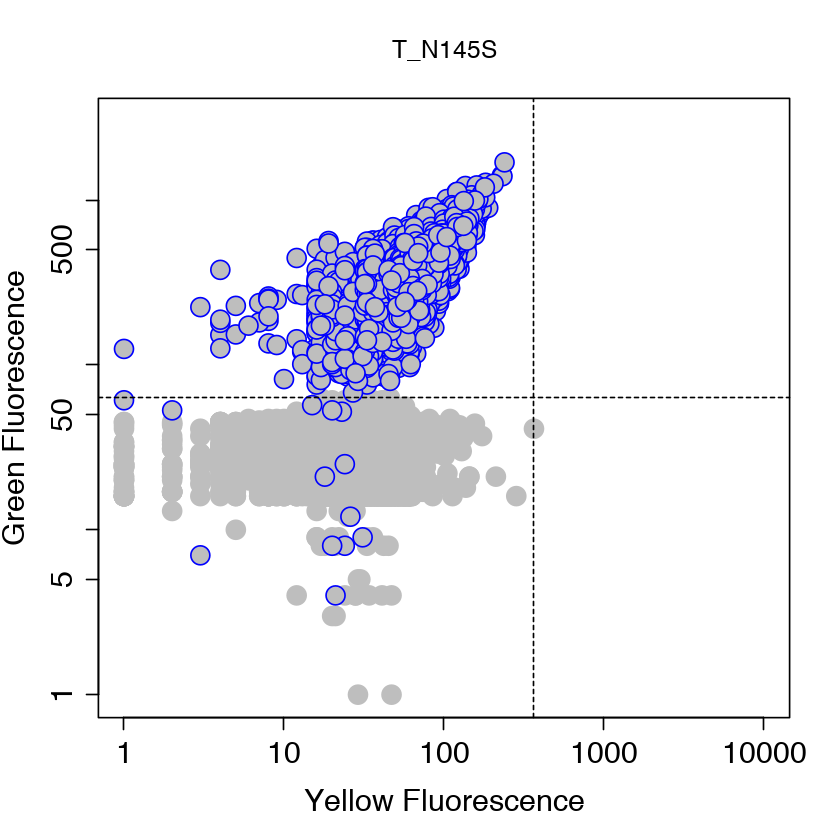

####################

---- Protein=T_V2A ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


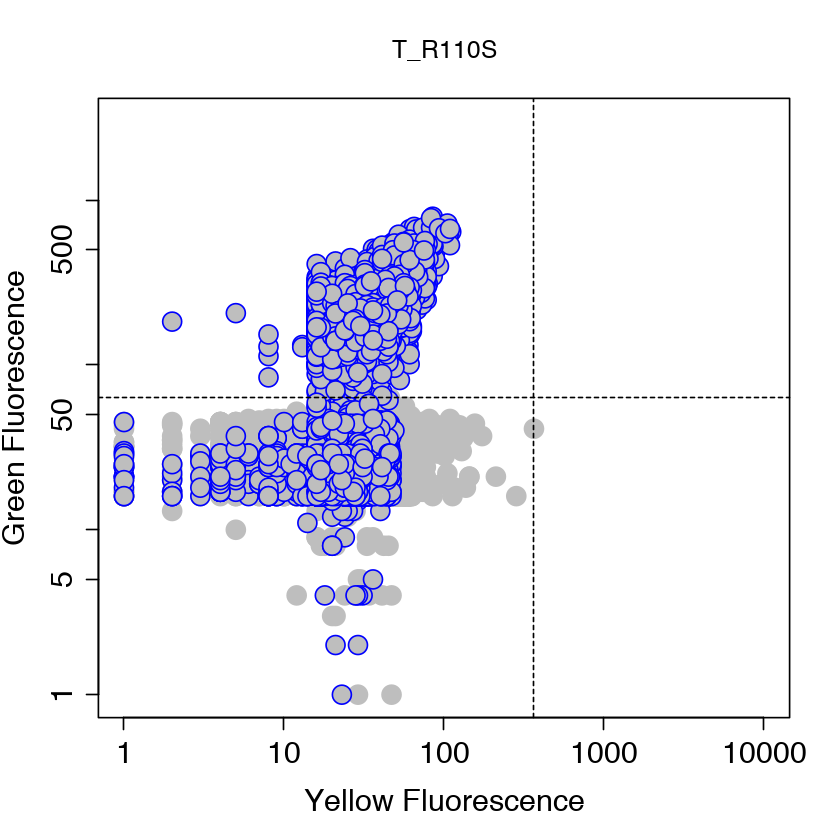

####################

---- Protein=T_V2M ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


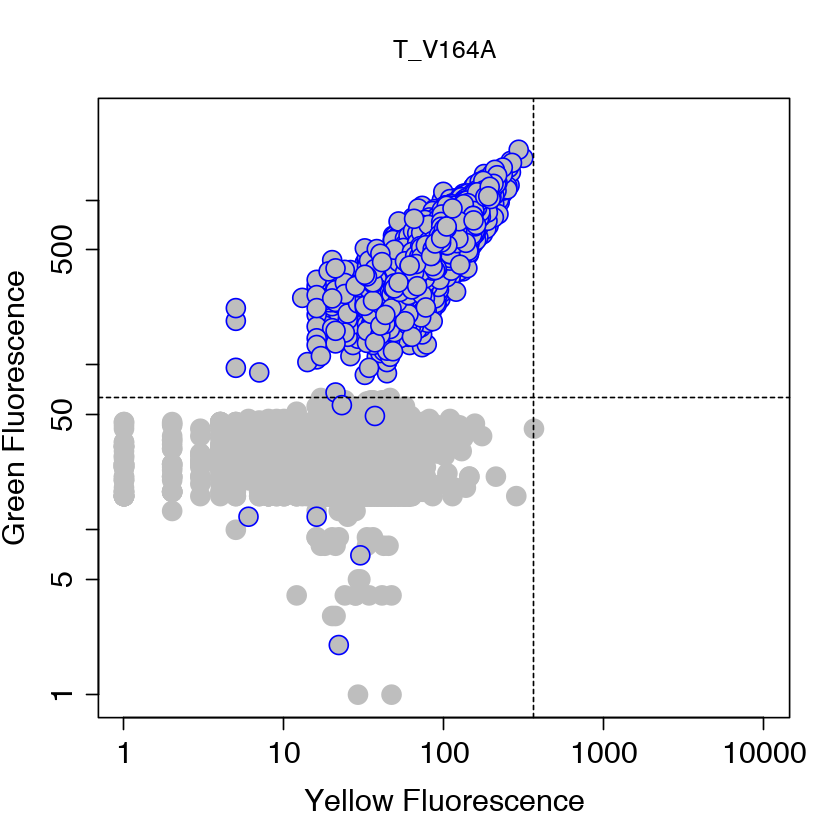

####################

---- Protein=WT ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


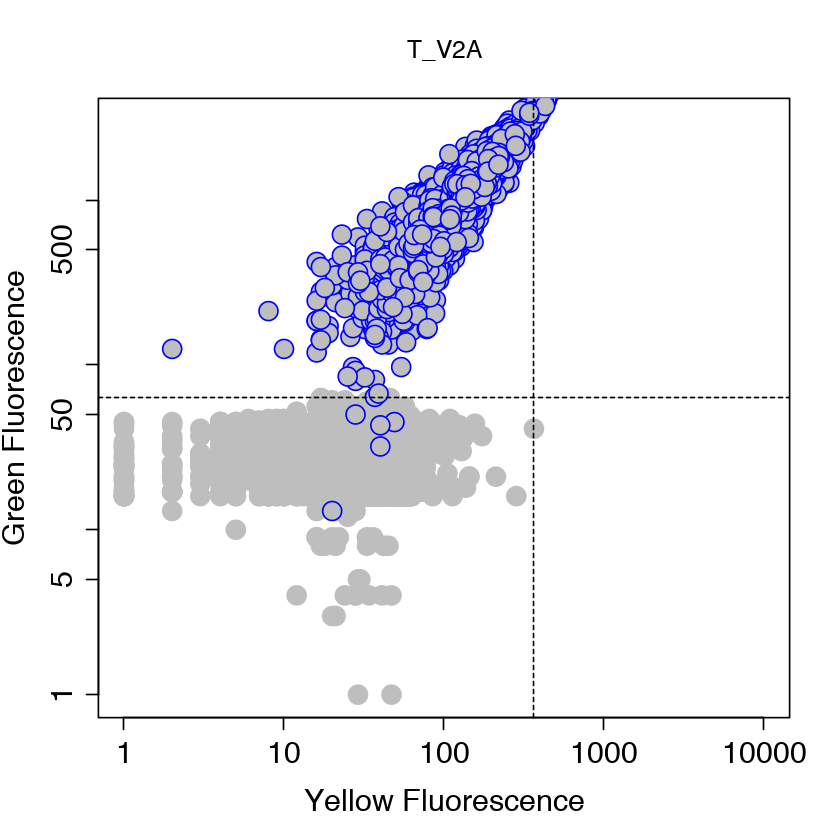

####################

---- Protein=X_E91A ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


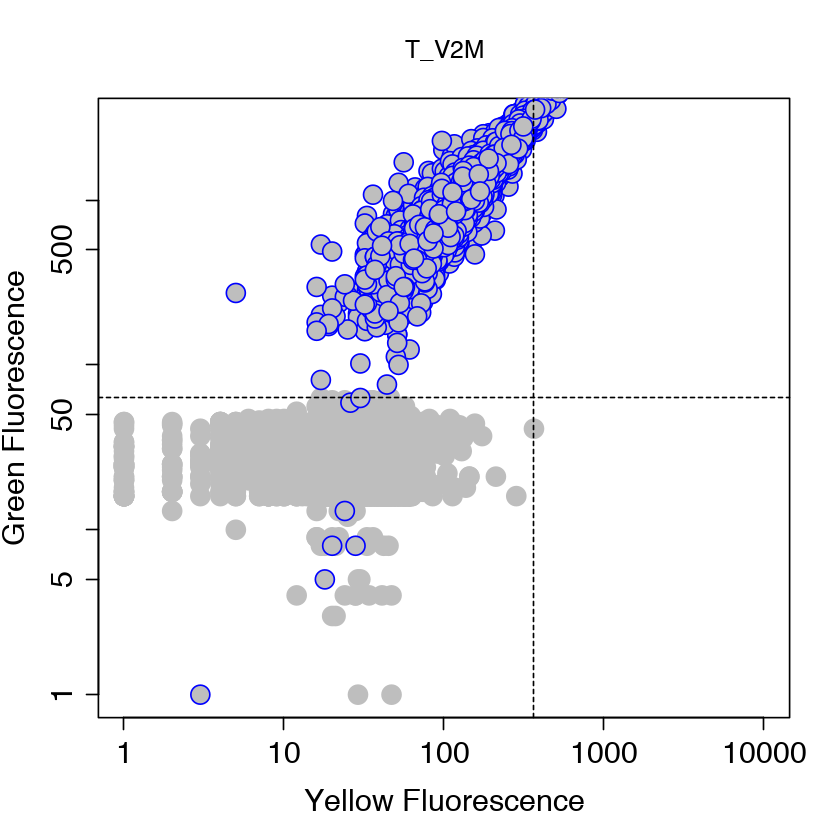

####################

---- Protein=X_F47L ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


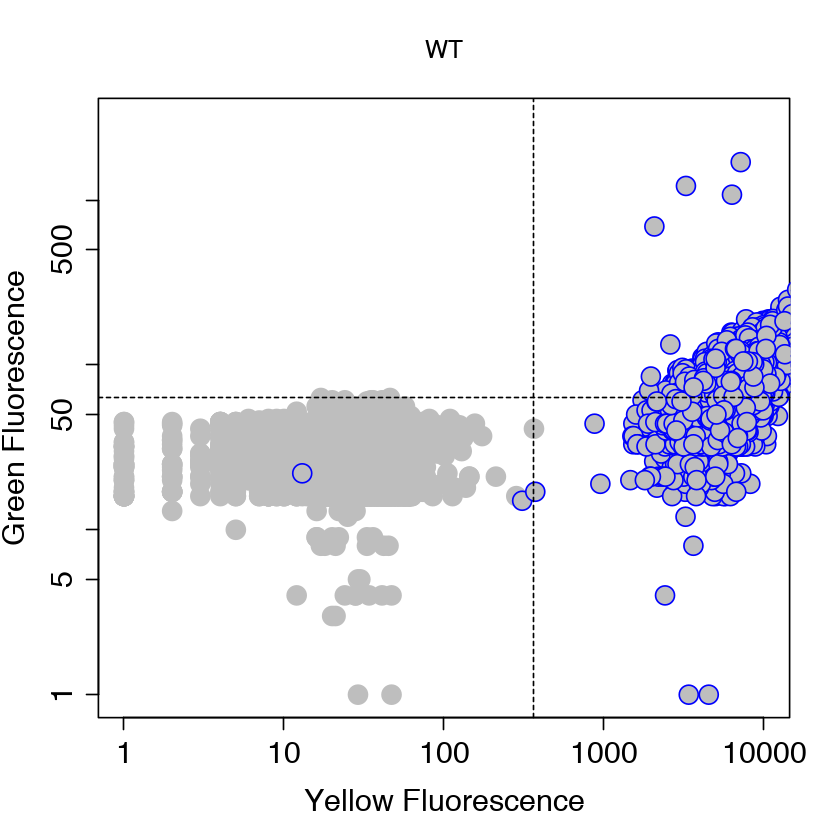

####################

---- Protein=X_F72S ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


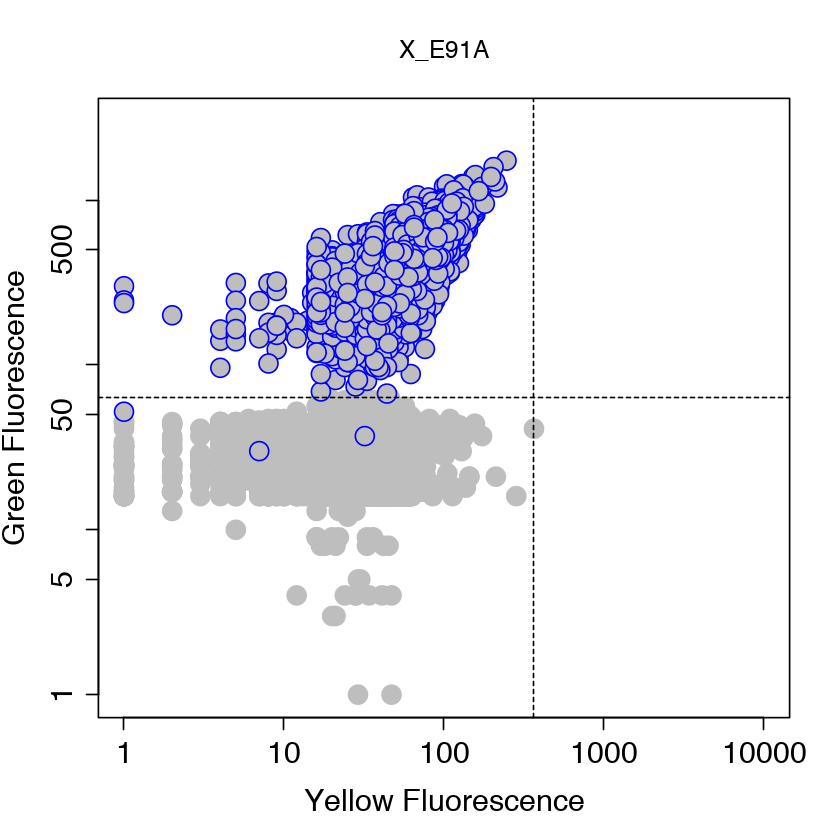

####################

---- Protein=X_I48V ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


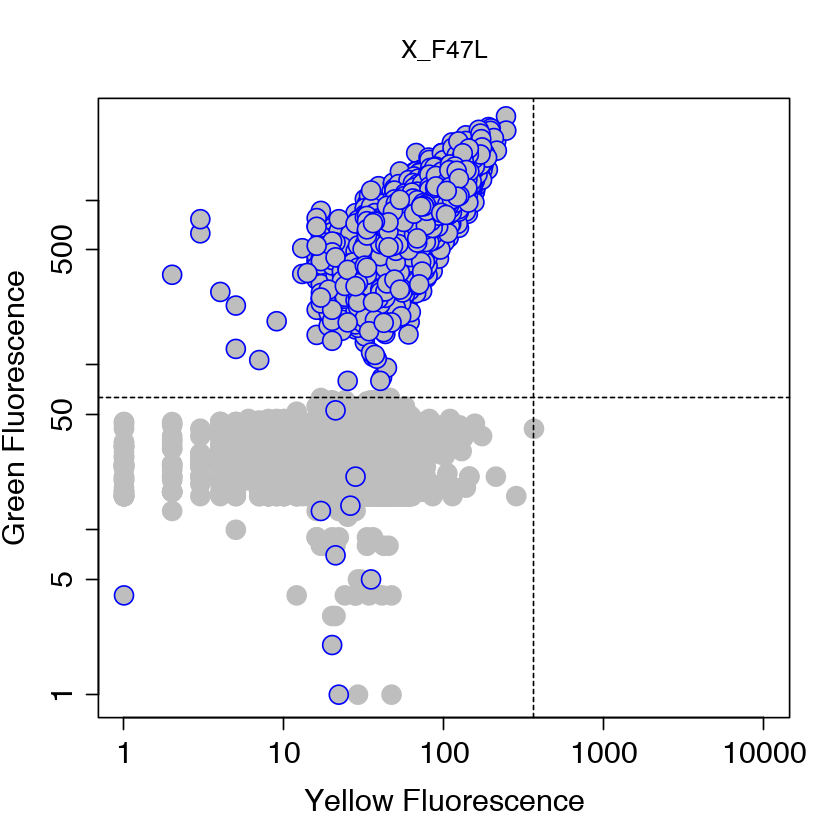

####################

---- Protein=X_K42R ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


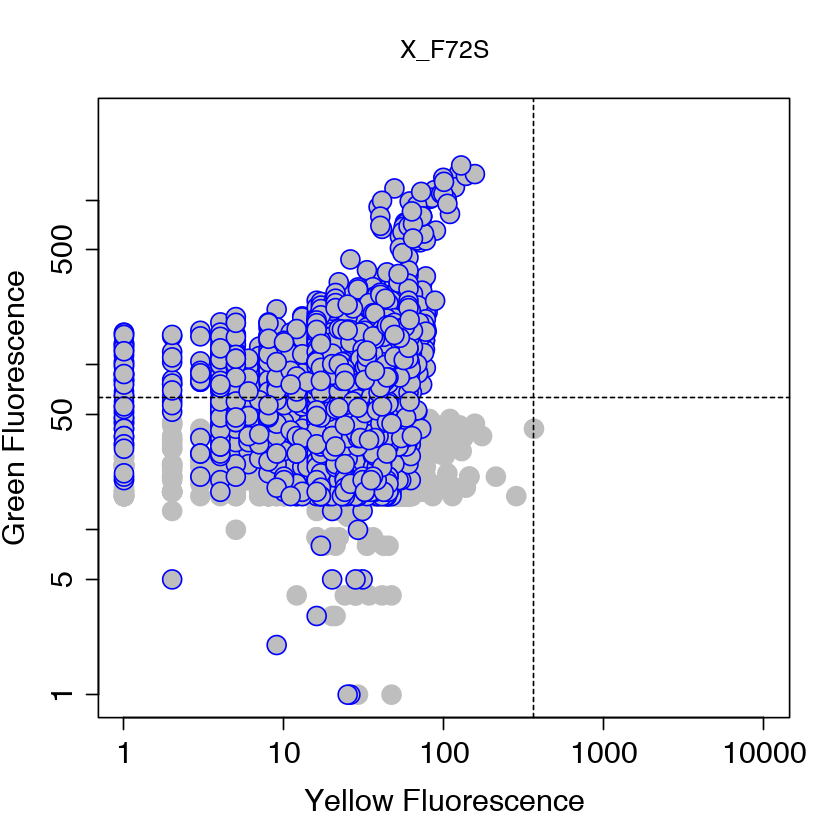

####################

---- Protein=X_R74H ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


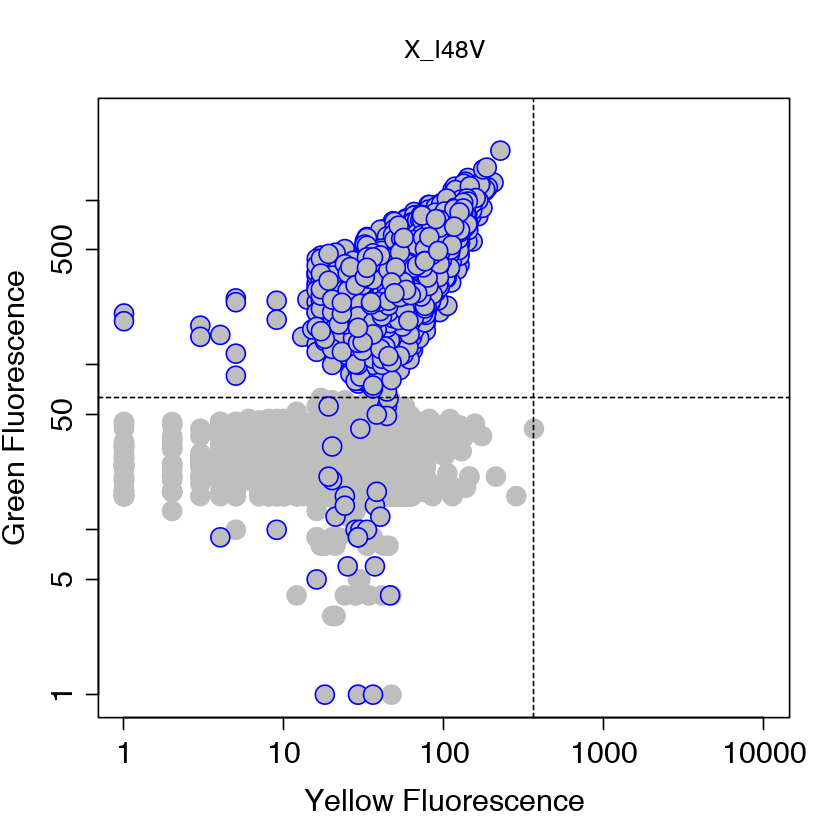

####################

---- Protein=X_T60S ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


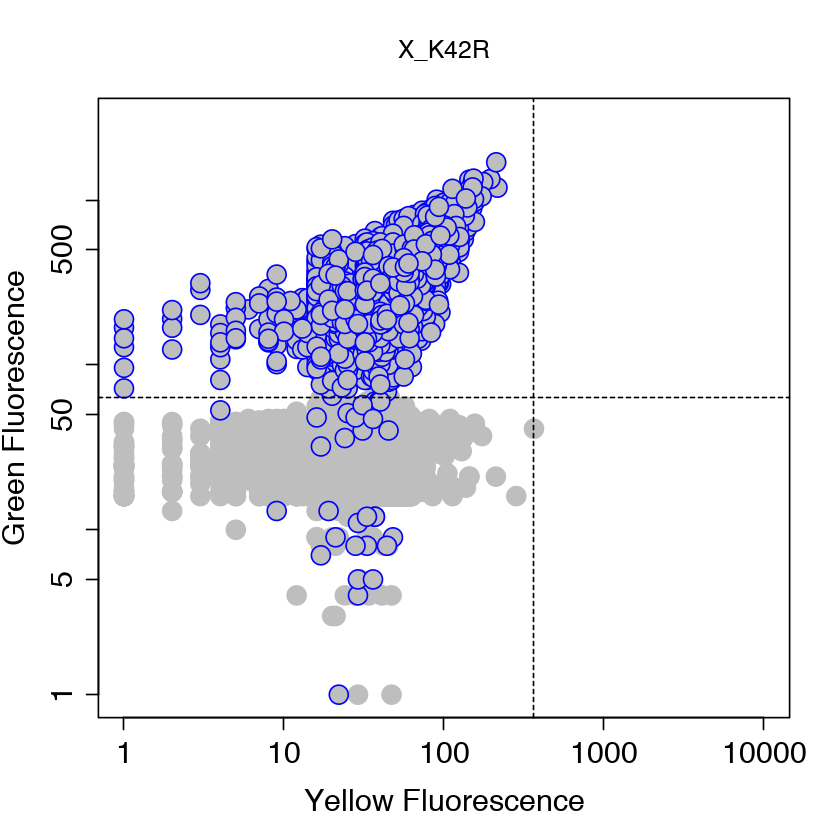

####################

---- Protein=X_V2A ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


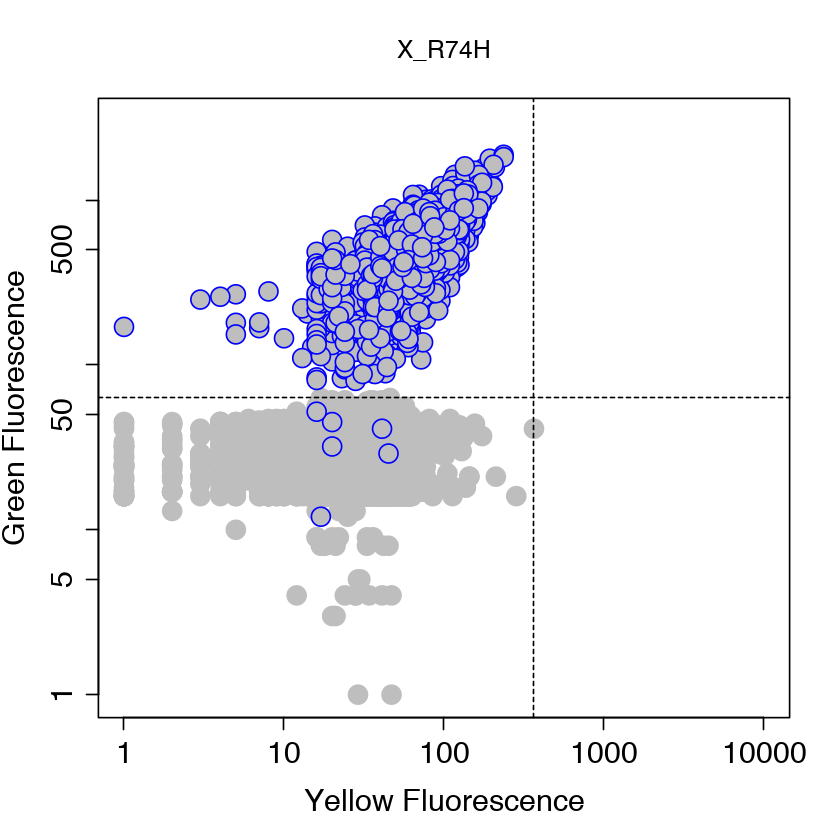

####################

---- Protein=X_V2M ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


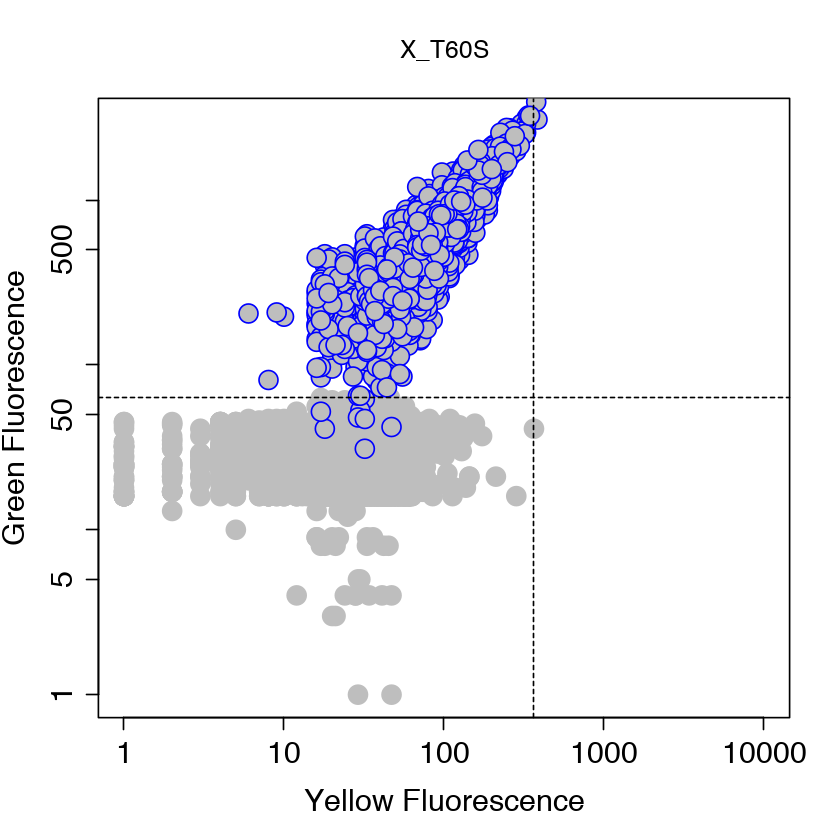

####################

---- Protein=Y_F47L ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


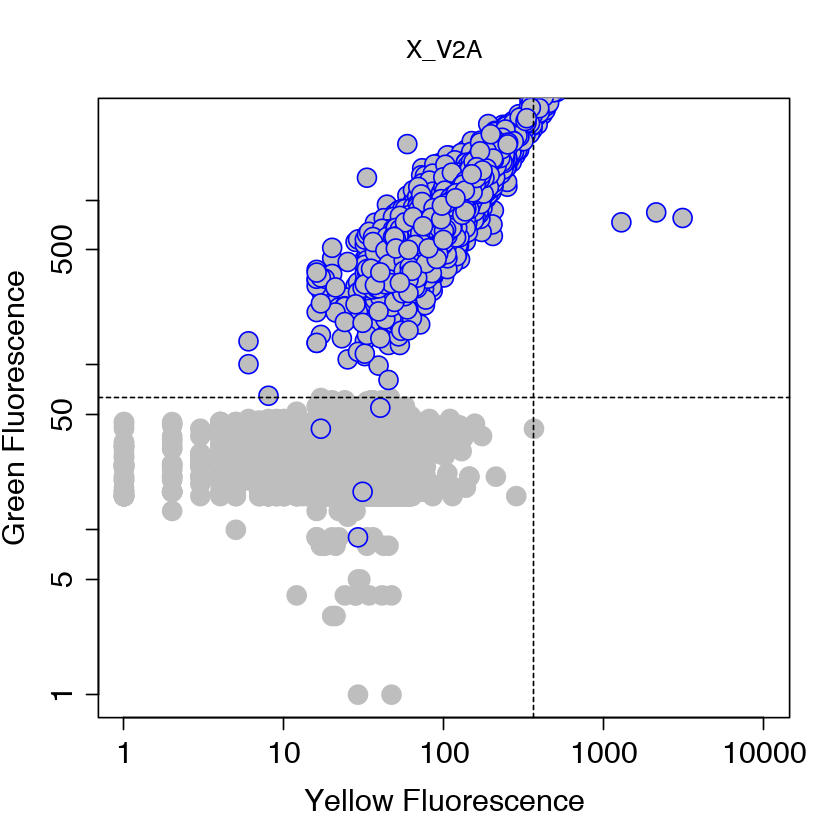

####################

---- Protein=Y_F65L ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


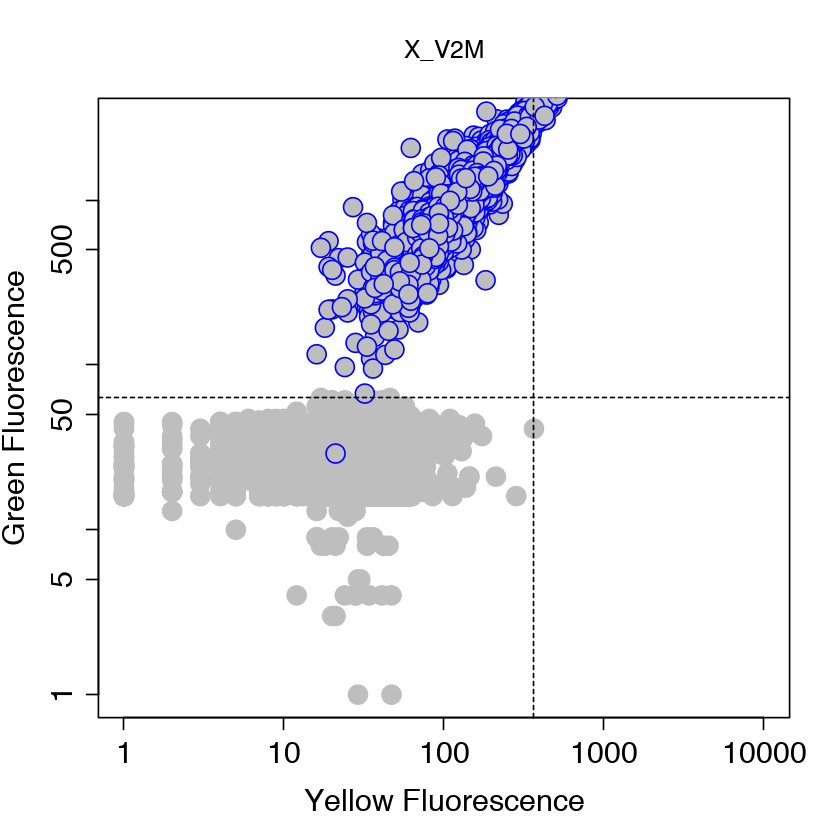

####################

---- Protein=Y_F65S ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


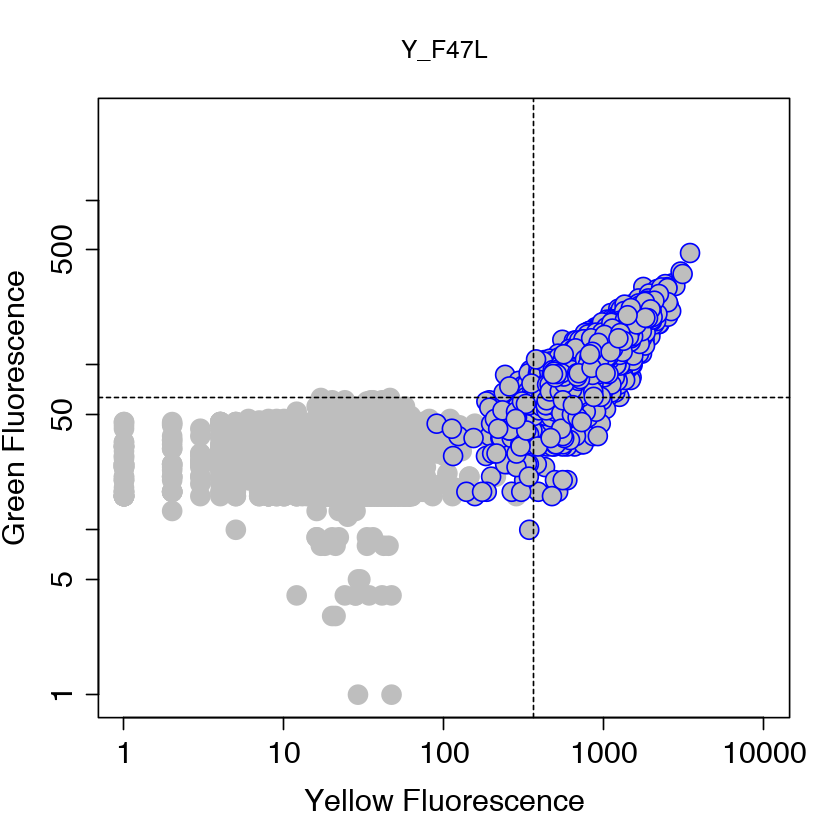

####################

---- Protein=Y_F72C ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


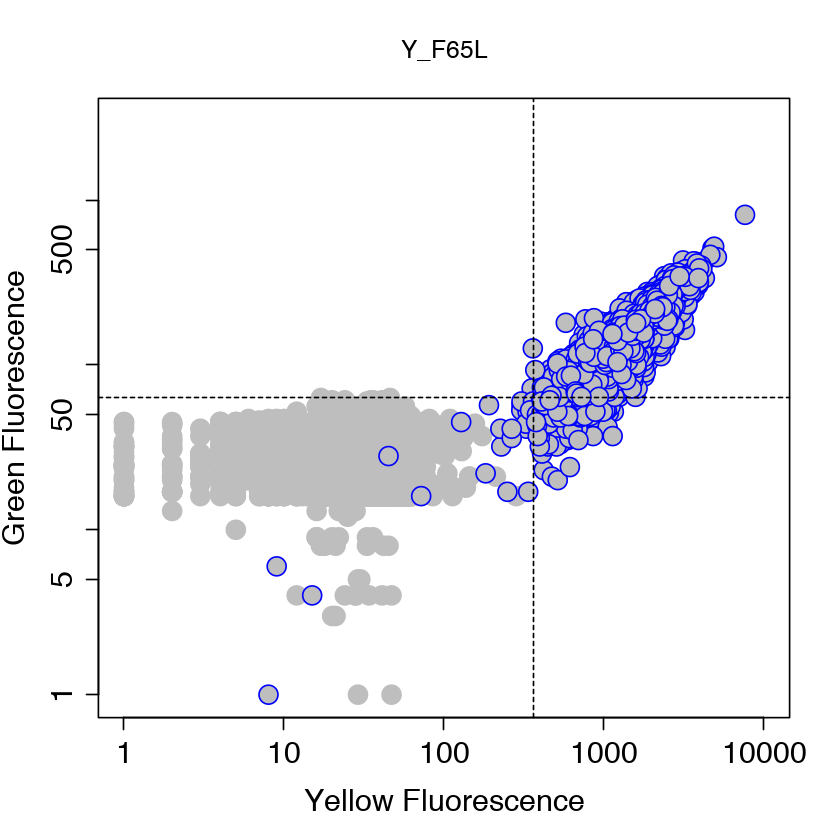

####################

---- Protein=Y_F72I ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


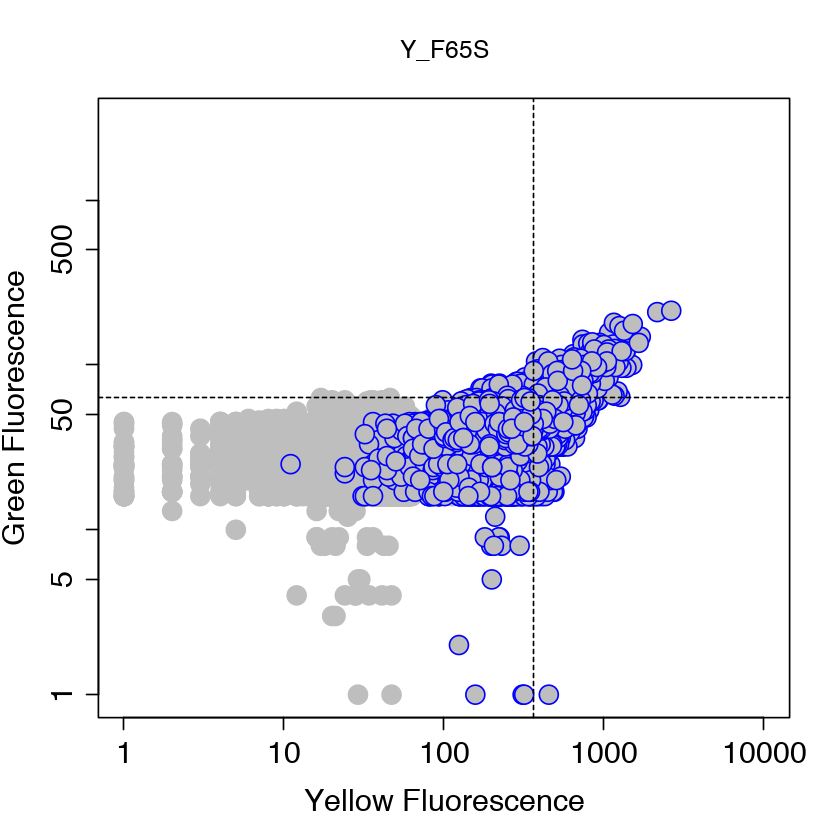

####################

---- Protein=Y_I129T ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


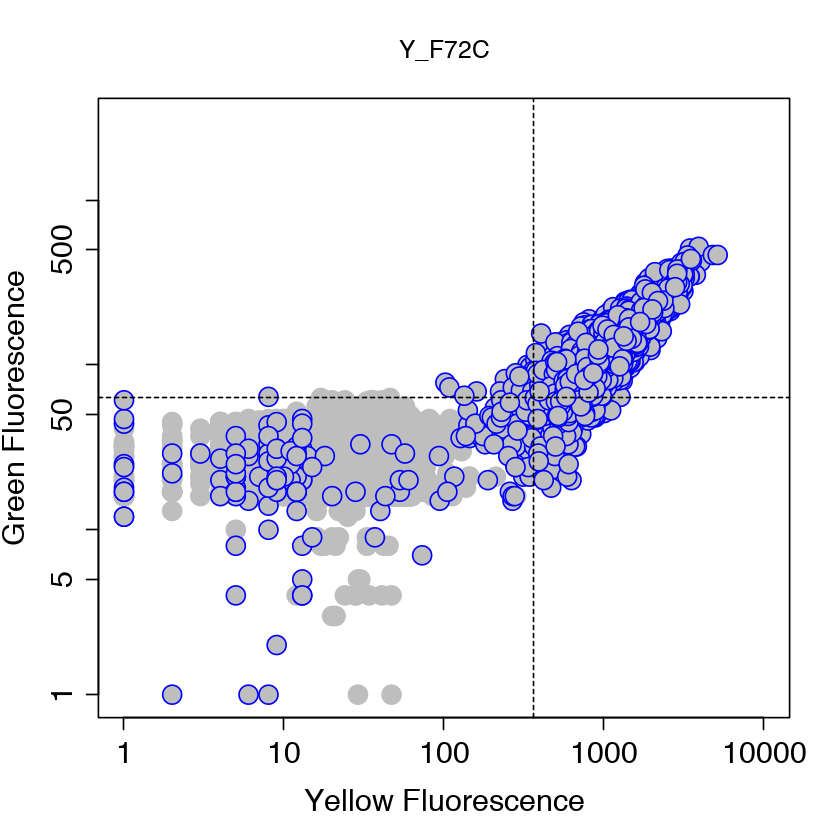

####################

---- Protein=Y_I168V ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


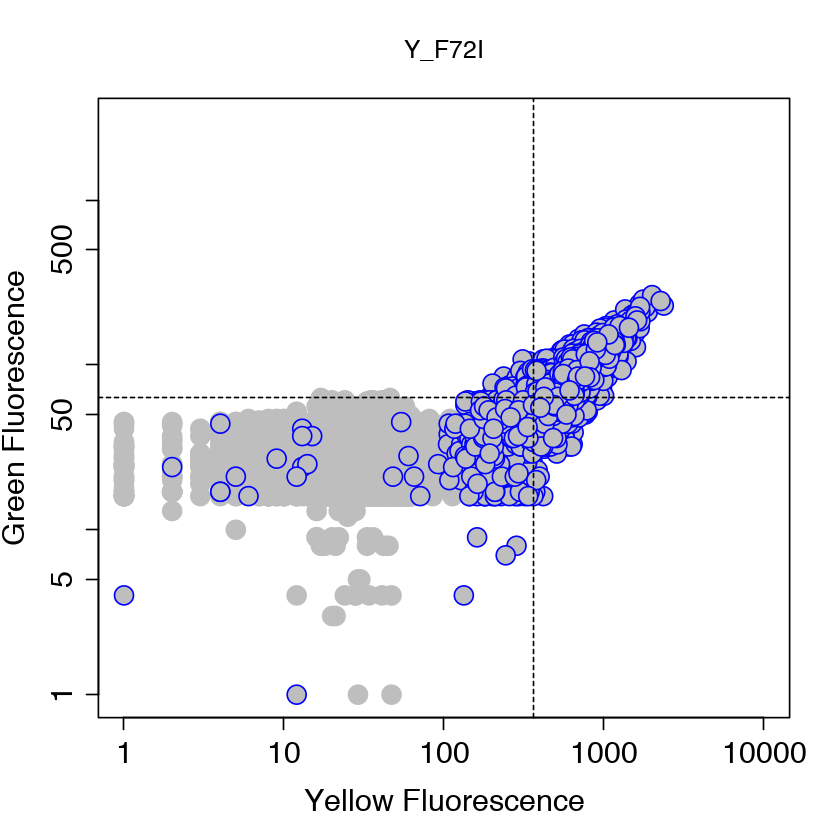

####################

---- Protein=Y_I172V ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


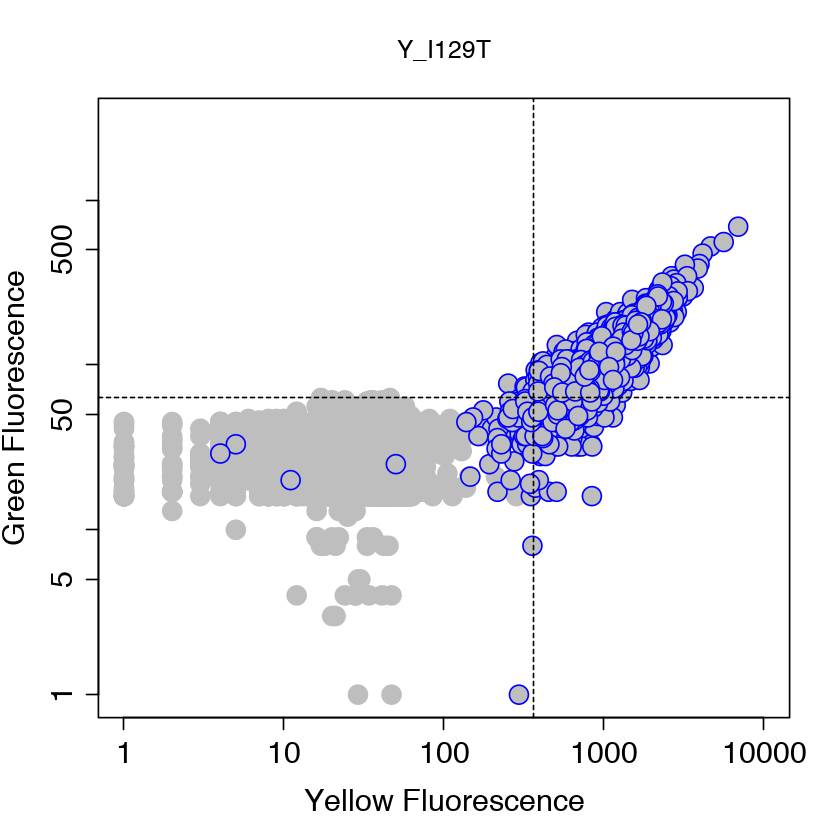

####################

---- Protein=Y_K102R ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


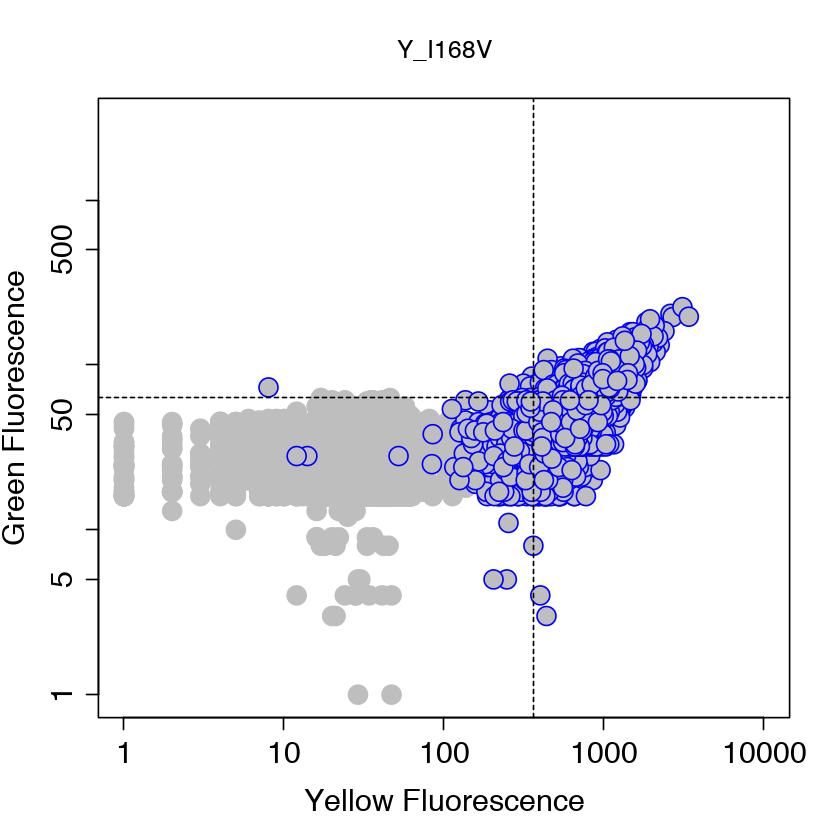

####################

---- Protein=Y_K141R ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


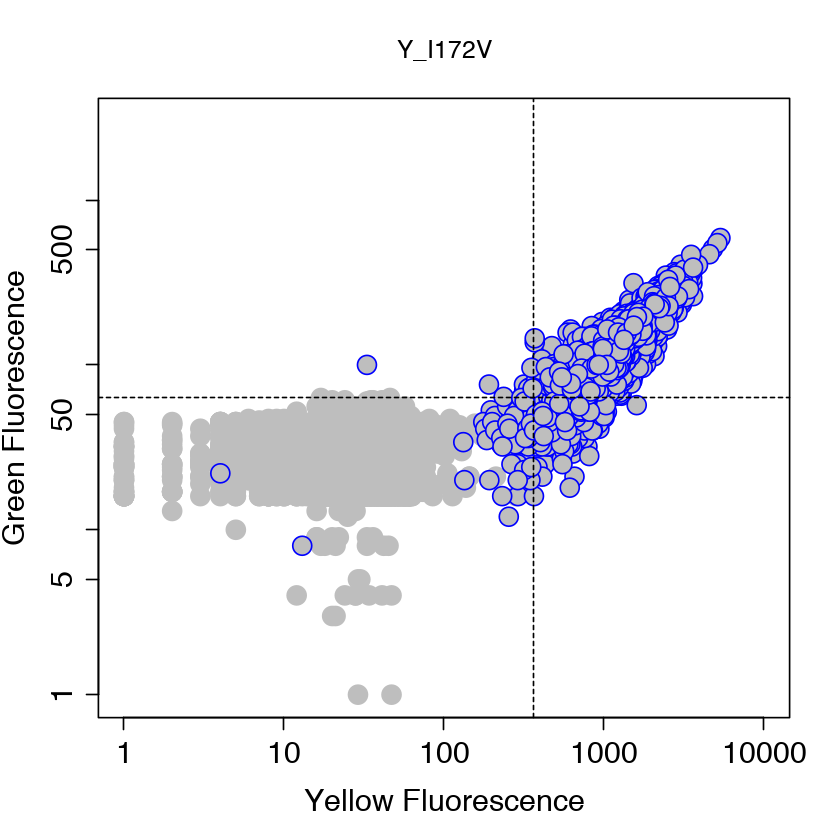

####################

---- Protein=Y_N145S ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


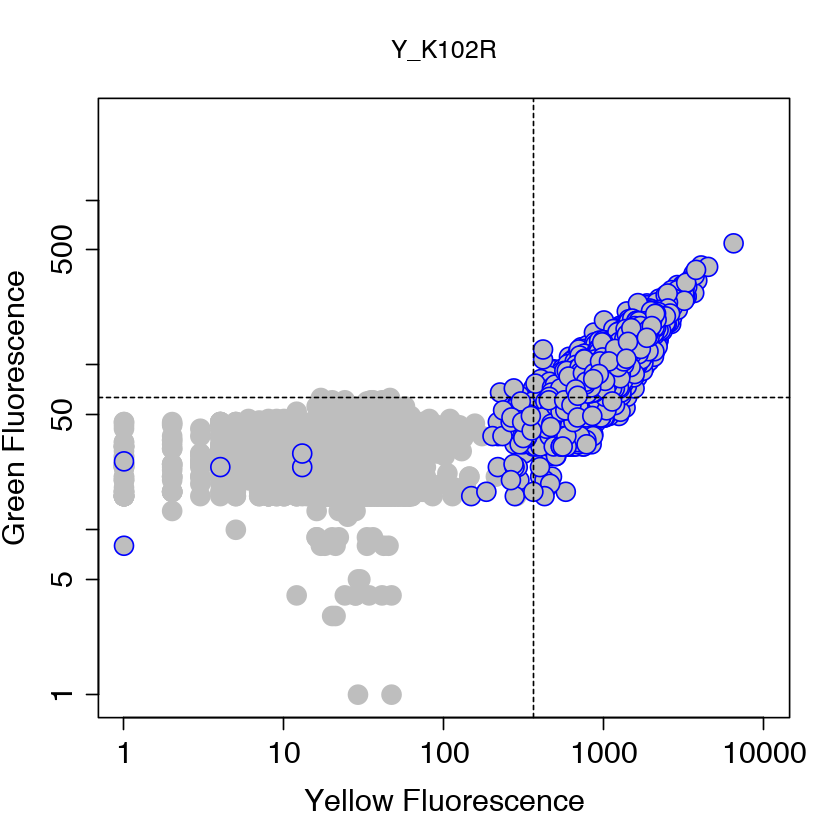

####################

---- Protein=Y_V164A ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


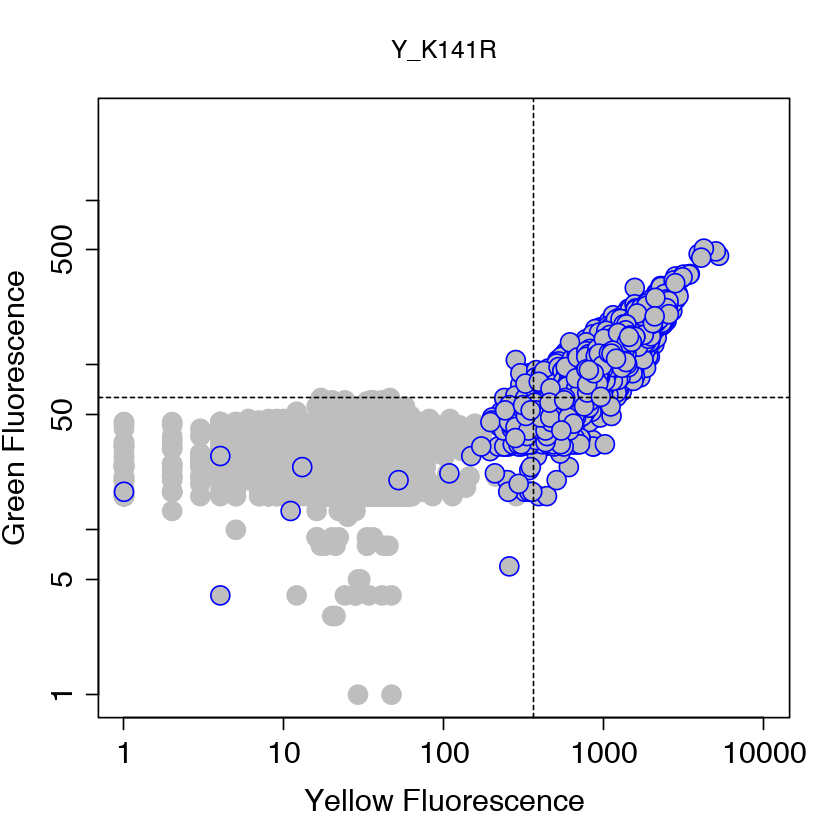

####################

---- Protein=Y_V2A ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


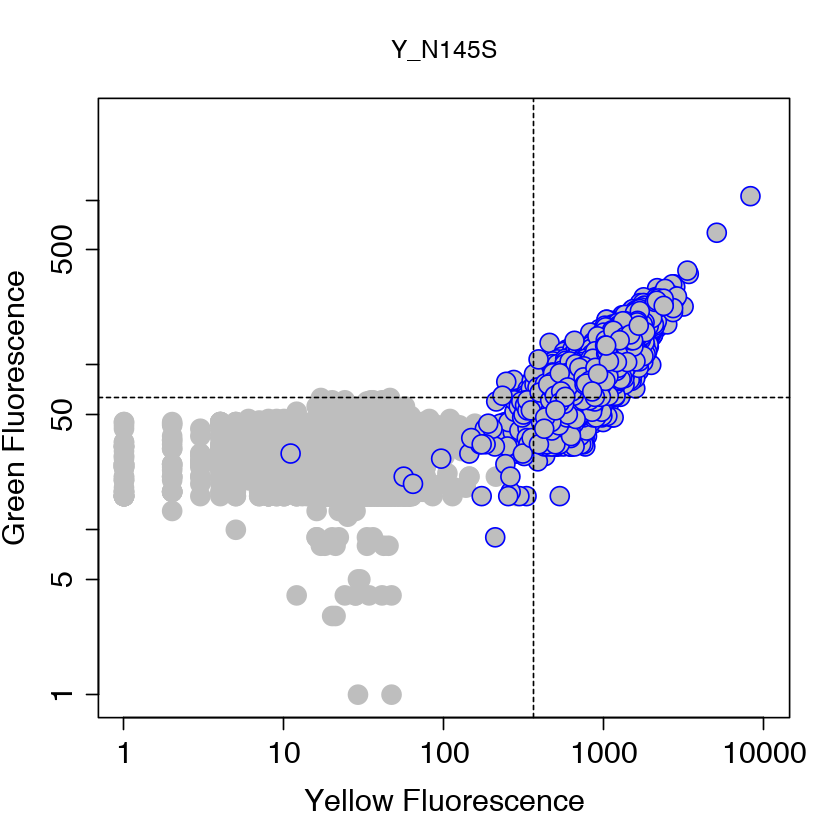

####################

---- Protein=Y_V2M ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


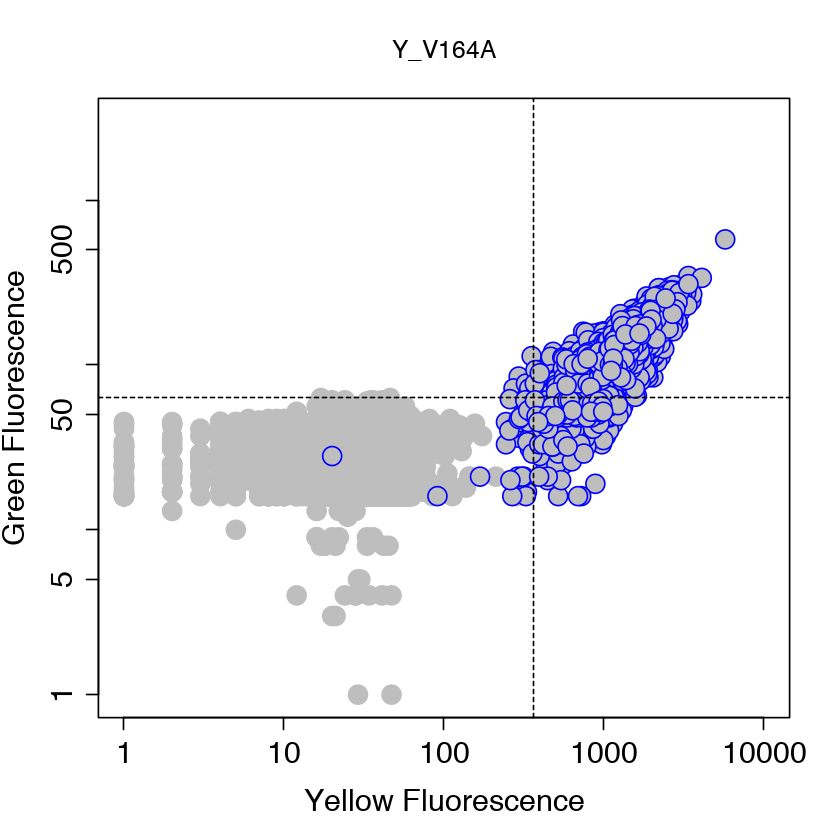

####################

---- Protein=Y204C ----

####################

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


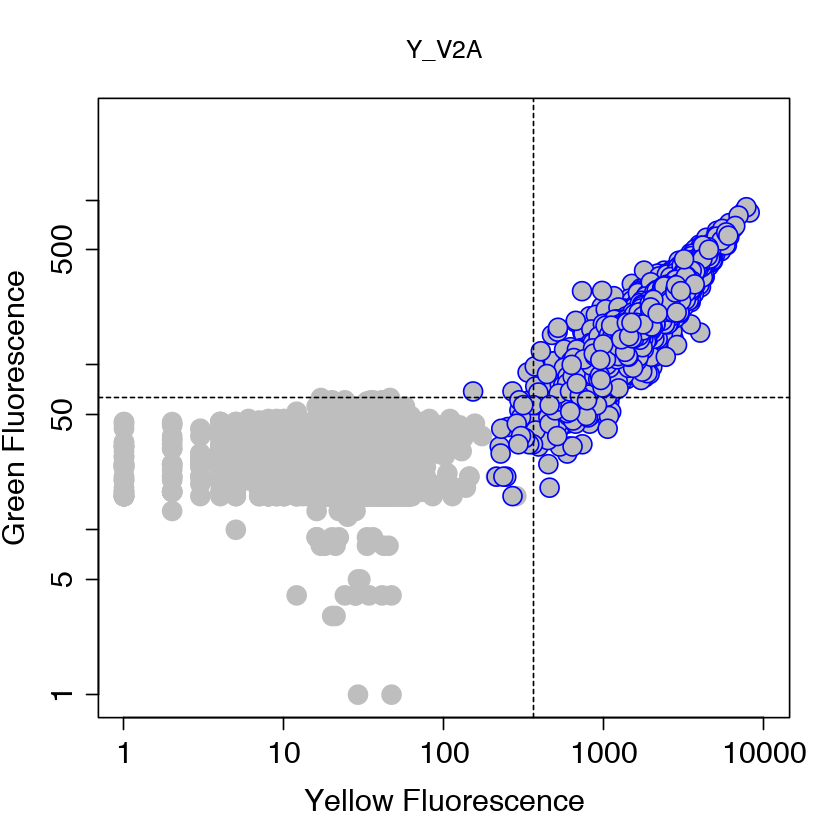

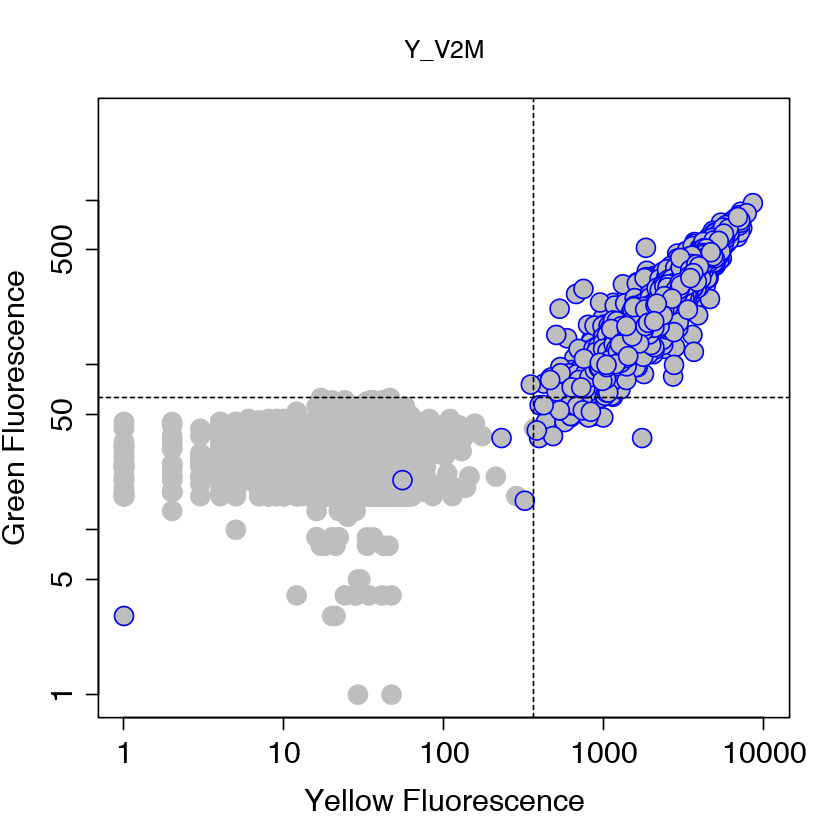

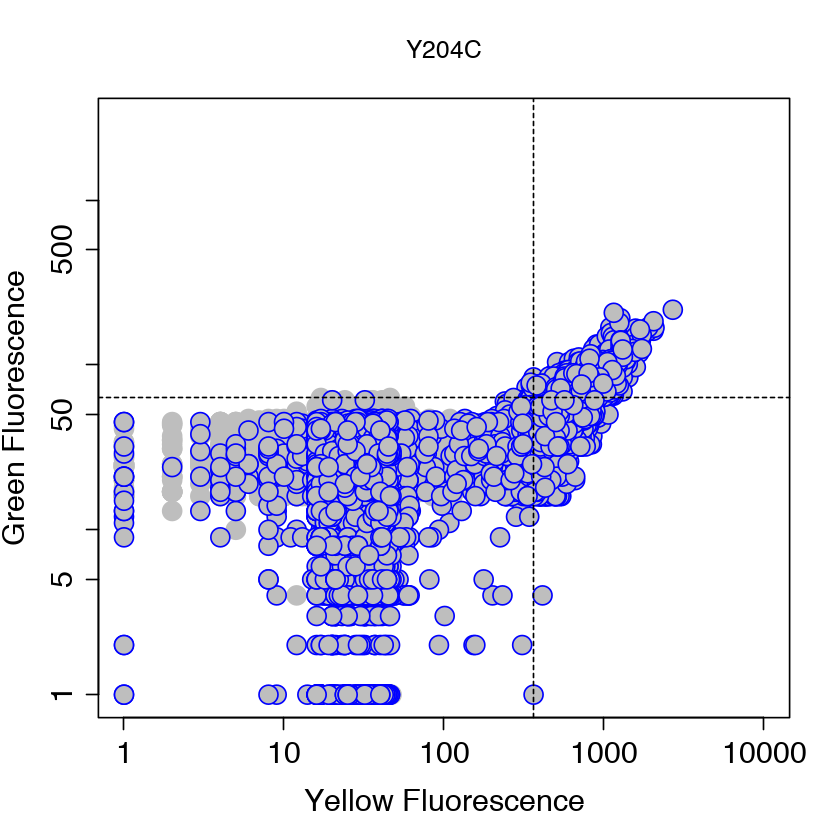

In [94]:
Cor.coeff=Cor.coeff_sd=Cor.pval=rep(NA, length(Folders))

p_val_hetero=matrix(NA, nrow = length(Folders), ncol = 2)

Fraction_active=rep(NA, length(Folders))


for (i in 2:length(Folders)){

setwd(Folders[i])

FACS_files=list.files(pattern = ".fcs")[3]

message("####################")
message("---- Protein=", str_split(Folders[i], pattern = "//", simplify = TRUE)[,2], " ----")
message("####################")


    FACS_temp=read.FCS(FACS_files)
    index_Y=which(colnames(FACS_temp@exprs)=="FITC-H")
    index_G=which(colnames(FACS_temp@exprs)=="AmCyan-H")
    
    #### Yellow and Green components
    Yellow=FACS_temp@exprs[,index_Y]
    Green=FACS_temp@exprs[,index_G]
    COR=cor.test(Yellow, Green, mehod="Spearman")
    
    label=str_split(Folders[1:length(Folders)], pattern = "//", simplify = TRUE)[i,2]
    
    
    plot(Yellow_N, Green_N, pch = 21, cex=2, col="gray", bg="GRAY", lwd=1,  main=label, type="p", xlab="Yellow Fluorescence", ylab="Green Fluorescence", cex.axis=1.5, cex.lab=1.5, log="xy", xlim=c(1,10000), ylim=c(1,3000))
    lines(Yellow, Green, pch = 21, cex=2, type="p", col="blue", bg="GRAY", lwd=1, xlab="Yellow Fluorescence", ylab="Green Fluorescence", cex.axis=1.5, cex.lab=1.5)
    abline(v=max(Yellow_N), lty=2)
    abline(h=max(Green_N), lty=2)
    
    
    index=which( (Yellow > Y_N_max) & (Green> G_N_max) )
    
    Fraction_active[i]=length(index)/length(Yellow)
    Cor.coeff[i]=COR$estimate
    Cor.pval[i]=COR$p.value
    
setwd("~/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/")
}





In [95]:
names(Cor.coeff)=str_split(Folders[1:length(Folders)], pattern = "//", simplify = TRUE)[,2]
names(Cor.pval)=str_split(Folders[1:length(Folders)], pattern = "//", simplify = TRUE)[,2]

In [96]:
names(Cor.pval)

[1] ""        "5G"      "E18G"    "E7K"     "G_F47L"  "G_F65L"  "G_F65S" 
 [8] "G_F72C"  "G_F72I"  "G_I129T" "G_I168V" "G_I172V" "G_K102R" "G_K141R"
[15] "G_N145S" "G_V164A" "G_V2A"   "G_V2M"   "G233D"   "G5S"     "G66S"   
[22] "K102E"   "K157E"   "M79L"    "R110S"   "T"       "T_E18G"  "T_E7K"  
[29] "T_F65L"  "T_F65S"  "T_F72C"  "T_F72I"  "T_G233D" "T_G5S"   "T_I129T"
[36] "T_I168V" "T_I172V" "T_K102E" "T_K102R" "T_K141R" "T_K157E" "T_K167E"
[43] "T_M79L"  "T_N145S" "T_R110S" "T_V164A" "T_V2A"   "T_V2M"   "WT"     
[50] "X_E91A"  "X_F47L"  "X_F72S"  "X_I48V"  "X_K42R"  "X_R74H"  "X_T60S" 
[57] "X_V2A"   "X_V2M"   "Y_F47L"  "Y_F65L"  "Y_F65S"  "Y_F72C"  "Y_F72I" 
[64] "Y_I129T" "Y_I168V" "Y_I172V" "Y_K102R" "Y_K141R" "Y_N145S" "Y_V164A"
[71] "Y_V2A"   "Y_V2M"   "Y204C"

Warning message in cor.test.default(Fraction_active, Cor.coeff, method = "spearman"):
“Cannot compute exact p-value with ties”



	Spearman's rank correlation rho

data:  Fraction_active and Cor.coeff
S = 17005, p-value = 5.031e-13
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.7265855 


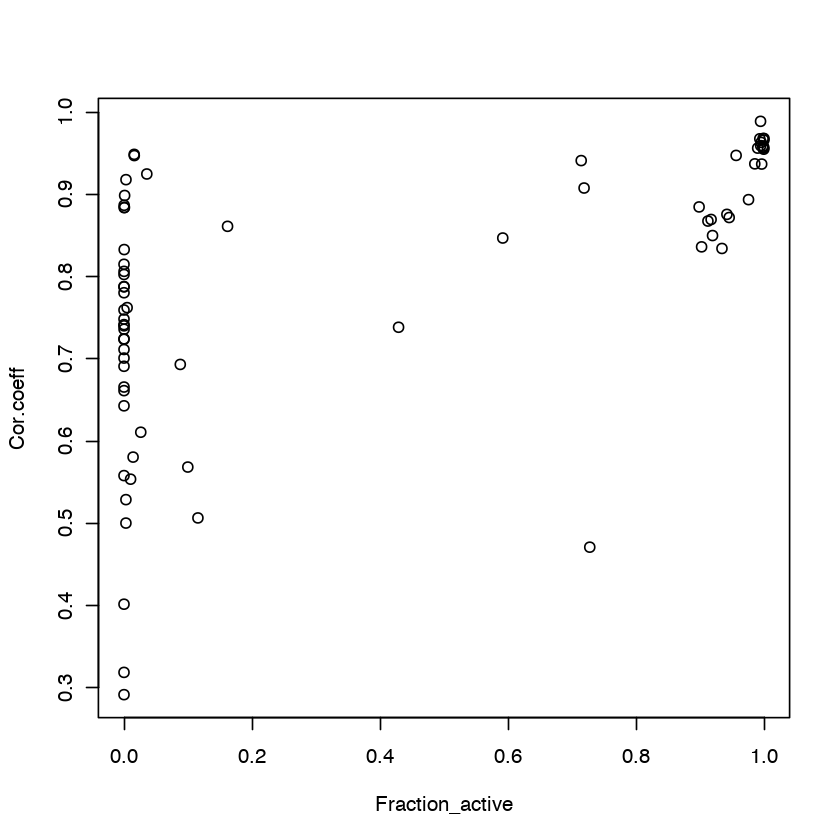

In [99]:
plot(Fraction_active, Cor.coeff)
cor.test(Fraction_active, Cor.coeff, method="spearman")


	Wilcoxon rank sum test

data:  Cor.coeff[index_low] and Cor.coeff[index_high]
W = 96, p-value = 1.907e-10
alternative hypothesis: true location shift is not equal to 0


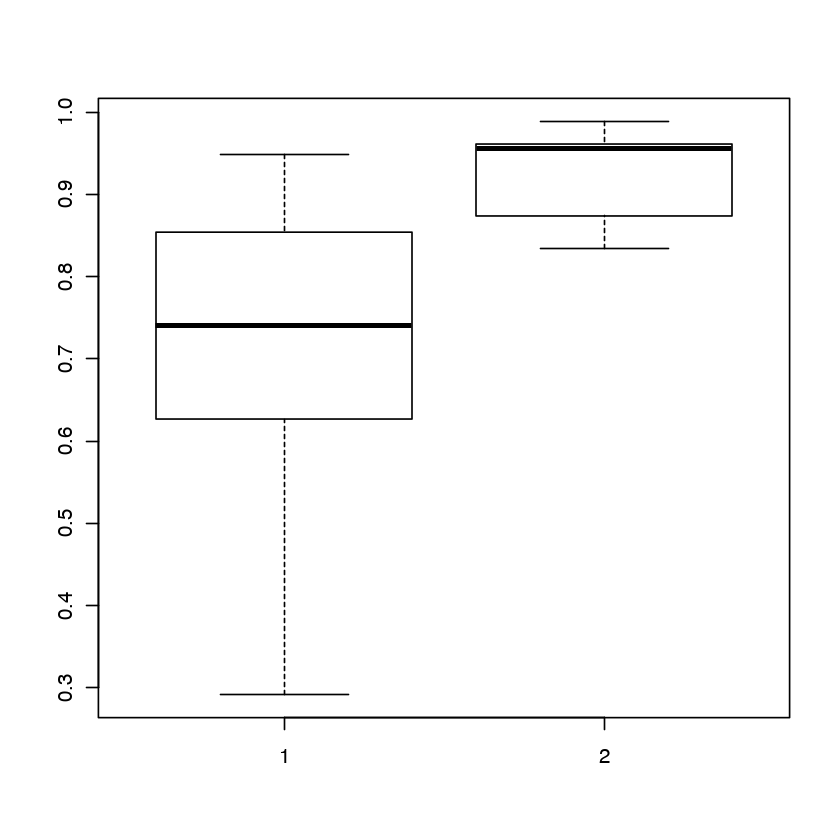

In [111]:
limit=0.9
index_high=which(Fraction_active > limit)
index_low=which(Fraction_active < limit)

boxplot(Cor.coeff[index_low], Cor.coeff[index_high])
wilcox.test(Cor.coeff[index_low], Cor.coeff[index_high])

In [78]:
dat=cbind(Fraction_active, Cor.coeff)
colnames(dat)=c("X1", "X2")
dat=as.data.frame(dat)
rownames(dat)=names(Cor.coeff)

Warning message:
“Removed 1 rows containing missing values (geom_point).”
Warning message:
“Removed 1 rows containing missing values (geom_text_repel).”


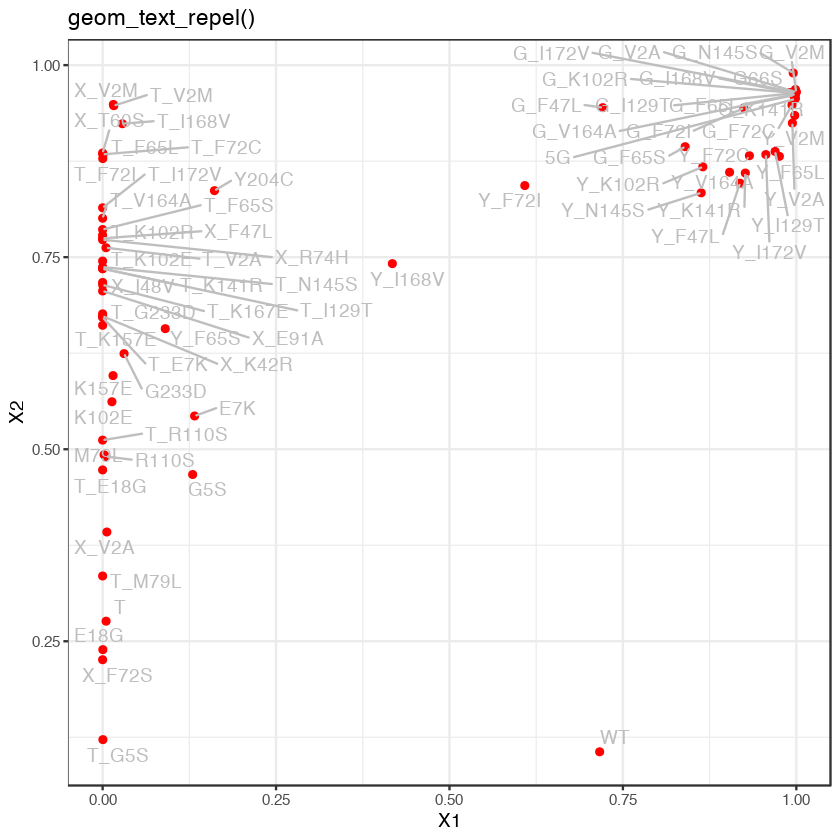

In [39]:
library("ggplot2")
library("ggrepel")

set.seed(42)

#pdf("Fraction_active_cells.pdf")
p <- ggplot(dat, aes(X1, X2, label = rownames(dat))) +
  geom_point(color = "red")+theme_bw()

p <- p + geom_text_repel(max.overlaps=Inf, colour = "gray") + labs(title = "geom_text_repel()")
p
#dev.off()

## Flourescence of S,W, and N populations

#### No selection

In [16]:
FACS_temp=read.FCS("~/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/Experimental_data/SWN_mutagenized_library/mutaN1_C9_C09_025.fcs")
    index_Y=which(colnames(FACS_temp@exprs)=="FITC-H")
    index_G=which(colnames(FACS_temp@exprs)=="AmCyan-H")
    
    #### Yellow and Green components
    Yellow=FACS_temp@exprs[,index_Y]
    Green=FACS_temp@exprs[,index_G]
COR=cor.test(Yellow, Green, mehod="Spearman")
COR$estimate
median(Yellow)

cor 
0.5065553

[1] 28

##### WT

In [18]:
FACS_temp=read.FCS("~/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/Experimental_data/SWN_mutagenized_library/mutaW4_D4_D04_032.fcs")
    index_Y=which(colnames(FACS_temp@exprs)=="FITC-H")
    index_G=which(colnames(FACS_temp@exprs)=="AmCyan-H")
    
    #### Yellow and Green components
    Yellow=FACS_temp@exprs[,index_Y]
    Green=FACS_temp@exprs[,index_G]
COR=cor.test(Yellow, Green, mehod="Spearman")
COR$estimate
COR$p.value
median(Yellow)

cor 
0.787681

[1] 0

[1] 41

##### Strong

In [19]:
FACS_temp=read.FCS("~/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/Experimental_data/SWN_mutagenized_library/mutaS4_C4_C04_020.fcs")
    index_Y=which(colnames(FACS_temp@exprs)=="FITC-H")
    index_G=which(colnames(FACS_temp@exprs)=="AmCyan-H")
    
    #### Yellow and Green components
    Yellow=FACS_temp@exprs[,index_Y]
    Green=FACS_temp@exprs[,index_G]
COR=cor.test(Yellow, Green, mehod="Spearman")
COR$estimate
median(Yellow)

cor 
0.821462

[1] 759.5

##### Weak

In [20]:
FACS_temp=read.FCS("~/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/Experimental_data/SWN_mutagenized_library/mutaW4_D4_D04_032.fcs")
    index_Y=which(colnames(FACS_temp@exprs)=="FITC-H")
    index_G=which(colnames(FACS_temp@exprs)=="AmCyan-H")
    
    #### Yellow and Green components
    Yellow=FACS_temp@exprs[,index_Y]
    Green=FACS_temp@exprs[,index_G]
COR=cor.test(Yellow, Green, mehod="Spearman")
COR$estimate
median(Yellow)

cor 
0.787681

[1] 41

In [13]:
28/41

[1] 0.6829268

### Emission spectrum of YFP variants

In [2]:
SPECTRUM=read.csv("~/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/Experimental_data/Jia_Science_paper2_data/figure_2A.csv")

In [3]:
Mutants=unique(SPECTRUM$Mutation)

In [9]:
emission_peak=matrix(NA, nrow = 24, ncol = 2)

for (i in 1:24){

index_mutants=which(SPECTRUM$Mutation==Mutants[i])

Wavelength=SPECTRUM$Wavelength[index_mutants]
Relative_green=SPECTRUM$Relative_green_emission[index_mutants]
mat=SPECTRUM[index_mutants,]
mat=mat[order(mat$Relative_green_emission, decreasing = TRUE),]    
  
    
mat=mat[which(mat$Wavelength > 500),]
emission_peak[i,1]=mean(mat$Wavelength[1:3])
emission_peak[i,2]=sd(mat$Wavelength[1:3])
    
}

rownames(emission_peak)=Mutants

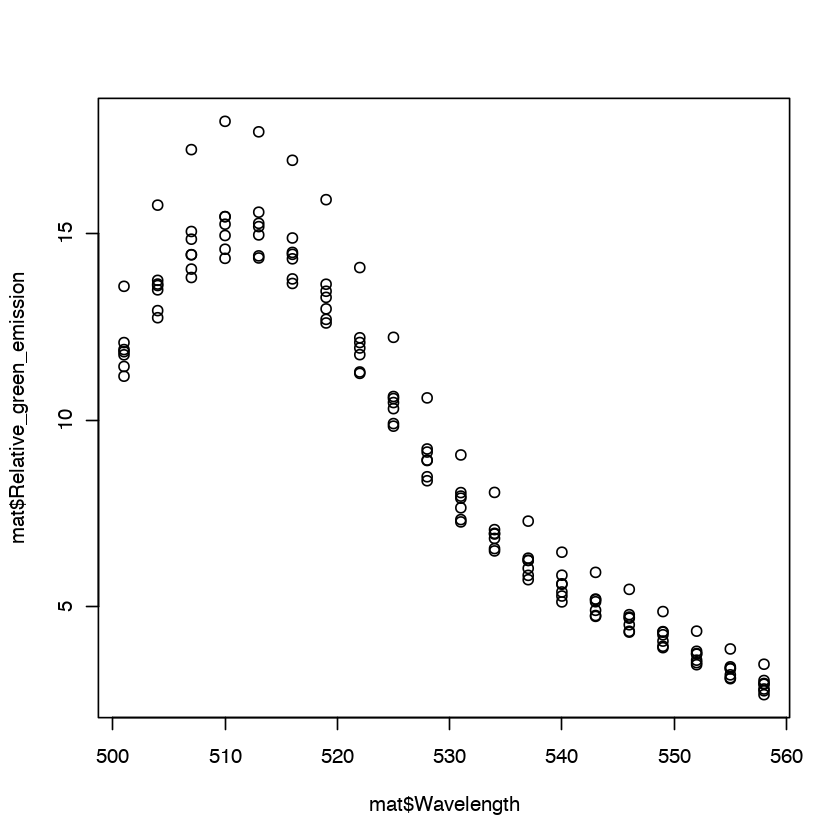

In [10]:
plot(mat$Wavelength, mat$Relative_green_emission)

In [11]:
write.csv(emission_peak,"emission_peak_1.csv")

In [12]:
SPECTRUM=read.csv("~/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/Experimental_data/Jia_Science_paper2_data/figure_2B.csv")

In [13]:
Mutants=unique(SPECTRUM$Mutation)

In [14]:
emission_peak=matrix(NA, nrow = 21, ncol = 2)

for (i in 1:21){
index_mutants=which(SPECTRUM$Mutation==Mutants[i])

Wavelength=SPECTRUM$Wavelength[index_mutants]
Relative_green=SPECTRUM$Relative_green_emission[index_mutants]
mat=SPECTRUM[index_mutants,]
mat=mat[order(mat$Relative_green_emission, decreasing = TRUE),]    
  
mat=mat[which(mat$Wavelength > 500),]

emission_peak[i,1]=mean(mat$Wavelength[1:3])
emission_peak[i,2]=sd(mat$Wavelength[1:3])
    
}

rownames(emission_peak)=Mutants

In [15]:
write.csv(emission_peak,"emission_peak_2.csv")

In [ ]:
### Negative Control

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“104 x values <= 0 omitted from logarithmic plot”
Warning message in xy.coords(x, y, xlabel, ylabel, log):
“4 y values <= 0 omitted from logarithmic plot”
Warning message in xy.coords(x, y, xlabel, ylabel, log):
“110 x values <= 0 omitted from logarithmic plot”
Warning message in xy.coords(x, y, xlabel, ylabel, log):
“1 y value <= 0 omitted from logarithmic plot”
Warning message in xy.coords(x, y, xlabel, ylabel, log):
“88 x values <= 0 omitted from logarithmic plot”
Warning message in xy.coords(x, y, xlabel, ylabel, log):
“2 y values <= 0 omitted from logarithmic plot”


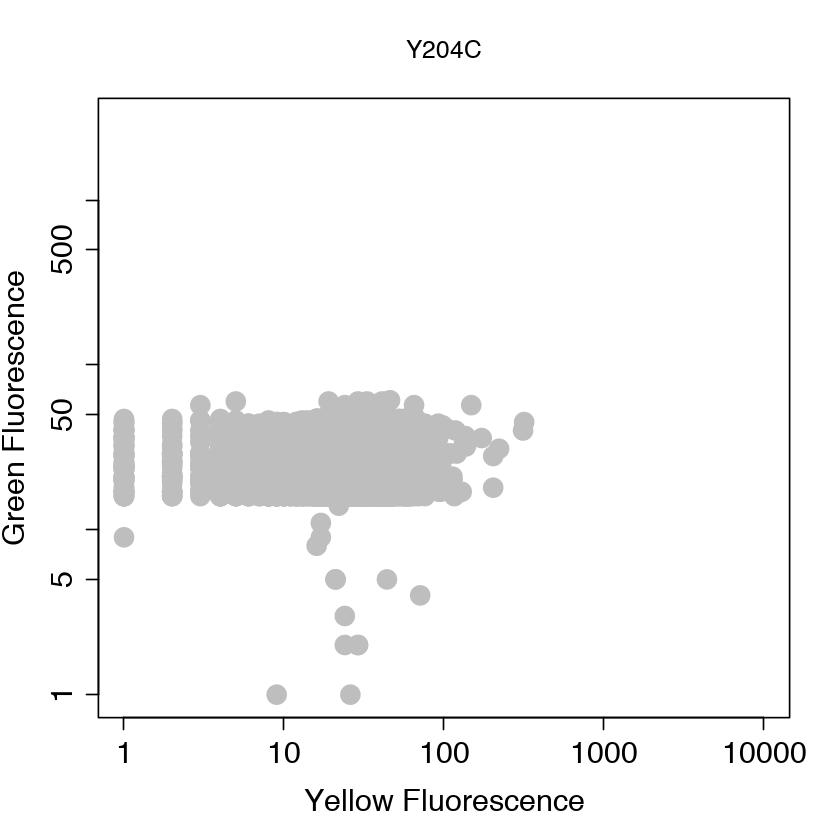

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“93 x values <= 0 omitted from logarithmic plot”
Warning message in xy.coords(x, y, xlabel, ylabel, log):
“23 y values <= 0 omitted from logarithmic plot”


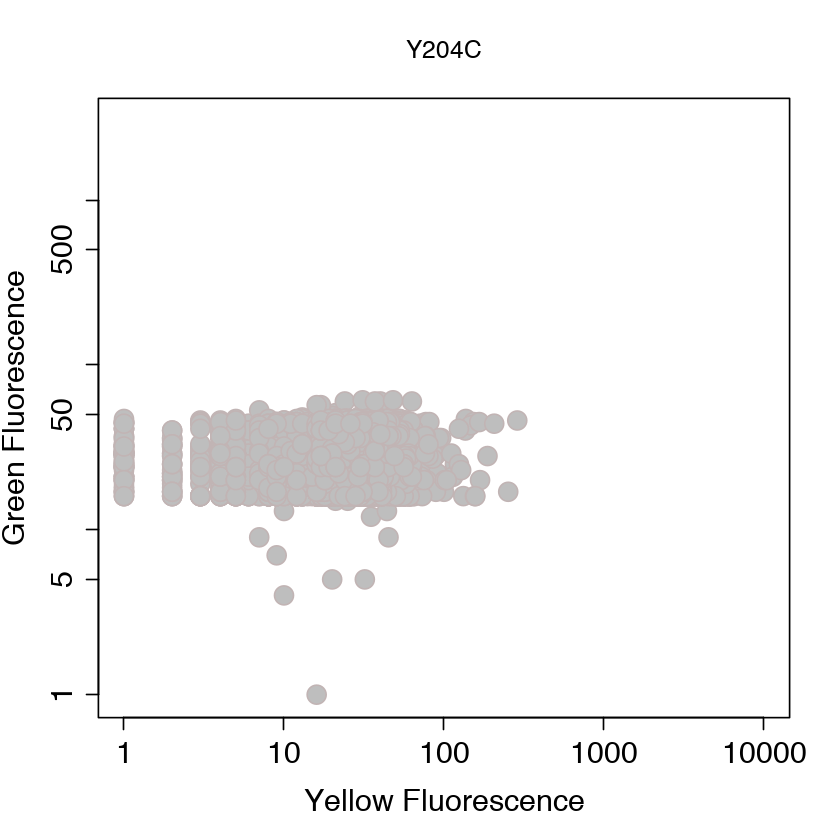

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“106 x values <= 0 omitted from logarithmic plot”
Warning message in xy.coords(x, y, xlabel, ylabel, log):
“10 y values <= 0 omitted from logarithmic plot”


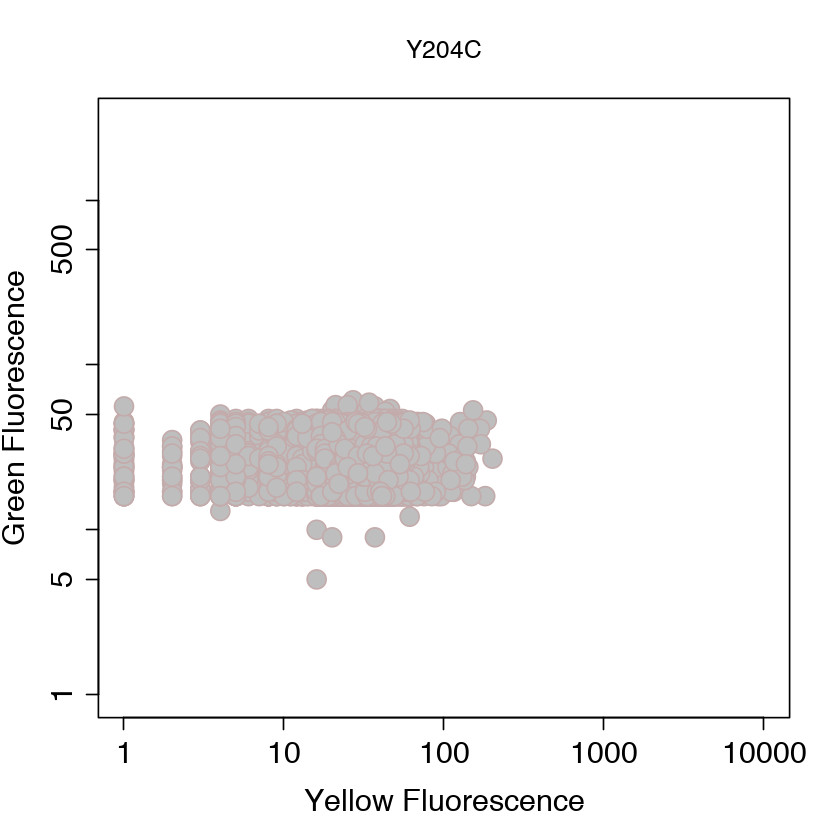

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“83 x values <= 0 omitted from logarithmic plot”
Warning message in xy.coords(x, y, xlabel, ylabel, log):
“16 y values <= 0 omitted from logarithmic plot”


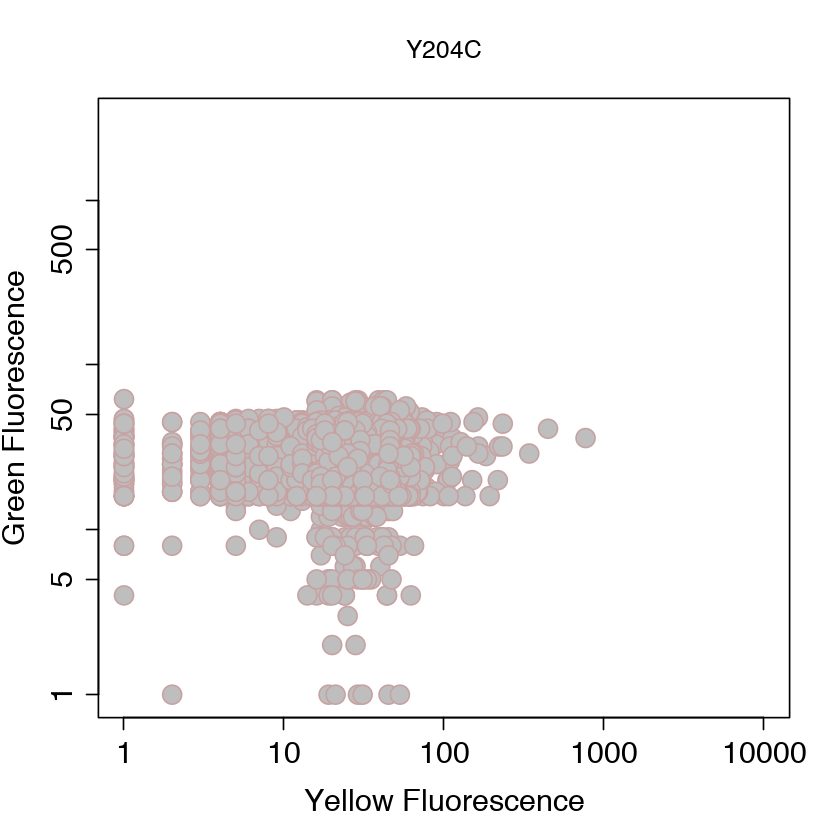

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“81 x values <= 0 omitted from logarithmic plot”


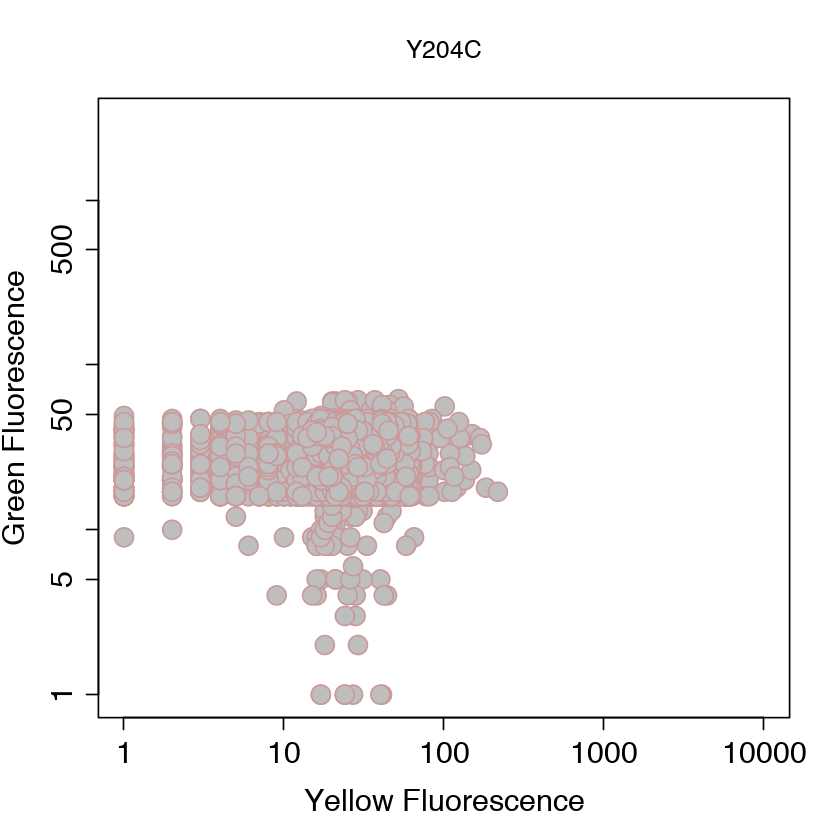

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“98 x values <= 0 omitted from logarithmic plot”
Warning message in xy.coords(x, y, xlabel, ylabel, log):
“12 y values <= 0 omitted from logarithmic plot”


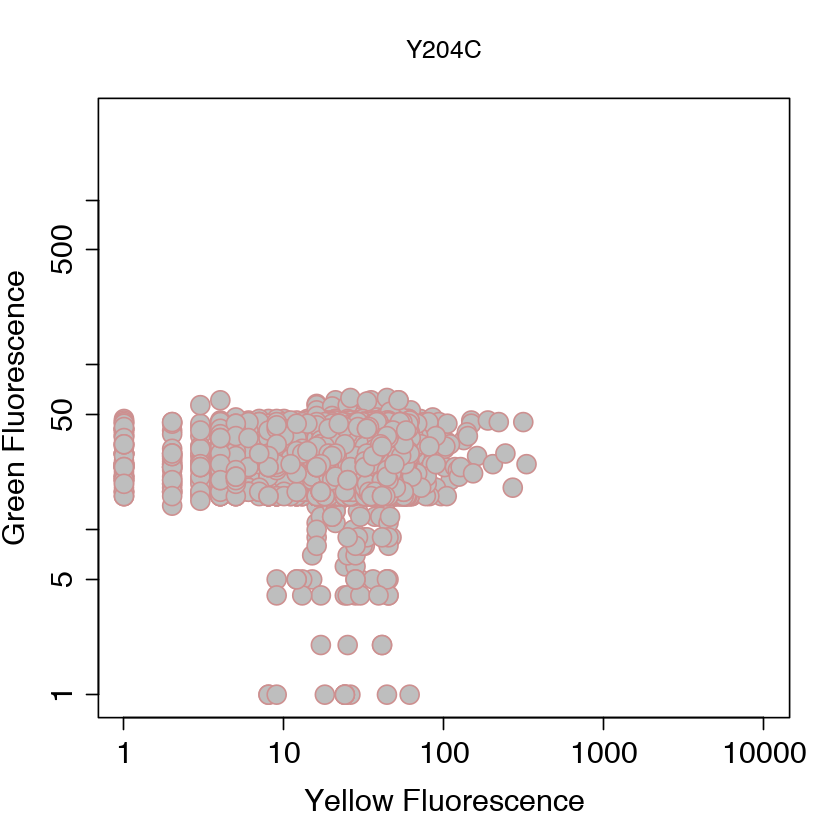

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“56 x values <= 0 omitted from logarithmic plot”


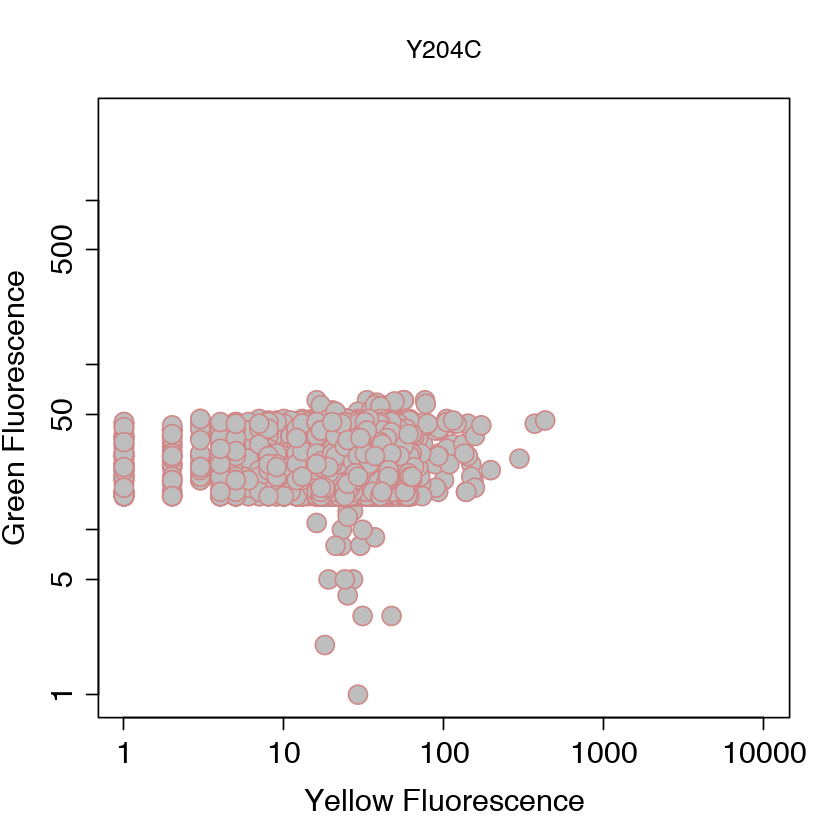

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“67 x values <= 0 omitted from logarithmic plot”


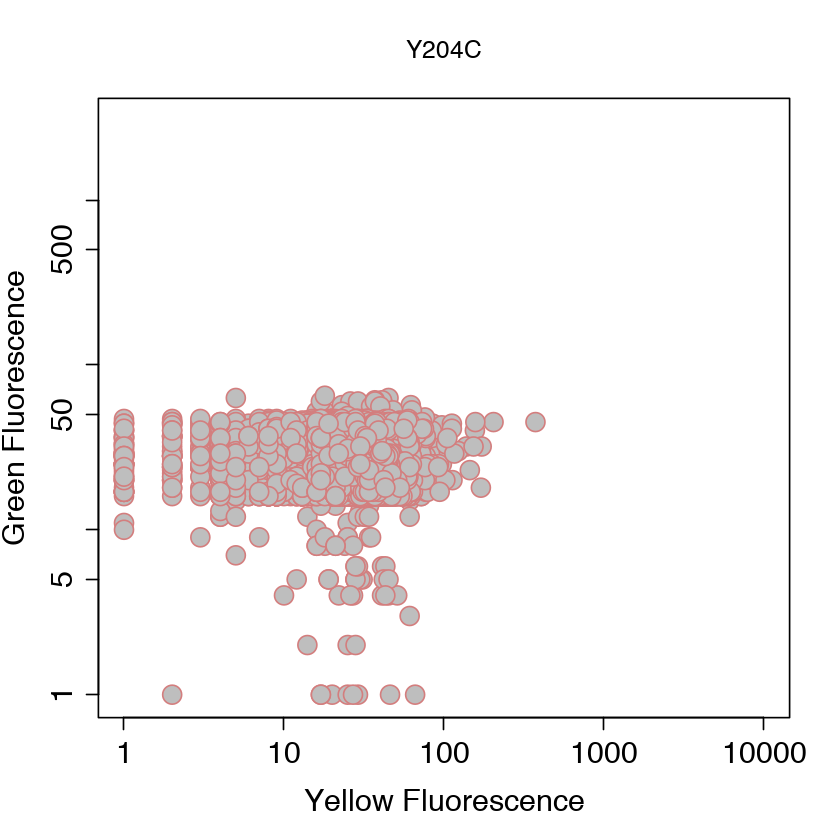

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“81 x values <= 0 omitted from logarithmic plot”
Warning message in xy.coords(x, y, xlabel, ylabel, log):
“7 y values <= 0 omitted from logarithmic plot”


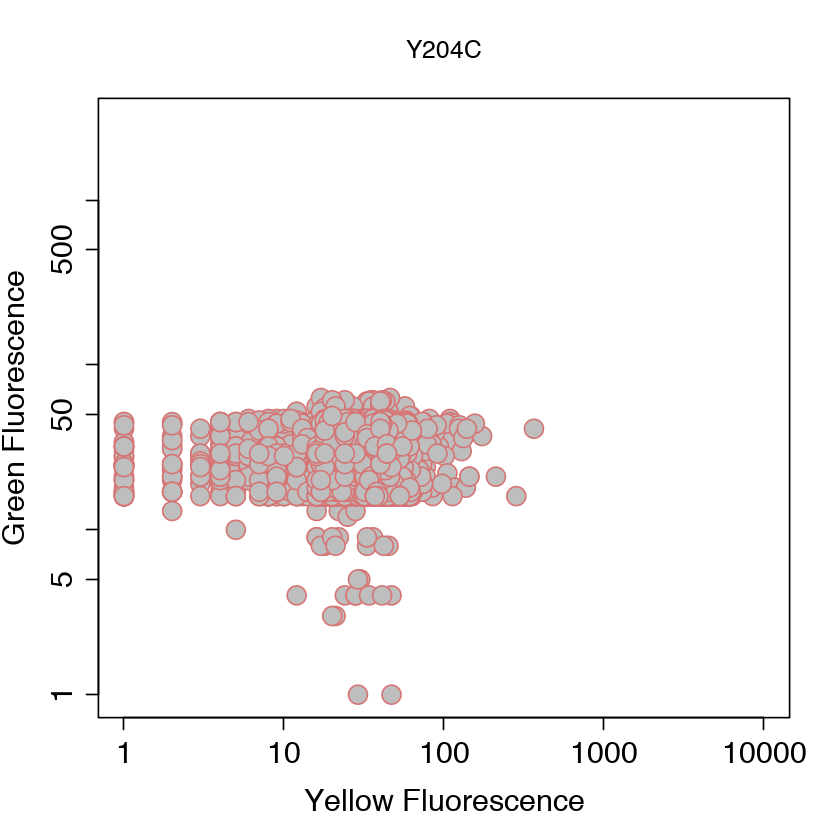

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“44 x values <= 0 omitted from logarithmic plot”


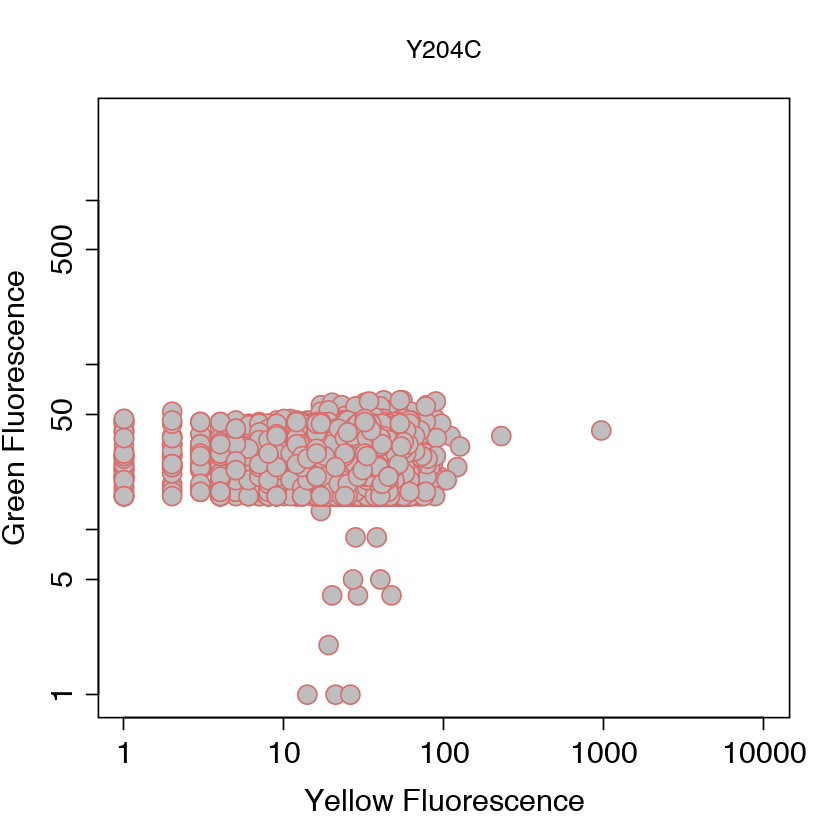

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“59 x values <= 0 omitted from logarithmic plot”
Warning message in xy.coords(x, y, xlabel, ylabel, log):
“4 y values <= 0 omitted from logarithmic plot”


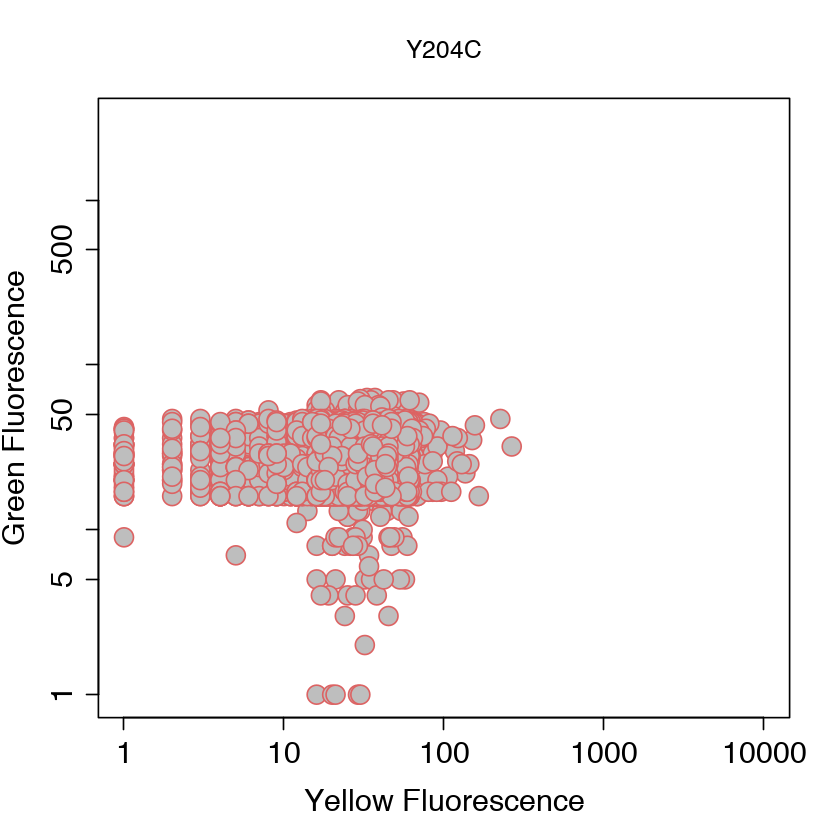

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“52 x values <= 0 omitted from logarithmic plot”
Warning message in xy.coords(x, y, xlabel, ylabel, log):
“2 y values <= 0 omitted from logarithmic plot”


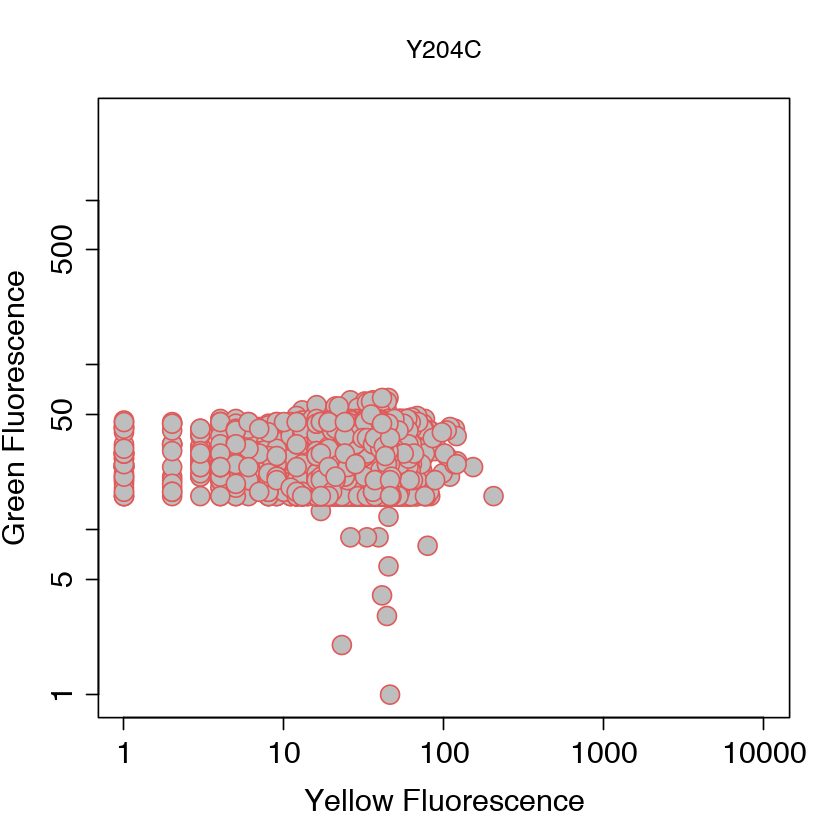

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“33 x values <= 0 omitted from logarithmic plot”
Warning message in xy.coords(x, y, xlabel, ylabel, log):
“1 y value <= 0 omitted from logarithmic plot”


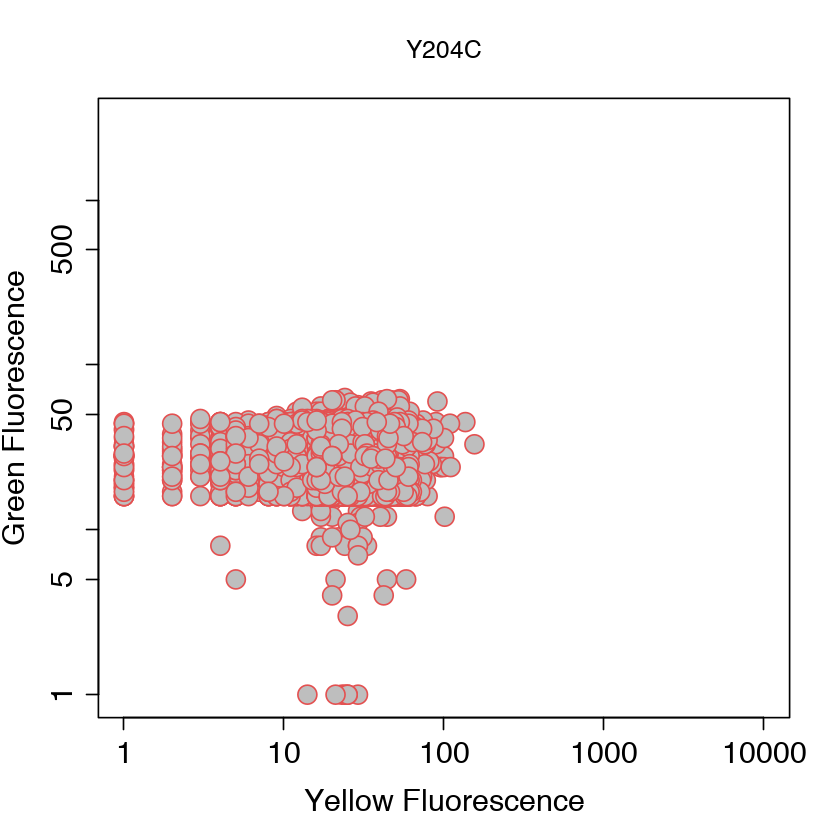

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“69 x values <= 0 omitted from logarithmic plot”
Warning message in xy.coords(x, y, xlabel, ylabel, log):
“3 y values <= 0 omitted from logarithmic plot”


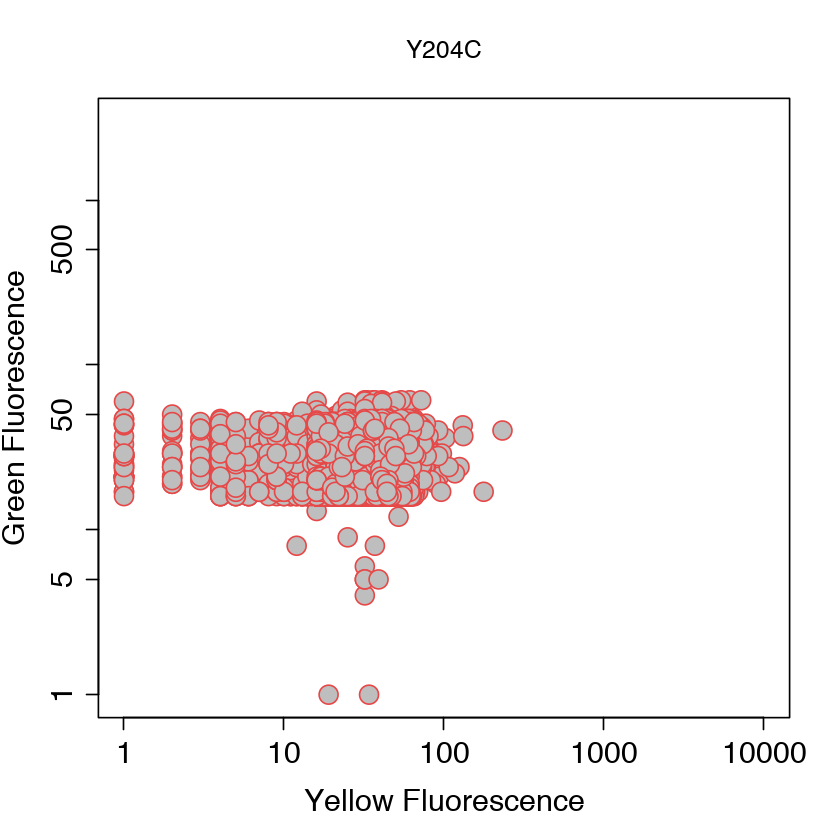

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“27 x values <= 0 omitted from logarithmic plot”
Warning message in xy.coords(x, y, xlabel, ylabel, log):
“1 y value <= 0 omitted from logarithmic plot”


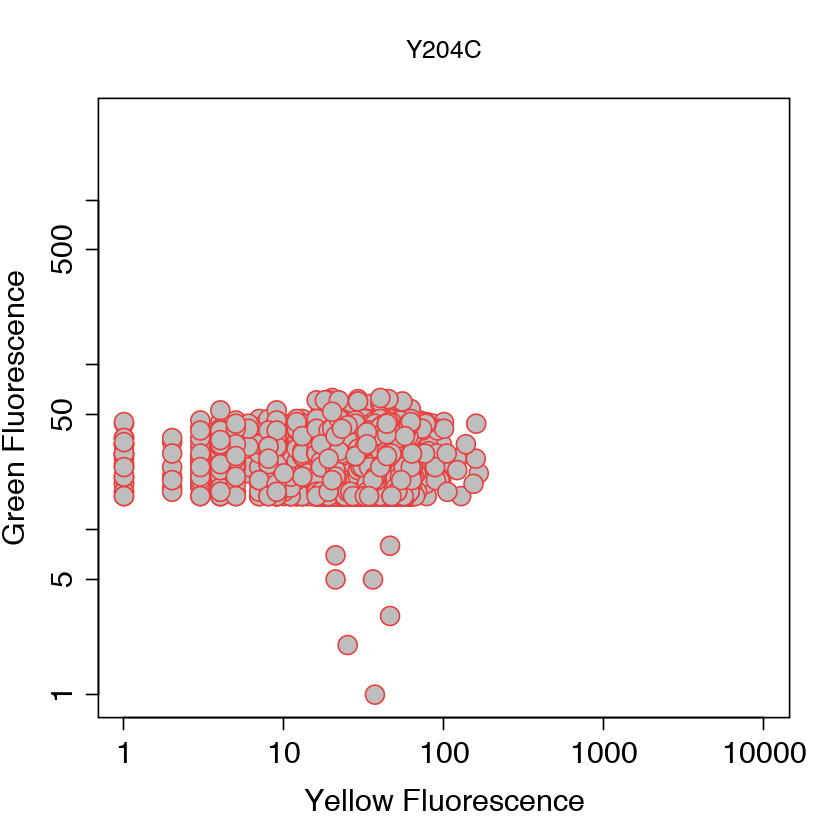

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“43 x values <= 0 omitted from logarithmic plot”
Warning message in xy.coords(x, y, xlabel, ylabel, log):
“2 y values <= 0 omitted from logarithmic plot”


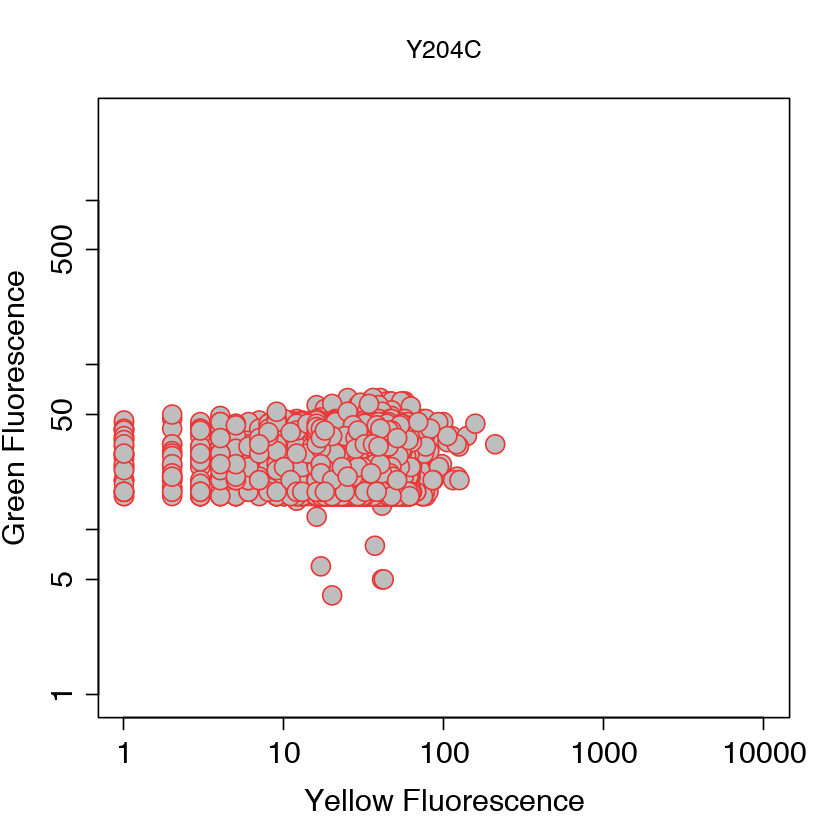

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“9 x values <= 0 omitted from logarithmic plot”
Warning message in xy.coords(x, y, xlabel, ylabel, log):
“558 y values <= 0 omitted from logarithmic plot”


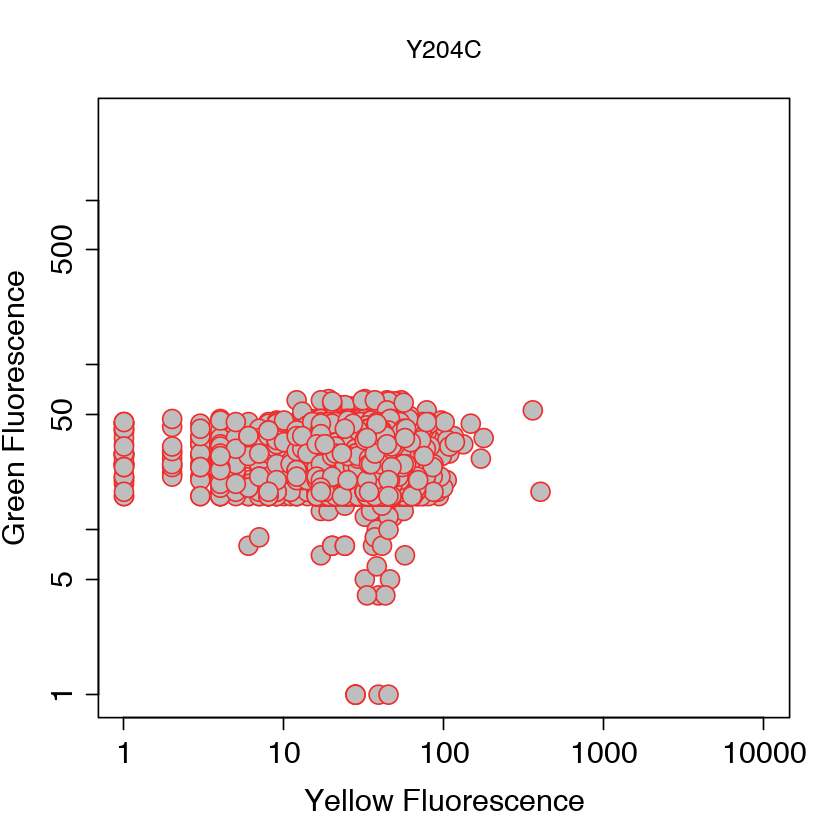

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“10 x values <= 0 omitted from logarithmic plot”
Warning message in xy.coords(x, y, xlabel, ylabel, log):
“580 y values <= 0 omitted from logarithmic plot”


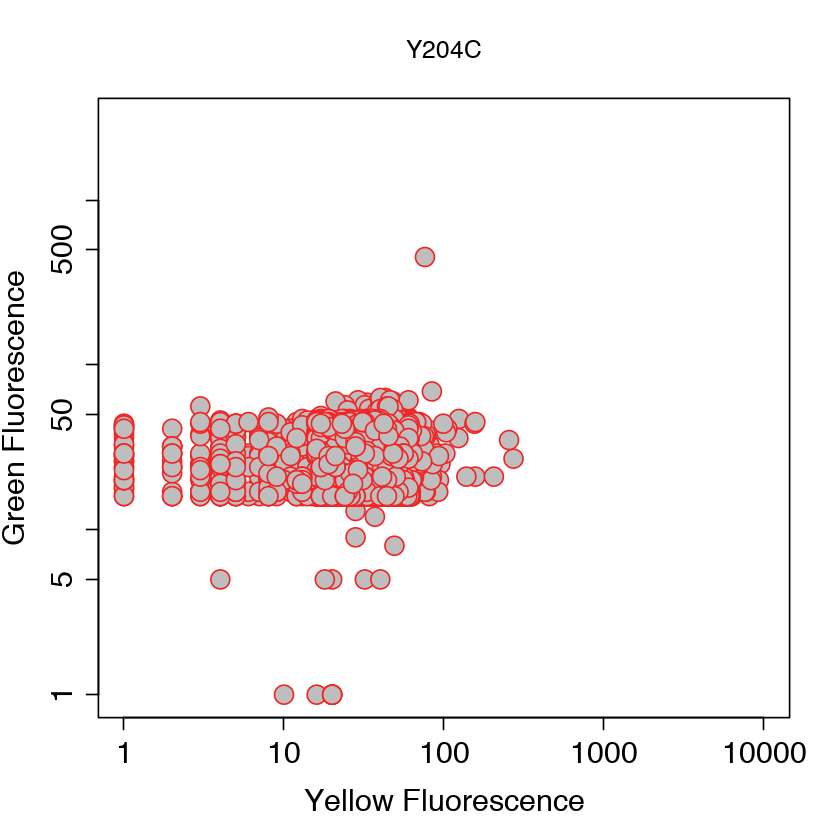

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“11 x values <= 0 omitted from logarithmic plot”
Warning message in xy.coords(x, y, xlabel, ylabel, log):
“599 y values <= 0 omitted from logarithmic plot”


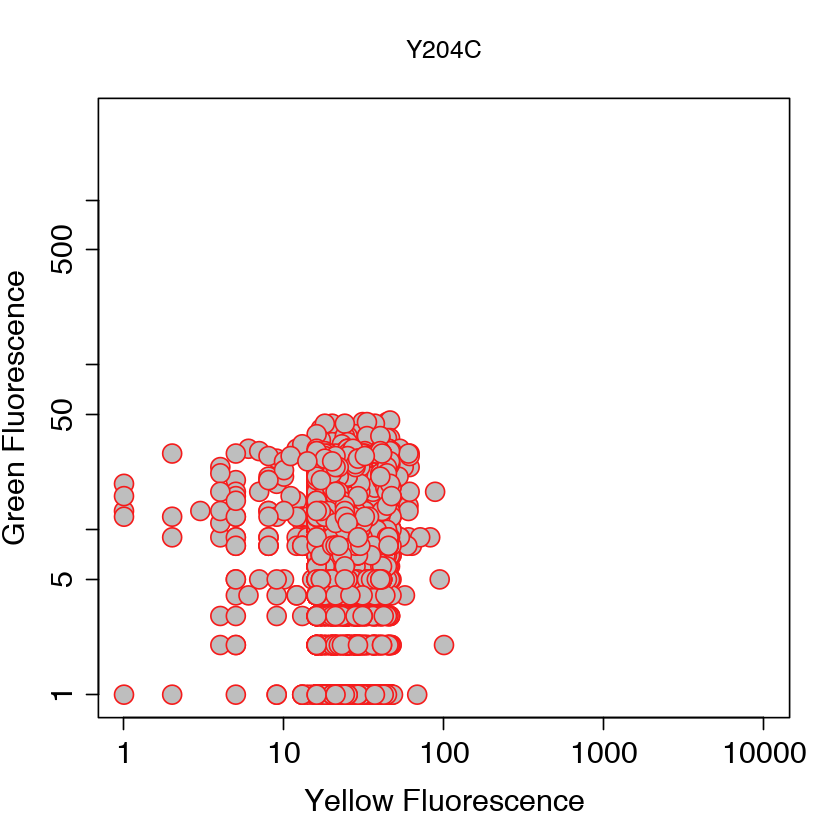

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“23 x values <= 0 omitted from logarithmic plot”
Warning message in xy.coords(x, y, xlabel, ylabel, log):
“515 y values <= 0 omitted from logarithmic plot”


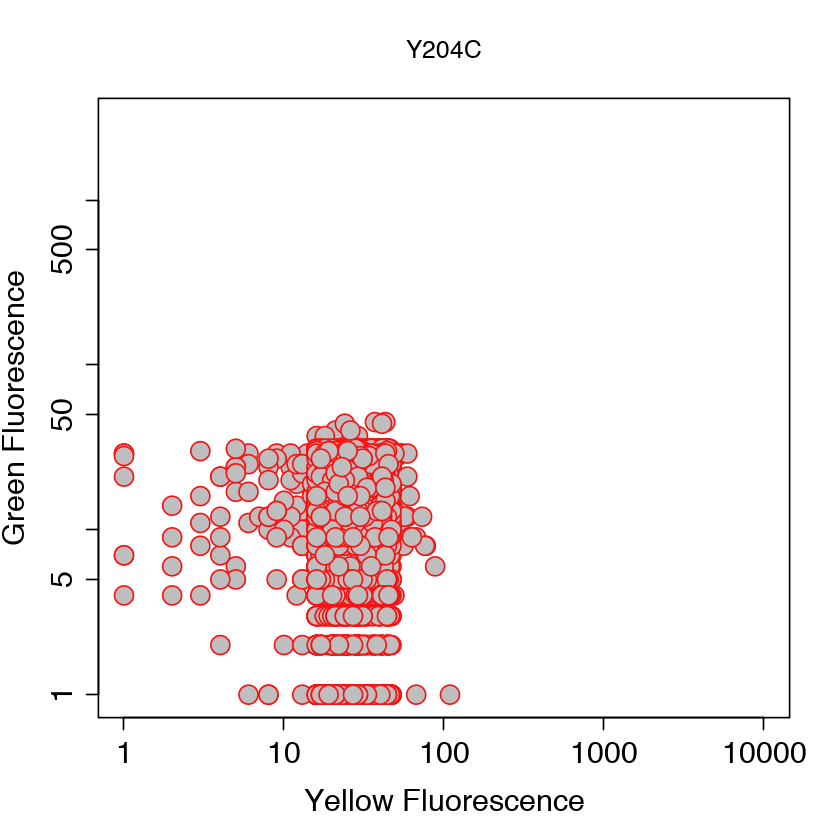

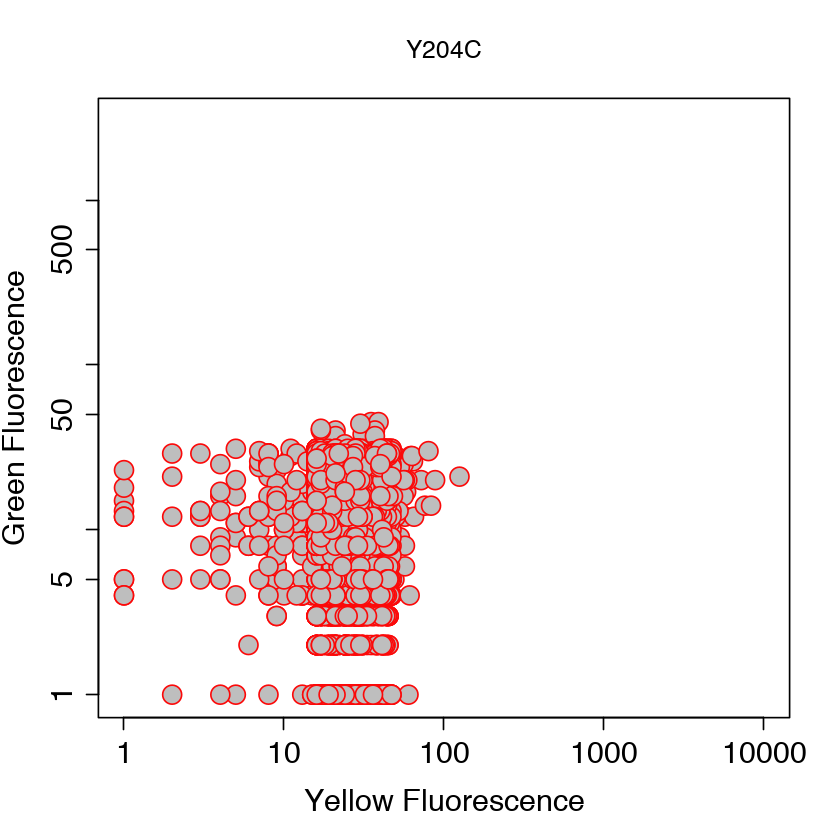

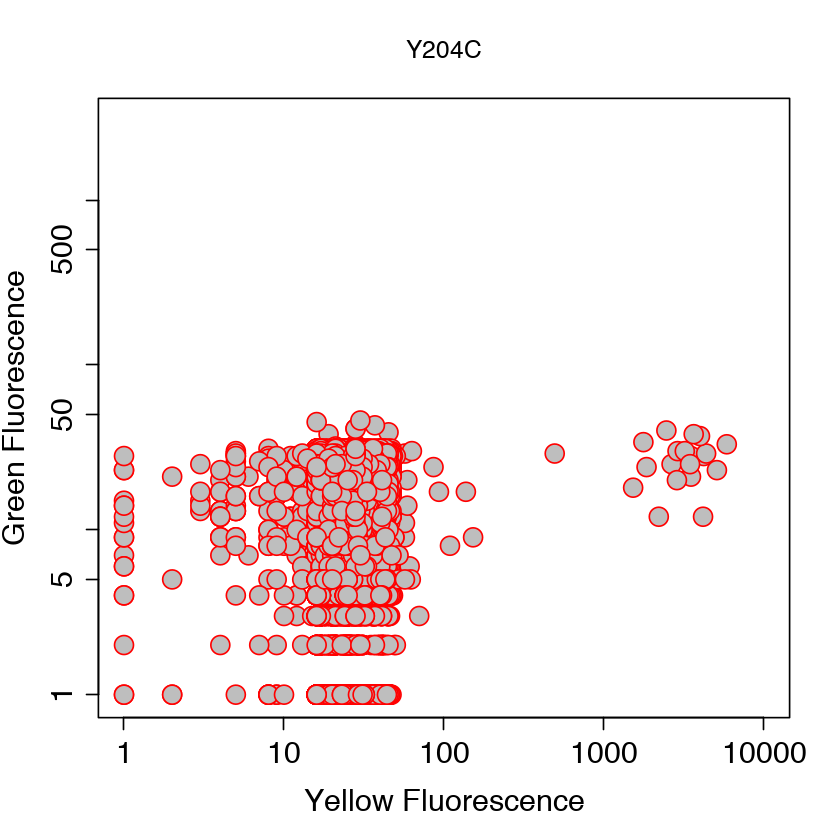

In [68]:
setwd("~/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/Mutants_categorized_folders/Neg/")

FACS_files=list.files(pattern = ".fcs")

colfunc <- colorRampPalette(c("gray", "red"))
cols=colfunc(length(FACS_files))

for (i in 1:length(FACS_files)){


    FACS_temp=read.FCS(FACS_files[i])
    index_Y=which(colnames(FACS_temp@exprs)=="FITC-H")
    index_G=which(colnames(FACS_temp@exprs)=="AmCyan-H")
    
    #### Yellow and Green components
    Yellow=FACS_temp@exprs[,index_Y]
    Green=FACS_temp@exprs[,index_G]
    
    #COR=cor.test(Yellow, Green, mehod="Spearman") 
    #label=str_split(Folders[1:length(Folders)], pattern = "//", simplify = TRUE)[i,2]
    
    #if (i==1){
    plot(Yellow, Green, pch = 21, cex=2, col=cols[i], bg="GRAY", lwd=1,  main=label, type="p", xlab="Yellow Fluorescence", ylab="Green Fluorescence", cex.axis=1.5, cex.lab=1.5, log="xy", xlim=c(1,10000), ylim=c(1,3000))
    #lines(Yellow, Green, pch = 21, cex=2, type="p", col="blue", bg="GRAY", lwd=1, xlab="Yellow Fluorescence", ylab="Green Fluorescence", cex.axis=1.5, cex.lab=1.5)
    #abline(v=max(Yellow_N), lty=2)
    #abline(h=max(Green_N), lty=2)
    #} else {
    
    #lines(Yellow_N, Green_N, type="p",pch = 21, cex=2, col=cols[i], bg="GRAY", lwd=1,  main=label, xlab="Yellow Fluorescence", ylab="Green Fluorescence", cex.axis=1.5, cex.lab=1.5, log="xy", xlim=c(1,10000), ylim=c(1,3000))
   
        
    #}
    
    #index=which( (Yellow > Y_N_max) | (Green> G_N_max) )
    
    #Fraction_active[i]=length(index)/length(Yellow)
    #Cor.coeff[i]=COR$estimate
    #Cor.pval[i]=COR$p.value

}
    
setwd("~/Dropbox/Wagner_Lab/Projects/Project_3_Evolvability_Model/single_mutants_FACS/")

In [69]:
FACS_temp

flowFrame object 'aa2a8c86-fa29-46fe-9ca1-fc4e388cffe1'
with 10000 cells and 16 observables:
               name desc  range minRange maxRange
$P1           FSC-A <NA> 262144  -111.00   262143
$P2           FSC-H <NA> 262144     0.00   262143
$P3           FSC-W <NA> 262144     0.00   262143
$P4           SSC-A <NA> 262144   -19.11   262143
$P5           SSC-H <NA> 262144     0.00   262143
$P6           SSC-W <NA> 262144     0.00   262143
$P7          FITC-A <NA> 262144   -55.51   262143
$P8          FITC-H <NA> 262144     0.00   262143
$P9          FITC-W <NA> 262144     0.00   262143
$P10       AmCyan-A <NA> 262144   -59.86   262143
$P11       AmCyan-H <NA> 262144     0.00   262143
$P12       AmCyan-W <NA> 262144     0.00   262143
$P13 Pacific Blue-A <NA> 262144  -111.00   262143
$P14 Pacific Blue-H <NA> 262144     0.00   262143
$P15 Pacific Blue-W <NA> 262144     0.00   262143
$P16           Time <NA> 262144     0.00   262143
232 keywords are stored in the 'description' slot